# How to run this notebook

This notebook uses features from **deepbgc** library. In order to run everything, please follow instructions from the official github repository  https://github.com/Merck/deepbgc. To sum up:
- add following channels to conda:
`conda config --add channels bioconda
conda config --add channels conda-forge`
- create conda environment with following dependencies:
`conda create -n deepbgc python=3.7 hmmer prodigal`
- download trained models and Pfam database
`deepbgc download`

If your conda environment dependencies (importing deepbgc library etc.) do not work within jupyter notebook despite activating the environment, I highly recommend creating a kernel within jupyter that contains all the dependencies.

In [1]:
import os
os.getcwd()

'mibig_v3_retraining'

# Load and preprocess data

We start by loading dataset that was derived from the latest version of **MIBiG** database (https://mibig.secondarymetabolites.org). This database contains all confirmed BGCs (Biosynthetic Gene Clusters). This will serve as training/validation dataset (after necessary preprocessing). 

Following TSV file  was generated by running `deepbgc prepare` command, which is part of deepbgc suite (https://github.com/Merck/deepbgc). 

In [1]:
import pandas as pd

mibig_path = 'data/mibig_gbk_3.0_modified.tsv'
df_mibig = pd.read_csv(mibig_path, sep='\t')

In [2]:
df_mibig.head()

,sequence_id,protein_id,gene_start,gene_end,gene_strand,pfam_id,in_cluster
0,BGC0000001,AEK75490.1,0,1083,1,PF02353,1
1,BGC0000001,AEK75490.1,0,1083,1,PF01135,1
2,BGC0000001,AEK75490.1,0,1083,1,PF01269,1
3,BGC0000001,AEK75490.1,0,1083,1,PF13489,1
4,BGC0000001,AEK75490.1,0,1083,1,PF01596,1


In [3]:
df_mibig.shape

(128508, 7)

From this dataframe we aim to get representation of each unique BGC (e.g. BGC0000001) based on the PFAM (protein family) domains that its genes are part of.

For this purpose we utilize two transformers from **deepbgc** suite (https://github.com/Merck/deepbgc/blob/master/deepbgc/features.py). Each of them creates a vector representation for each BGC.
- One-Hot Encoding (each column represents pfam domain)
- Pfam2Vec (same principle as word2vec, where words = pfam IDs)

In [8]:
from deepbgc.features import OneHotEncodingTransformer
from deepbgc.features import Pfam2VecTransformer

one_hot_transformer = OneHotEncodingTransformer()

In [9]:
one_hot_transformer.fit(df_mibig)

OneHotEncodingTransformer(column='pfam_id', sequence_as_vector=True)

In [226]:
X_one_hot = df_mibig.groupby('sequence_id').apply(one_hot_transformer.transform)
X_one_hot.head()

,PF00003,PF00004,PF00005,PF00006,PF00009,PF00010,PF00011,PF00012,PF00013,PF00015,...,PF17425,PF17475,PF17476,PF17481,PF17482,PF17508,PF17561,PF17584,PF17597,PF17608
sequence_id,,,,,,,,,,,,,,,,,,,,,
BGC0000001,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
BGC0000002,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
BGC0000003,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
BGC0000004,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
BGC0000006,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [227]:
X_one_hot.shape[0]

2508

In [228]:
pfam_path = 'data/pfam2vec.csv'
pfam_transformer = Pfam2VecTransformer(pfam_path)

In [229]:
pfam_transformer.fit(df_mibig)
pfam_transformer.transform(df_mibig)

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
0,0.091737,0.035681,0.013573,-0.122994,-0.019060,-0.229864,-0.058648,-0.048853,-0.172447,0.218539,...,0.045446,-0.064316,-0.069112,0.064450,-0.143578,0.111123,0.007237,0.035690,-0.074377,-0.076069
1,0.060732,0.000572,0.119919,-0.105984,-0.022173,-0.154447,-0.120274,-0.088147,-0.072502,0.253007,...,0.173287,0.003312,-0.032279,0.181074,-0.099912,0.089006,0.017965,0.001213,-0.111003,-0.132803
2,0.040142,0.025651,0.181047,-0.092811,-0.068009,-0.201400,-0.207862,0.033490,-0.049221,0.186422,...,0.044922,-0.227429,-0.145788,0.040295,-0.047489,0.090876,0.097004,0.013899,-0.142765,0.017622
3,0.118171,-0.016357,0.037680,-0.204327,-0.006286,-0.198166,-0.096475,0.009999,-0.232545,0.202379,...,0.099057,-0.068689,-0.101599,0.015019,-0.114992,0.096352,0.010451,0.112589,-0.101048,-0.138861
4,0.048106,0.053074,0.063808,-0.051082,-0.009053,-0.098054,-0.061828,-0.014169,0.023819,0.416641,...,0.132708,-0.061069,0.036354,0.035329,-0.150578,0.078387,0.031693,-0.021140,-0.032962,-0.080652
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
128503,0.030092,-0.040274,-0.239220,-0.176645,-0.038881,0.181309,0.117223,0.073091,-0.094916,0.231319,...,-0.040927,0.039867,-0.096281,-0.111458,-0.044784,0.072604,0.062070,0.096572,-0.058726,-0.025595
128504,-0.067404,-0.086369,-0.193421,-0.216380,-0.113381,0.228533,0.125289,0.094965,-0.066031,0.266181,...,-0.030799,0.020898,-0.122169,-0.144500,-0.029129,0.028723,0.106295,0.147962,-0.116863,-0.039749
128505,-0.068584,-0.071045,-0.175550,-0.137073,-0.026405,0.118639,0.178954,0.074795,-0.003862,0.126152,...,-0.030230,-0.053123,-0.198551,-0.109013,0.071102,0.038915,0.154919,0.206397,-0.140801,-0.067331
128506,-0.074714,-0.084294,-0.188414,-0.136117,-0.059678,0.166617,0.149550,0.127315,-0.027121,0.202839,...,-0.020423,0.005255,-0.216660,-0.125585,0.021306,0.040268,0.160667,0.193417,-0.110728,-0.058832


In [230]:
X_pfam = df_mibig.groupby('sequence_id').apply(lambda df: pfam_transformer.transform(df).mean())
X_pfam.head()

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
sequence_id,,,,,,,,,,,,,,,,,,,,,
BGC0000001,0.036802,-0.003706,-0.075885,-0.060421,0.001721,0.021919,0.015025,-0.001351,-0.063447,0.175894,...,-0.024494,-0.036387,-0.055472,-0.076163,-0.022293,0.029081,0.028980,0.014519,-0.040327,-0.088128
BGC0000002,-0.007160,-0.010854,-0.115230,-0.094834,-0.007562,0.060961,0.037848,0.051232,-0.040852,0.208629,...,-0.046805,-0.042689,-0.086455,-0.115093,-0.000182,0.027244,0.037643,0.042077,-0.056173,-0.072031
BGC0000003,0.023694,-0.021314,-0.088008,-0.118746,0.035559,0.010275,0.037113,0.036812,-0.057252,0.220763,...,0.007239,-0.045065,-0.008780,-0.053730,-0.056715,0.076145,0.040385,0.014484,-0.051852,-0.092670
BGC0000004,0.005670,-0.003508,-0.126136,-0.088389,0.007273,0.049815,0.028474,0.048989,-0.046200,0.209965,...,-0.001485,-0.006421,-0.036695,-0.090219,-0.045076,0.016933,0.040786,0.047244,-0.024940,-0.039617
BGC0000006,0.007616,-0.002804,-0.127041,-0.086421,0.007025,0.050000,0.029710,0.046669,-0.048951,0.208025,...,-0.000387,-0.004769,-0.037240,-0.085286,-0.044560,0.021548,0.042107,0.047381,-0.026101,-0.039669


If we have number of highly similar entries (BGCs) in the training set it can introduce a bias that as an effect hinders successful classification of validation/test data. For this reason we used **BiG-SCAPE** (https://bio.tools/BiG-SCAPE), which performs clustering of BGCs, and we will only keep one entry from each cluster.

In [190]:
# get rid of highly similar BGCs ("duplicates")
duplicates = pd.read_csv("data/clustering.txt", sep="\t")
duplicates.head()

,family_id,n,BGCs_id
0,710,2,",BGC0000756,BGC0000757"
1,1344,2,",BGC0001452,BGC0001522"
2,2238,5,",BGC0000096,BGC0000113,BGC0001931,BGC0002033,B..."
3,1348,3,",BGC0000633,BGC0001227,BGC0001456"
4,7,5,",BGC0000004,BGC0000006,BGC0000007,BGC0000008,B..."


In [197]:
duplicates.BGCs_id = duplicates.BGCs_id.apply(lambda x: x.replace(',', '', 1))

In [198]:
duplicates.head()

,family_id,n,BGCs_id
0,710,2,"BGC0000756,BGC0000757"
1,1344,2,"BGC0001452,BGC0001522"
2,2238,5,"BGC0000096,BGC0000113,BGC0001931,BGC0002033,BG..."
3,1348,3,"BGC0000633,BGC0001227,BGC0001456"
4,7,5,"BGC0000004,BGC0000006,BGC0000007,BGC0000008,BG..."


In [200]:
duplicates['BGCs_to_keep'] = duplicates.BGCs_id.apply(lambda x: x.split(",")[0])
duplicates.head()

,family_id,n,BGCs_id,BGCs_to_keep
0,710,2,"BGC0000756,BGC0000757",BGC0000756
1,1344,2,"BGC0001452,BGC0001522",BGC0001452
2,2238,5,"BGC0000096,BGC0000113,BGC0001931,BGC0002033,BG...",BGC0000096
3,1348,3,"BGC0000633,BGC0001227,BGC0001456",BGC0000633
4,7,5,"BGC0000004,BGC0000006,BGC0000007,BGC0000008,BG...",BGC0000004


In [205]:
duplicates['BGCs_to_drop'] = duplicates.apply(lambda row: str(row.BGCs_id.split(',')[1:row.n]).replace('[','').replace(']','').replace('\'','') ,axis=1)
duplicates.head()

,family_id,n,BGCs_id,BGCs_to_keep,BGCs_to_drop
0,710,2,"BGC0000756,BGC0000757",BGC0000756,BGC0000757
1,1344,2,"BGC0001452,BGC0001522",BGC0001452,BGC0001522
2,2238,5,"BGC0000096,BGC0000113,BGC0001931,BGC0002033,BG...",BGC0000096,"BGC0000113, BGC0001931, BGC0002033, BGC0002452"
3,1348,3,"BGC0000633,BGC0001227,BGC0001456",BGC0000633,"BGC0001227, BGC0001456"
4,7,5,"BGC0000004,BGC0000006,BGC0000007,BGC0000008,BG...",BGC0000004,"BGC0000006, BGC0000007, BGC0000008, BGC0000009"


In [208]:
duplicates_list = []
for row in duplicates['BGCs_to_drop']:
    for el in row.replace(' ','').split(','):
        duplicates_list.append(el)
len(duplicates_list)

400

In [209]:
duplicates_list[:10]

['BGC0000757',
 'BGC0001522',
 'BGC0000113',
 'BGC0001931',
 'BGC0002033',
 'BGC0002452',
 'BGC0001227',
 'BGC0001456',
 'BGC0000006',
 'BGC0000007']

In [217]:
len(set(X_one_hot.index).intersection(set(duplicates_list)))

399

In [218]:
for d in duplicates_list:
    if d not in set(X_one_hot.index):
        print(d)

BGC0000482


In [219]:
duplicates_list.remove('BGC0000482')
len(duplicates_list)

399

In [231]:
X_one_hot = X_one_hot.drop(duplicates_list)
X_pfam = X_pfam.drop(duplicates_list)

The purpose of this analysis is to predict a class of secondary metabolite(s) that are produced by each BGC. Since production of each individual types of metabolites are not mutually exclusive (meaning they can produce more than one type of metabolite), we will perform ***multi-label classification***. Following dataset was obtained by simple data mining script from the MiBIG GenBank file (mostly using Biopython library): 

In [15]:
classes_path = 'data/MIBiG_3.0_classes.csv'
df_classes =  pd.read_csv(classes_path)
df_classes.head()

,sequence_id,Alkaloid,NRP,Other,Polyketide,RiPP,Saccharide,Terpene
0,BGC0000972,0,1,0,1,0,0,0
1,BGC0000966,0,1,0,1,0,0,0
2,BGC0002181,0,0,0,0,0,0,1
3,BGC0001488,0,0,1,0,0,0,0
4,BGC0000796,0,0,0,0,0,1,0


In [16]:
Y = df_classes.set_index('sequence_id').loc[X_one_hot.index]
Y.head()

,Alkaloid,NRP,Other,Polyketide,RiPP,Saccharide,Terpene
sequence_id,,,,,,,
BGC0000001,0,0,0,1,0,0,0
BGC0000002,0,0,0,1,0,0,0
BGC0000003,0,0,0,1,0,0,0
BGC0000004,0,0,0,1,0,0,0
BGC0000006,0,0,0,1,0,0,0


## Classification

First we started by trying out number of different classification methods that are part of sklearn. Original published paper (https://academic.oup.com/nar/article/47/18/e110/5545735) used **Random Forest** Classifier with input modified by one-hot encoding. 

In order to properly evaluate the prediction I use RepeatedKFold to perform 3 times 5-fold cross-validation.

In [312]:
import warnings
warnings.filterwarnings('ignore')

from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import cross_validate, cross_val_predict, RepeatedKFold, train_test_split
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, multilabel_confusion_matrix, roc_curve, roc_auc_score
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

CV_FOLDS = 5
N_REPEATS = 3
RANDOM_STATE = 48

def display_scores(scores, std):
    print('====================')
    print('Accuracy: ' + str(scores['accuracy']) + '(' + str(std['accuracy']) + ')')
    print('F1 score: ' + str(scores['f1_score']) + '(' + str(std['f1_score']) + ')')
    print('Precision: ' + str(scores['precision']) + '(' + str(std['precision']) + ')')
    print('Recall: ' + str(scores['recall']) + '(' + str(std['recall']) + ')')
    print('AUC: ' + str(scores['auc']) + '(' + str(std['auc']) + ')')
    print('====================')


def proba_preprocess(proba): #takes array returned by model.predict_proba and extracts probabilities of class '1'
    new_list = []
    for el in list(proba):
        new_list.append(list(el)[1])
    
    return new_list

def get_auc(y, proba, label, mlp=False):
    base_fpr = np.linspace(0, 1, 101)
    
    if mlp:
        y_pred_proba = proba
    else:
        y_pred_proba = proba_preprocess(proba)
    y = list(y[label])
    
    fpr, tpr, _ = roc_curve(y, y_pred_proba)
    auc = roc_auc_score(y, y_pred_proba)
    auc = round(auc, 4)
    
    tpr = np.interp(base_fpr, fpr, tpr)
    tpr[0] = 0.0
    
    return auc, tpr

def get_avg_auc(y, proba, mlp=False):
    avg_auc = []
    tprs = []
    
    if mlp: #different format of predicted probabilities than other sklearn methods
        num_labels = len(list(proba)[0])
        for j in range(0, num_labels):
            label_proba = []
            for el in list(proba):
                label_proba.append(list(el)[j])
            auc,tpr = get_auc(y=y, proba=label_proba, label=y.columns[j], mlp=mlp)
            avg_auc.append(auc)
            tprs.append(tpr)
            
    else:
        for i in range(0,len(y.columns)):
            auc, tpr = get_auc(y=y, proba=proba[i], label=y.columns[i], mlp=mlp)
            avg_auc.append(auc)
            tprs.append(tpr)
    
    return round(sum(avg_auc)/len(avg_auc), 4), avg_auc, tprs

def plot_roc_curves_for_all_labels(auc_labels, tprs_labels, labels_names, model, encoding):
    base_fpr = np.linspace(0, 1, 101)
    
    for i in range(len(labels_names)):
        tprs = [] # sets of TPRs of each label
        aucs = []
        for j in range(len(tprs_labels)):
            tprs.append(tprs_labels[j][i])
            aucs.append(auc_labels[j][i])
        
        tprs = np.array(tprs)
        mean_tprs = tprs.mean(axis=0)
        std = tprs.std(axis=0)

        tprs_upper = np.minimum(mean_tprs + std, 1)
        tprs_lower = mean_tprs - std

        mean_auc = np.mean(aucs).round(4)
        std_auc = np.std(aucs).round(4)

        plt.plot(base_fpr, mean_tprs, label='AUC = ' + str(mean_auc) + ' (' + str(std_auc) + ')', color = 'blue')
        plt.fill_between(base_fpr, tprs_lower, tprs_upper, color='grey', alpha=0.3)

            
        plt.xlim([-0.01, 1.01])
        plt.ylim([-0.01, 1.01])
            
        plt.ylabel('True Positive Rate')
        plt.xlabel('False Positive Rate')
        plt.legend(loc=4, prop={'size': 15})
        plt.title(labels_names[i])
        plt.savefig('data/roc_curves/roc_' + model + '_' + encoding + '_' + labels_names[i] + '.png')
        plt.show()
            
    
def make_classification(X, y, model, model_name, encoding, nn=False, n_epochs=200, learning_rate=0.0001, mlp=False, plot_roc_curves=True):    
    accuracy = []
    f1 = []
    precision = []
    recall = []
    auc = []
    auc_labels_list = []
    tprs_labels_list = []
    
    
    cv = RepeatedKFold(n_splits=CV_FOLDS, n_repeats=N_REPEATS, random_state=RANDOM_STATE)
    repeat_state = 0
    
    for i, (train_ix, test_ix) in enumerate(cv.split(X)):
        
        if i % 5 == 0:
            repeat_state += 1
        
        X_train, X_test = X.iloc[train_ix], X.iloc[test_ix]
        y_train, y_test = y.iloc[train_ix], y.iloc[test_ix]
        
        if nn:
            callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=10)
            m = clone_model(model)
            m.compile(loss='binary_crossentropy', optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate))
            
            X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.15, shuffle=True)
            
            history = m.fit(X_train, y_train, verbose=0, epochs=n_epochs, callbacks=[callback], validation_data=(X_val, y_val), shuffle=True)
            print('Split: ' + str(i) + ', repeat: ' + str(repeat_state))
            print('Epochs before early stopping: ' + str(len(history.history['loss'])))
            
            # plot training and validation loss
            plt.plot(history.history['loss'])
            plt.plot(history.history['val_loss'])
            plt.title('model loss, split: ' + str(i) + ', repeat: ' + str(repeat_state))
            plt.ylabel('loss')
            plt.xlabel('epoch')
            plt.legend(['training', 'validation'], loc='best')
            plt.show()
            
            y_pred_proba = m.predict(X_test) 
            y_pred = y_pred_proba.round()
            
        else:
            model.fit(X_train, y_train)
            y_pred_proba = model.predict_proba(X_test)
            y_pred = model.predict(X_test)
        
        accuracy.append(accuracy_score(y_test, y_pred))
        f1.append(f1_score(y_test, y_pred, average='weighted'))
        precision.append(precision_score(y_test, y_pred, average='weighted'))
        recall.append(recall_score(y_test, y_pred, average='weighted'))
        
        avg_auc, auc_labels, tpr_labels = get_avg_auc(y_test, y_pred_proba, mlp)
        auc.append(avg_auc)
        auc_labels_list.append(auc_labels)
        tprs_labels_list.append(tpr_labels)

    results = {'accuracy': np.mean(accuracy).round(4),
              'f1_score': np.mean(f1).round(4),
              'precision': np.mean(precision).round(4),
              'recall': np.mean(recall).round(4),
              'auc': np.mean(auc).round(4)}
    
    std = {'accuracy': np.std(accuracy).round(4),
              'f1_score': np.std(f1).round(4),
              'precision': np.std(precision).round(4),
              'recall': np.std(recall).round(4),
              'auc': np.std(auc).round(4)}
    
    display_scores(results, std)
    
    if plot_roc_curves:
        plot_roc_curves_for_all_labels(auc_labels=auc_labels_list, tprs_labels=tprs_labels_list, labels_names=y.columns, model=model_name, encoding=encoding)
    
    return results, std

Enconding: One-hot encoding
Model: Random Forest
Accuracy: 0.1892(0.011)
F1 score: 0.3114(0.0113)
Precision: 0.4952(0.0318)
Recall: 0.248(0.013)
AUC: 0.6254(0.0195)


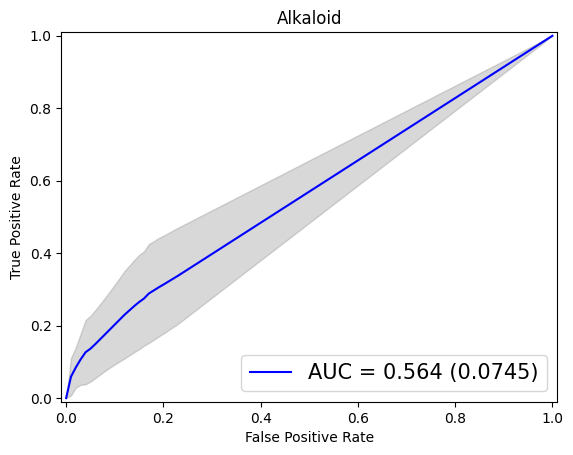

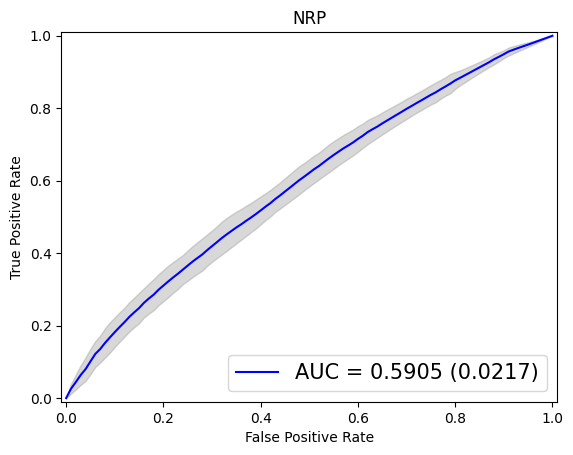

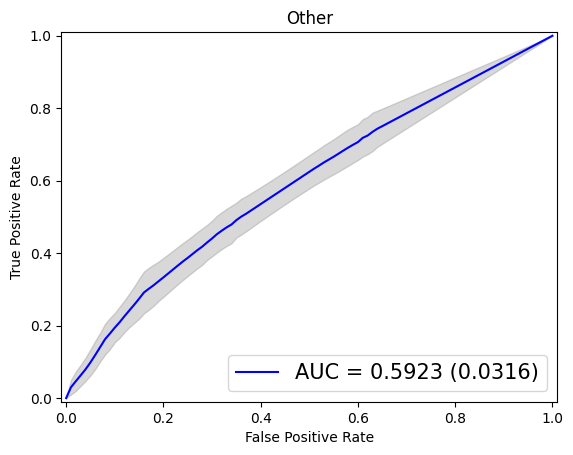

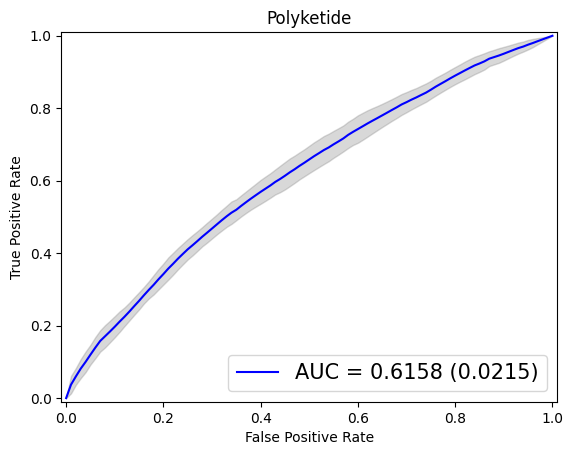

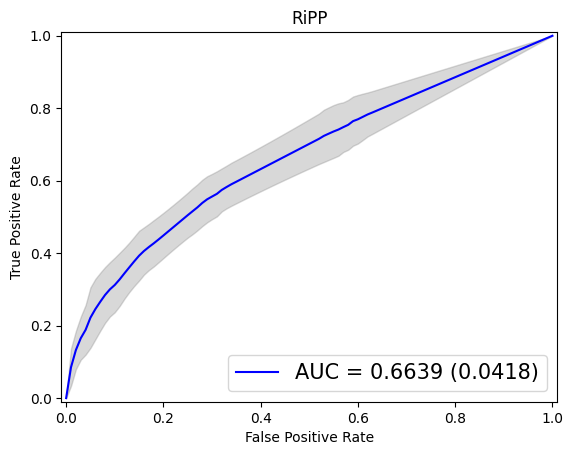

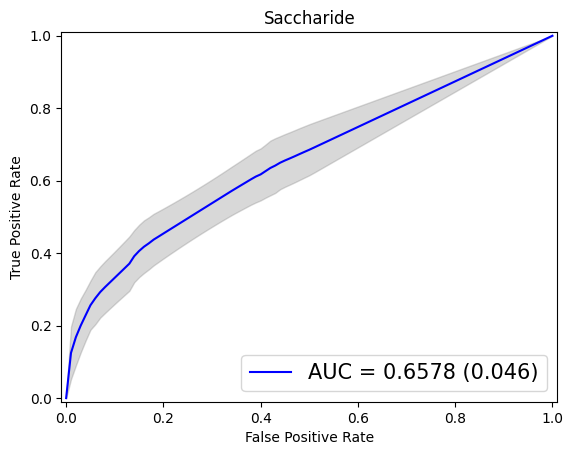

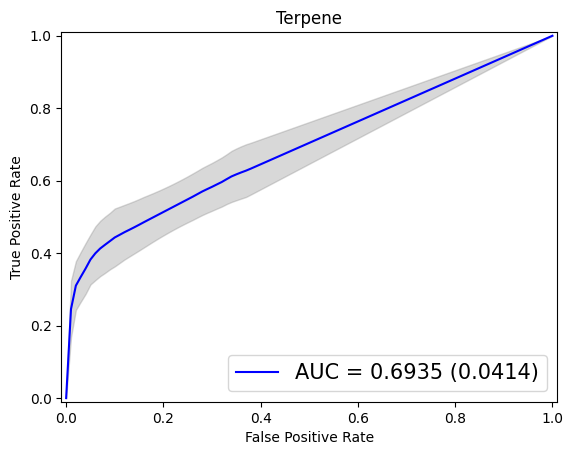

In [280]:
import warnings
warnings.filterwarnings('ignore')

print('Enconding: One-hot encoding')
print('Model: Random Forest')

scores_rf_one_hot, std_rf_one_hot = make_classification(X_one_hot, Y, RandomForestClassifier(random_state=46), model_name='rf', encoding='one_hot')

Enconding: Pfam2Vec
Model: Random Forest
Accuracy: 0.5904(0.0112)
F1 score: 0.7321(0.0097)
Precision: 0.8904(0.0211)
Recall: 0.6511(0.0107)
AUC: 0.8838(0.0133)


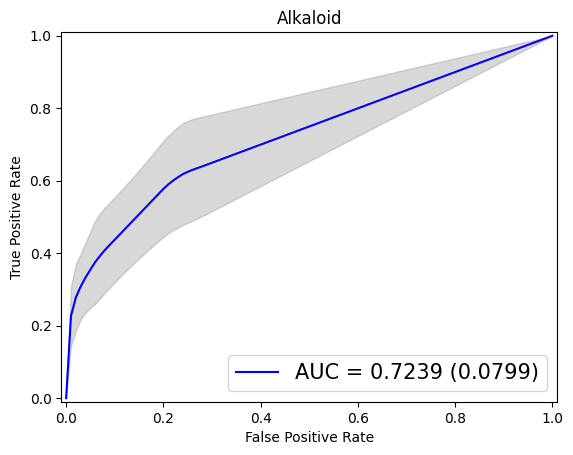

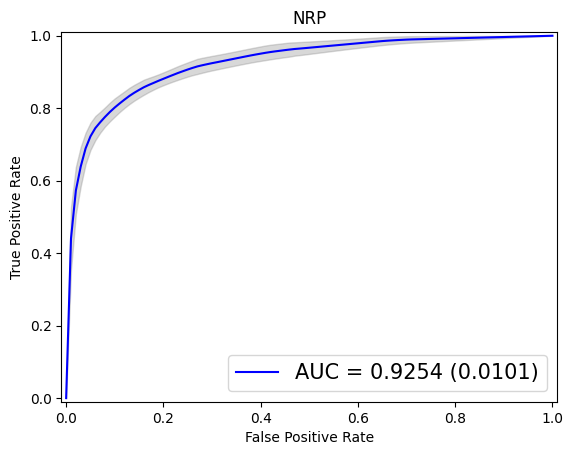

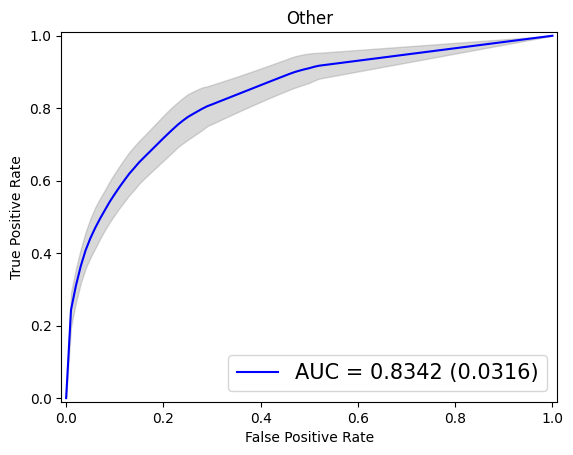

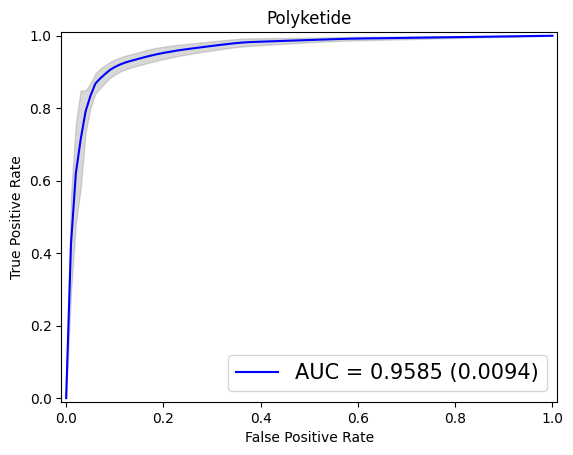

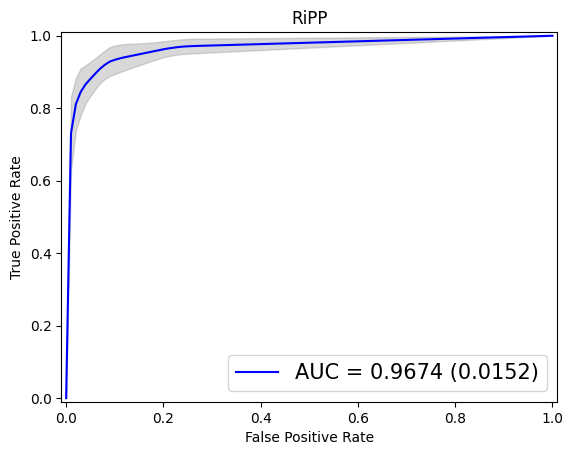

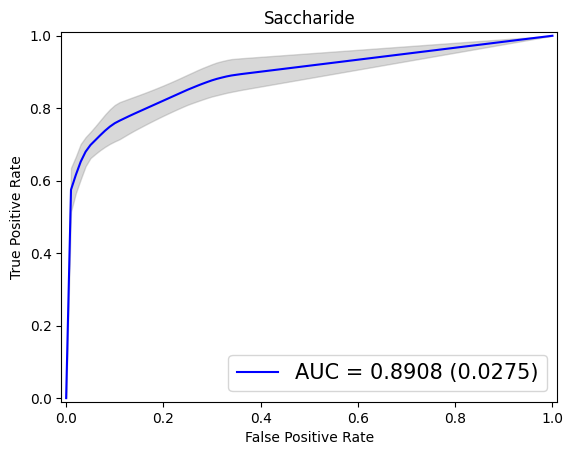

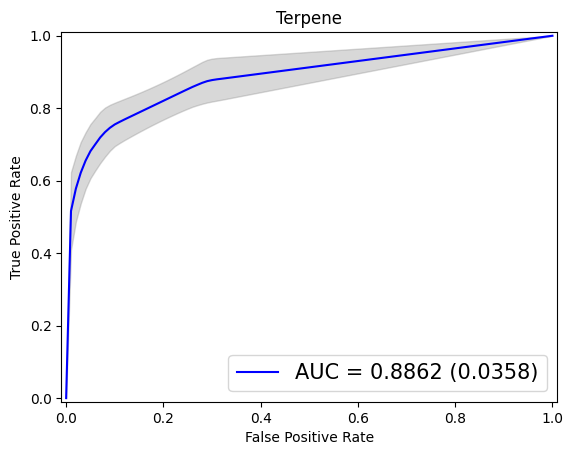

In [38]:
print('Enconding: Pfam2Vec')
print('Model: Random Forest')

scores_rf_pfam, std_rf_pfam = make_classification(X_pfam, Y, RandomForestClassifier(random_state=46), model_name='rf', encoding='pfam')

Enconding: Pfam2Vec
Model: Decision Tree
Accuracy: 0.5583(0.0172)
F1 score: 0.6845(0.0153)
Precision: 0.6813(0.018)
Recall: 0.6911(0.0159)
AUC: 0.7429(0.0115)


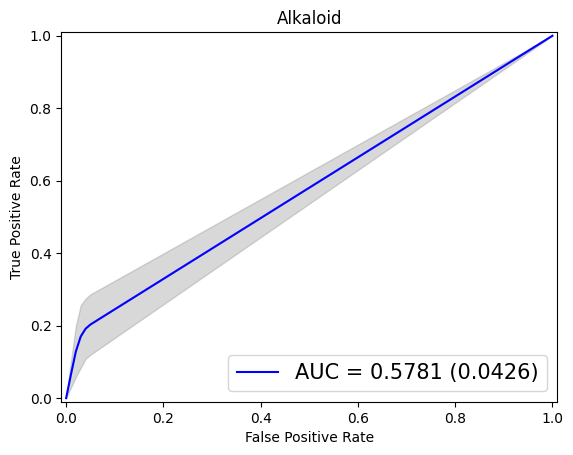

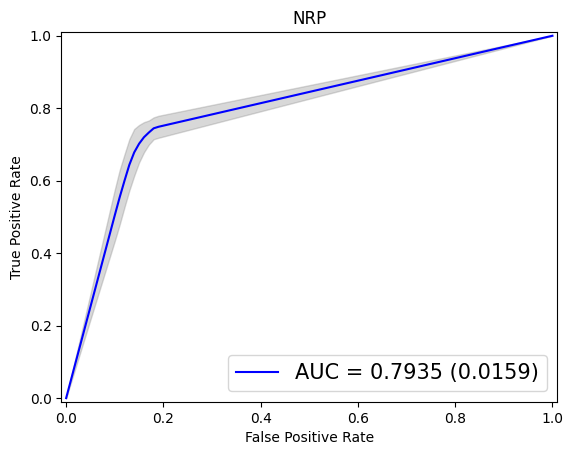

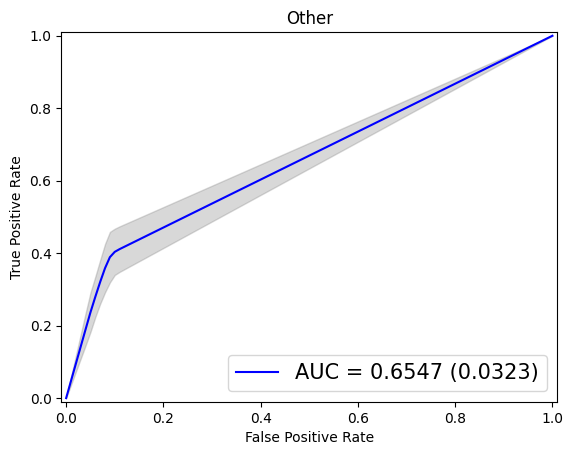

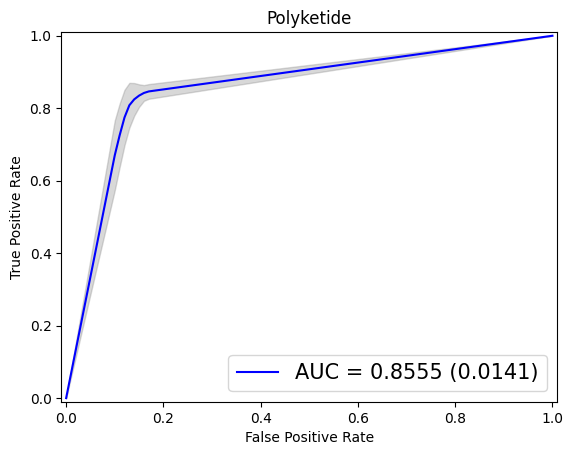

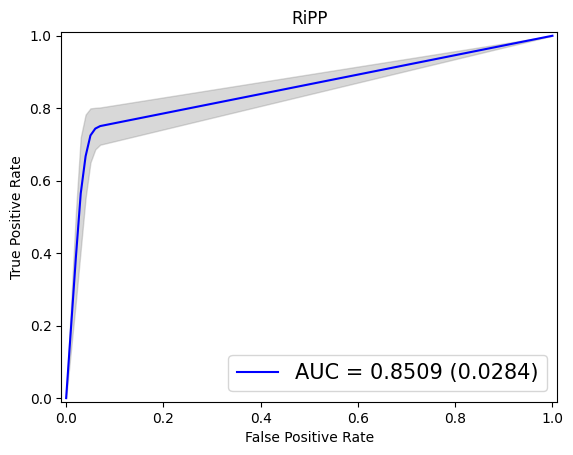

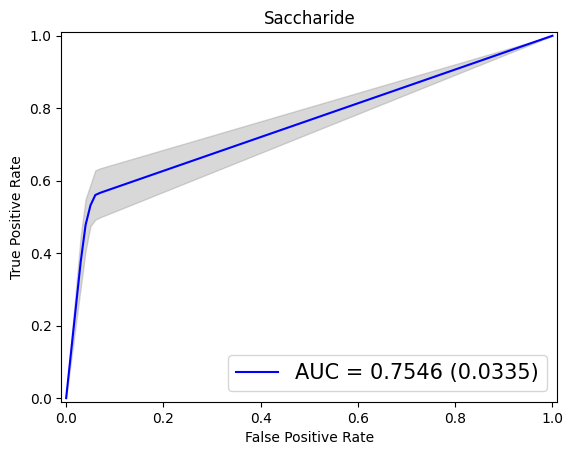

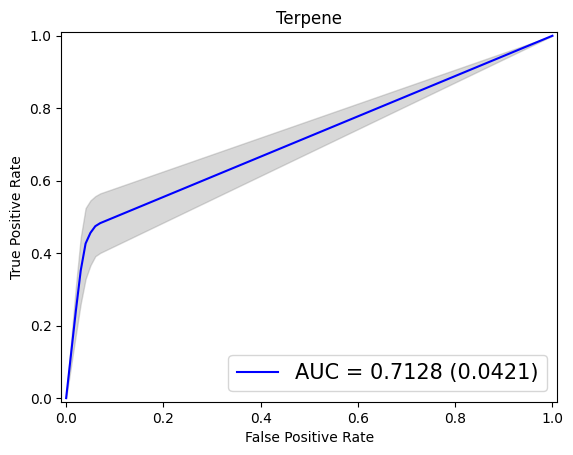

In [40]:
print('Enconding: Pfam2Vec')
print('Model: Decision Tree')

scores_dt_pfam, std_dt_pfam = make_classification(X_pfam, Y, DecisionTreeClassifier(random_state=46), model_name='dt', encoding='pfam2vec')

Enconding: One-Hot Encoding
Model: Decision Tree
Accuracy: 0.741(0.0132)
F1 score: 0.8213(0.0097)
Precision: 0.8262(0.0126)
Recall: 0.819(0.011)
AUC: 0.834(0.0115)


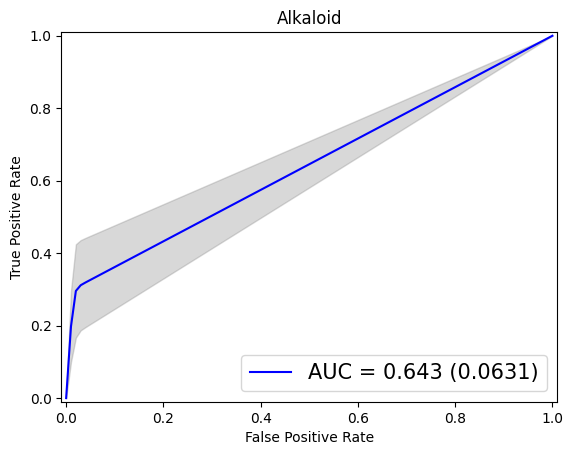

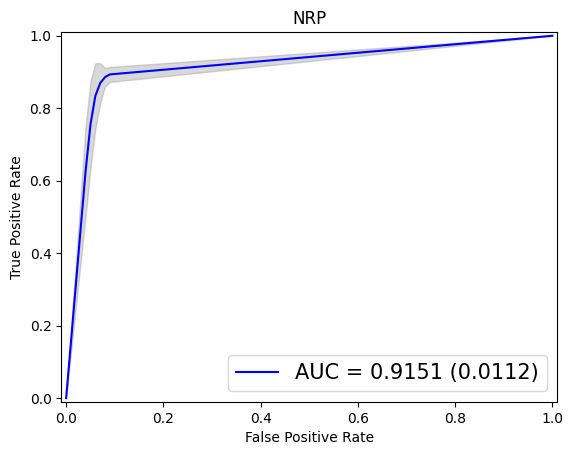

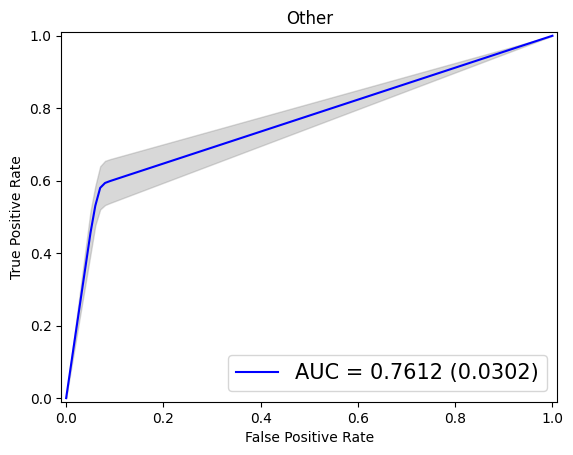

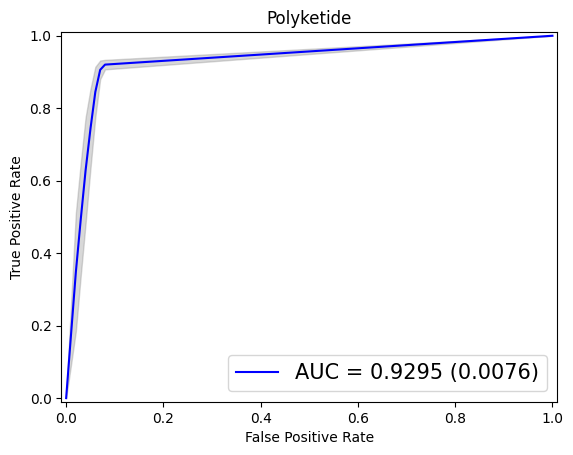

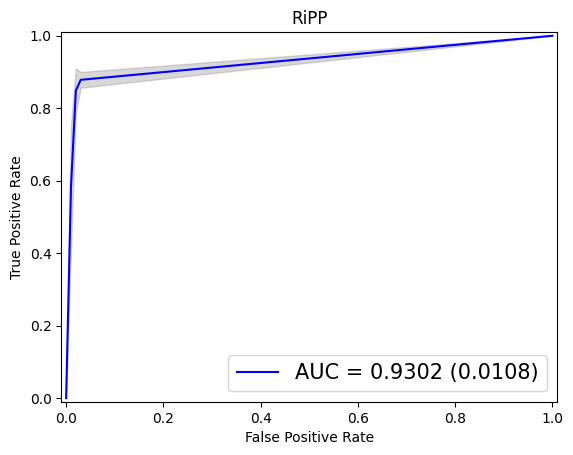

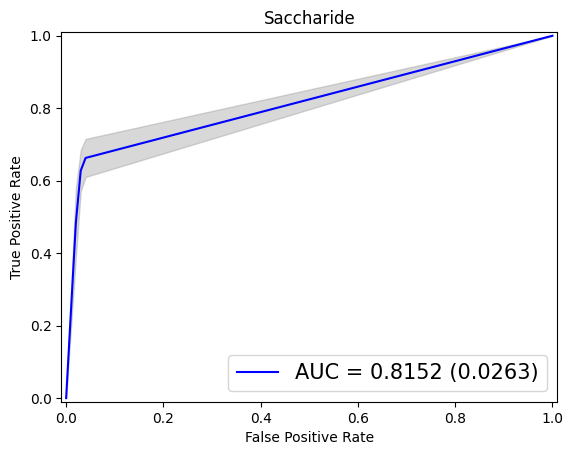

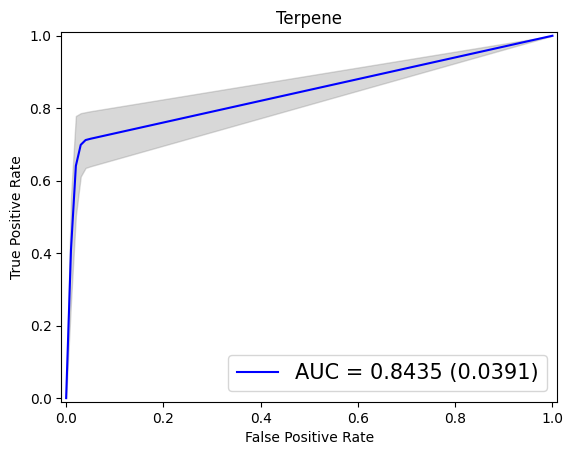

In [41]:
print('Enconding: One-Hot Encoding')
print('Model: Decision Tree')

scores_dt_one_hot, std_dt_one_hot = make_classification(X_one_hot, Y, DecisionTreeClassifier(random_state=46), model_name='dt', encoding='one_hot')

Enconding: One-Hot Encoding
Model: K-nearest neighbors
Accuracy: 0.7123(0.0116)
F1 score: 0.7926(0.0098)
Precision: 0.8609(0.012)
Recall: 0.7781(0.0087)
AUC: 0.8816(0.0126)


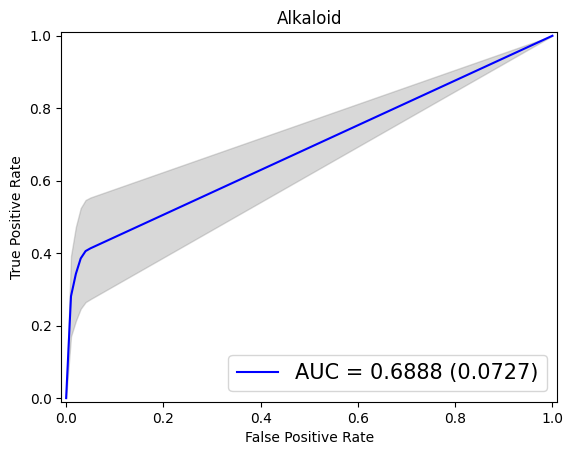

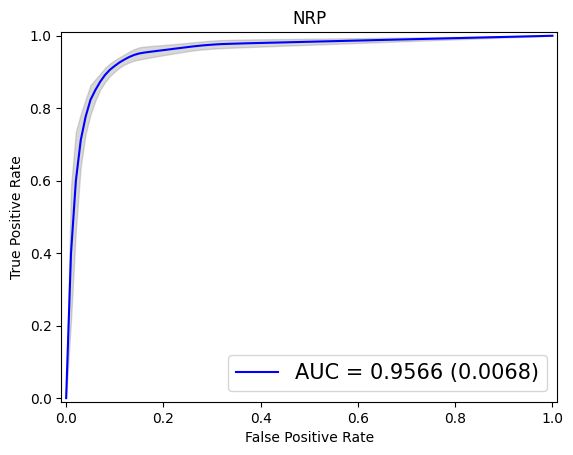

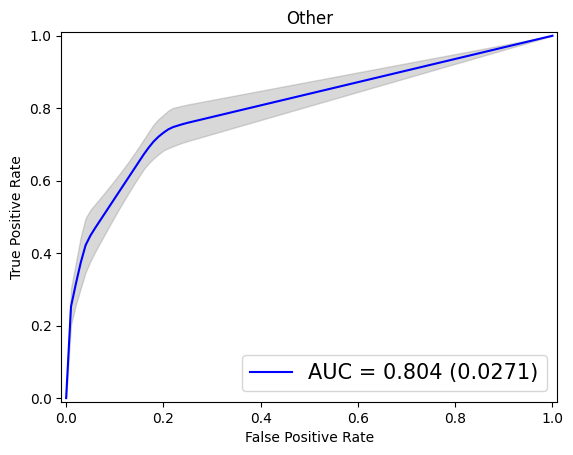

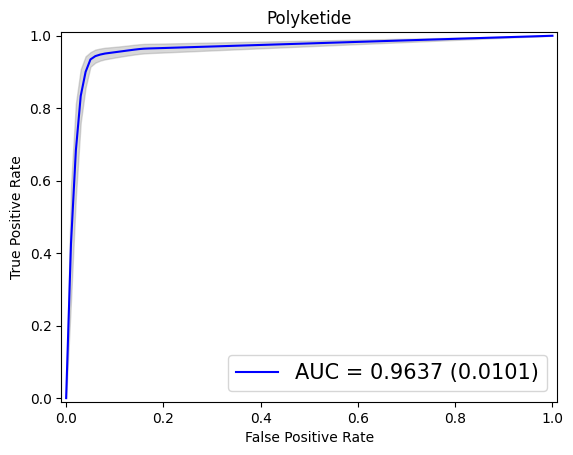

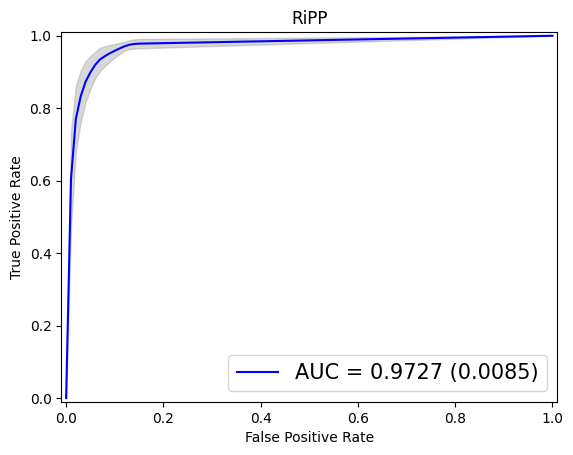

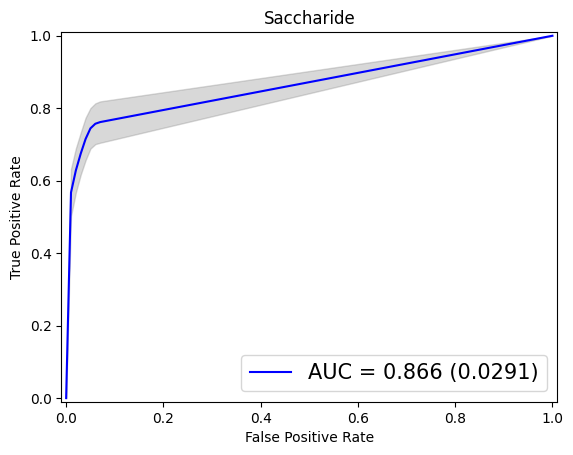

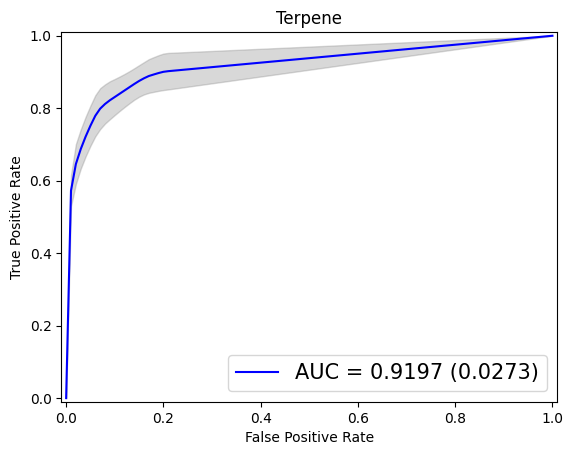

In [43]:
print('Enconding: One-Hot Encoding')
print('Model: K-nearest neighbors')

scores_knn_one_hot, std_knn_one_hot = make_classification(X_one_hot, Y, KNeighborsClassifier(n_neighbors=5), model_name='knn', encoding='one_hot')

Enconding: Pfam2Vec
Model: K-nearest neighbors
Accuracy: 0.6611(0.0157)
F1 score: 0.765(0.0143)
Precision: 0.8213(0.0166)
Recall: 0.7519(0.0144)
AUC: 0.8711(0.0094)


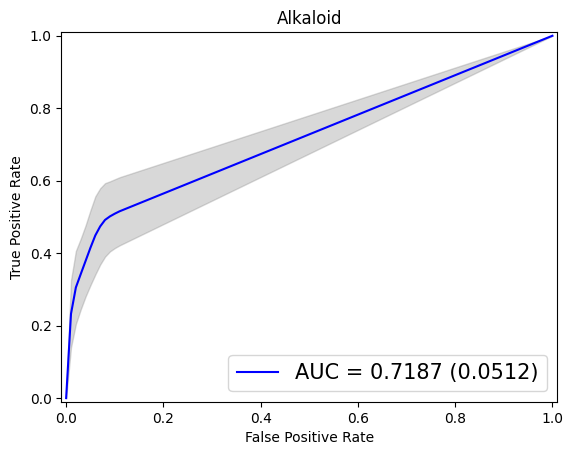

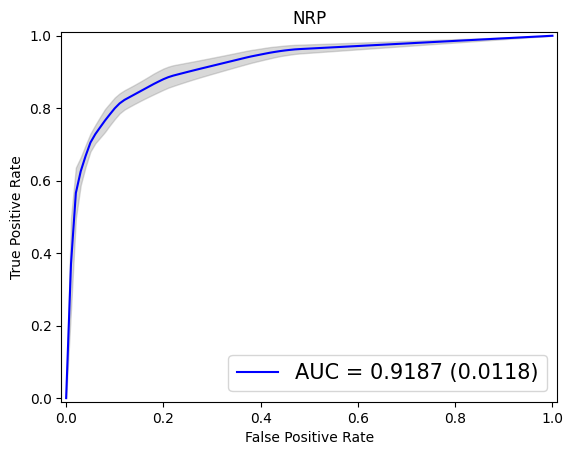

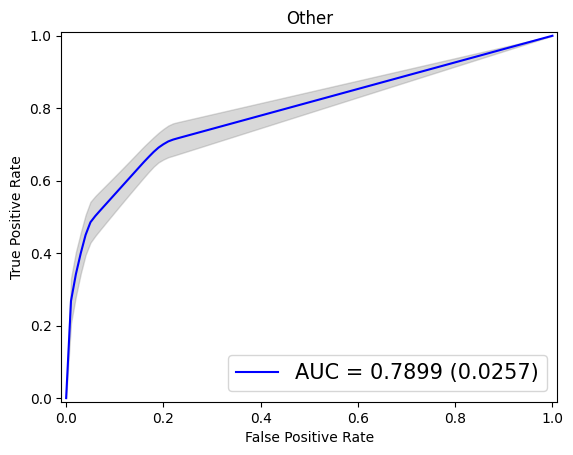

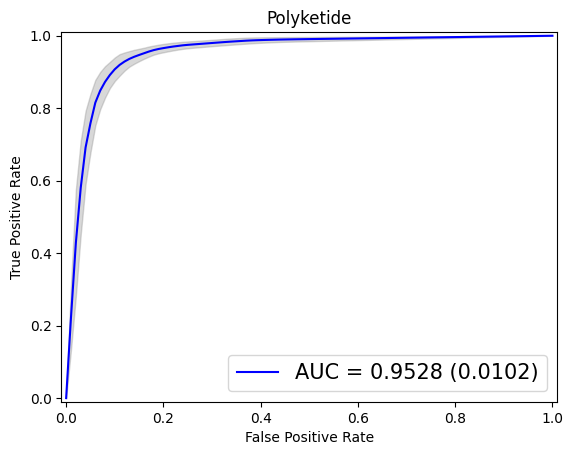

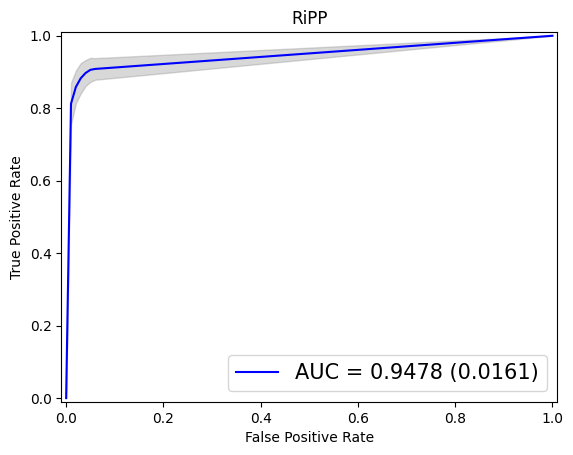

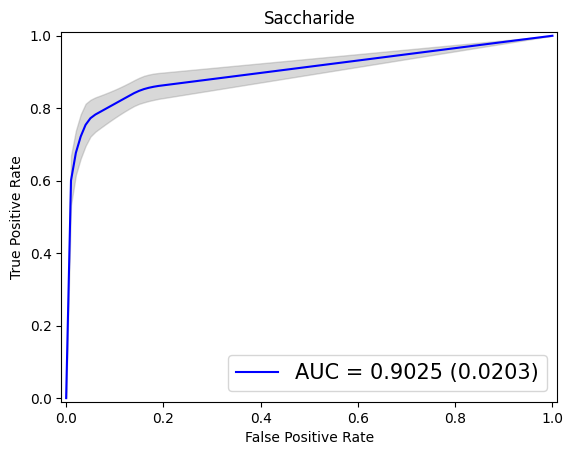

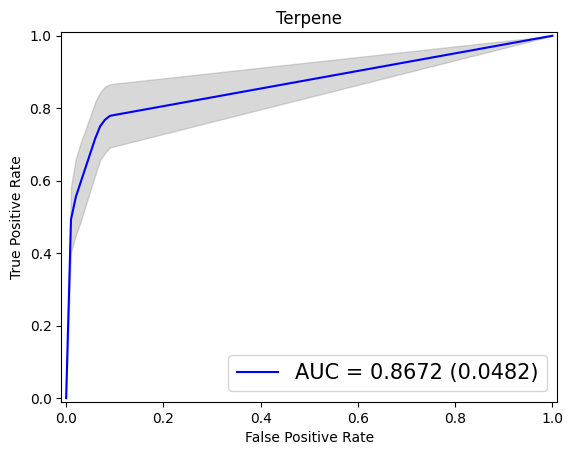

In [44]:
print('Enconding: Pfam2Vec')
print('Model: K-nearest neighbors')

scores_knn_pfam, std_knn_pfam = make_classification(X_pfam, Y, KNeighborsClassifier(n_neighbors=5), model_name='knn', encoding='pfam2vec')

Enconding: Pfam2Vec
Model: Multi Layer Perceptron (Sci-kit)
Accuracy: 0.6958(0.0133)
F1 score: 0.7963(0.0108)
Precision: 0.8585(0.0118)
Recall: 0.7578(0.0152)
AUC: 0.9266(0.0094)


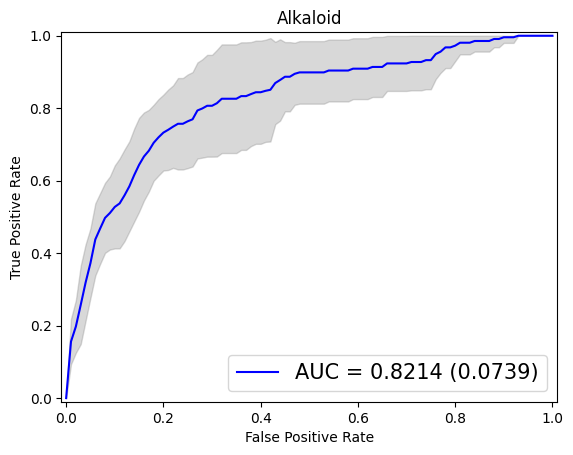

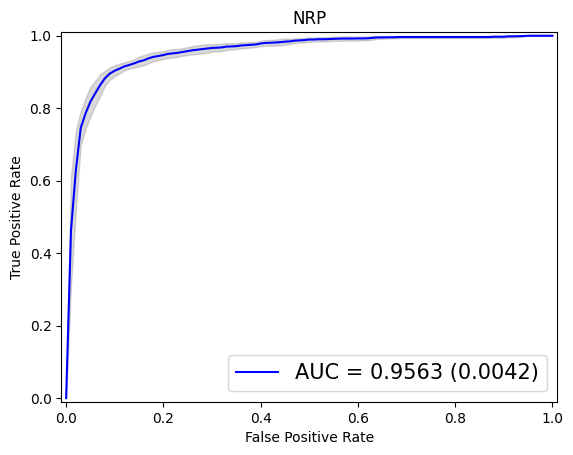

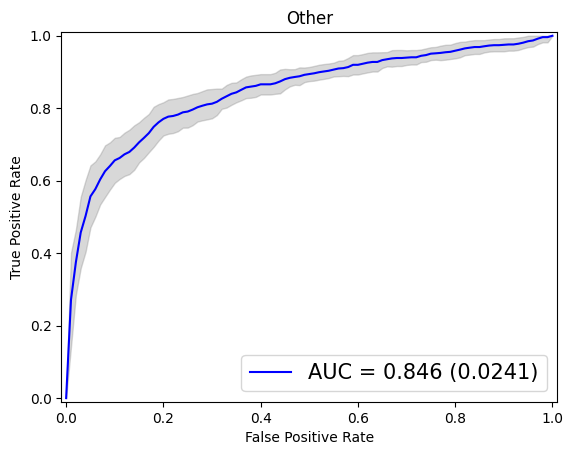

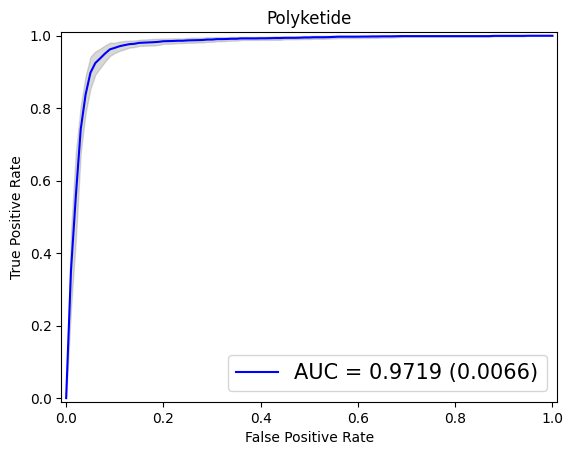

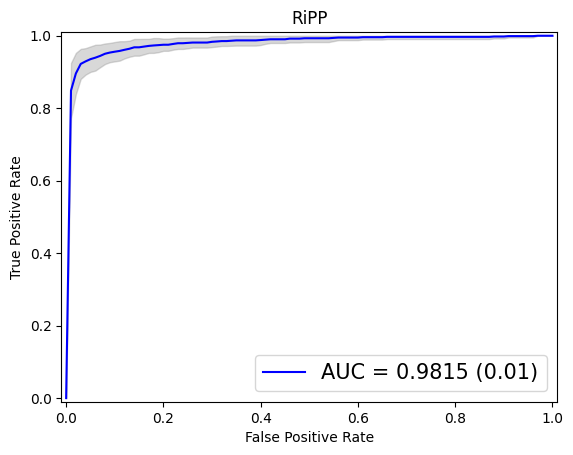

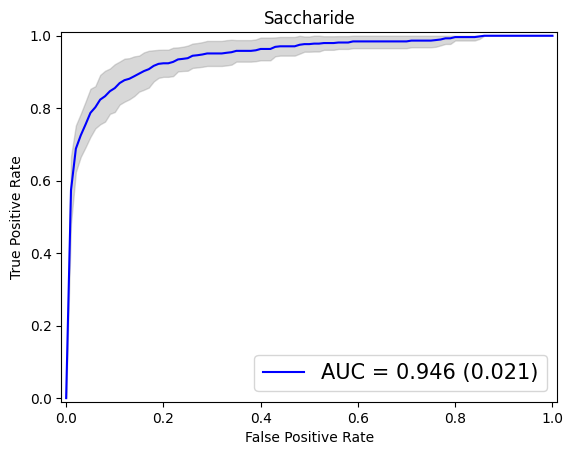

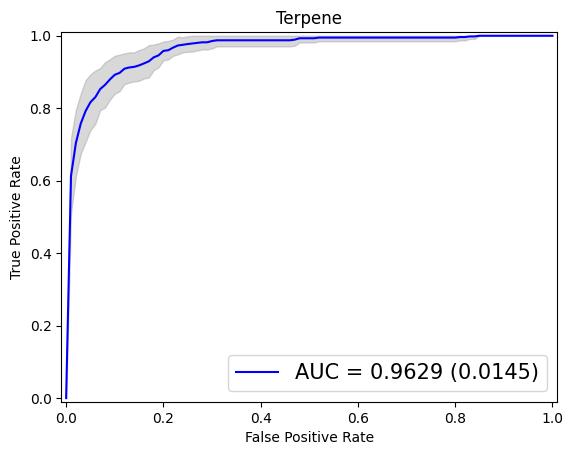

In [52]:
print('Enconding: Pfam2Vec')
print('Model: Multi Layer Perceptron (Sci-kit)')

scores_mlp_pfam, std_mlp_pfam = make_classification(X_pfam, Y, MLPClassifier(random_state=19, max_iter=300), model_name='mlp', encoding='pfam2vec', mlp=True)

Enconding: One-Hot Encoding
Model: Multi Layer Perceptron (Sci-kit)
Accuracy: 0.7258(0.0169)
F1 score: 0.8287(0.0102)
Precision: 0.8633(0.0113)
Recall: 0.8037(0.0174)
AUC: 0.9204(0.0075)


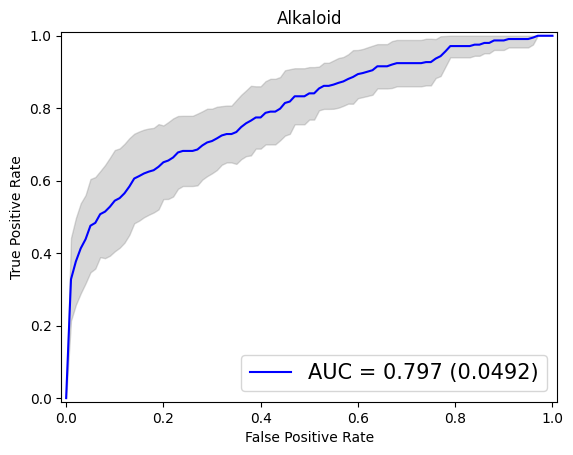

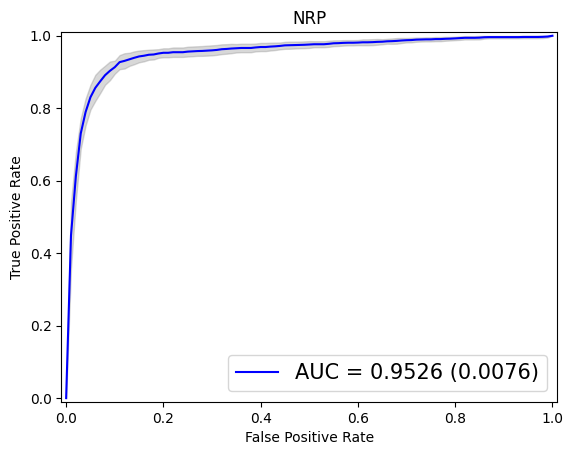

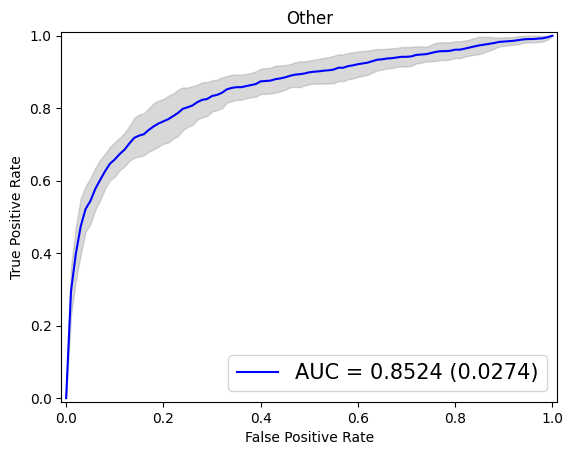

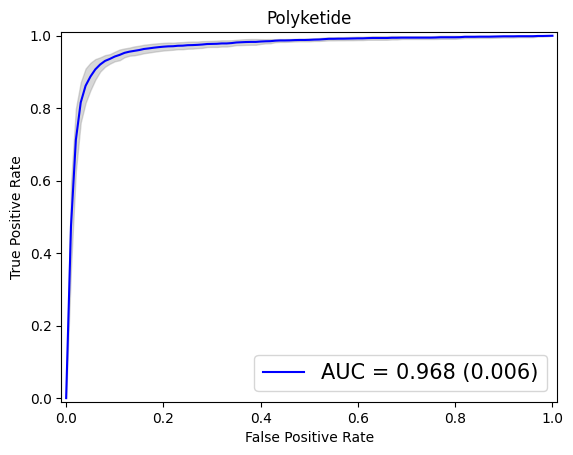

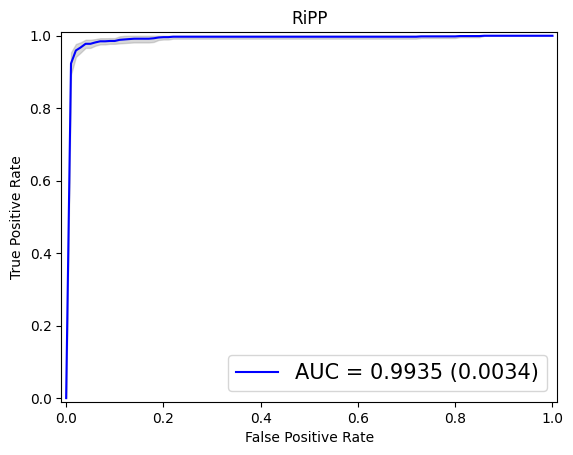

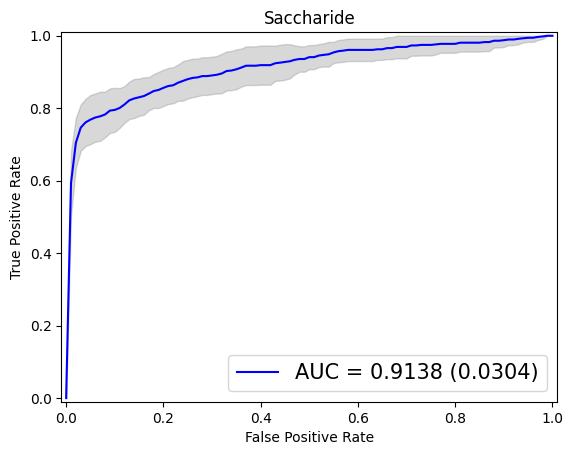

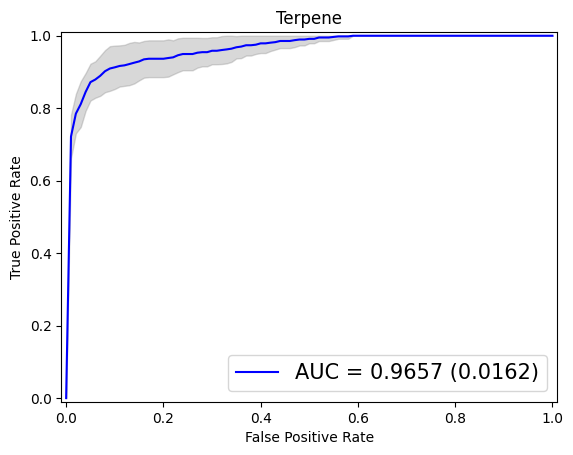

In [53]:
print('Enconding: One-Hot Encoding')
print('Model: Multi Layer Perceptron (Sci-kit)')

scores_mlp_one_hot, std_mlp_one_hot = make_classification(X_one_hot, Y, MLPClassifier(random_state=19, max_iter=300), mlp=True, model_name='mlp', encoding='one_hot')

Enconding: One-Hot Encoding
Model: Extra Tree Classifier
Accuracy: 0.6681(0.0252)
F1 score: 0.7645(0.0231)
Precision: 0.7724(0.0223)
Recall: 0.7613(0.0252)
AUC: 0.7977(0.0144)


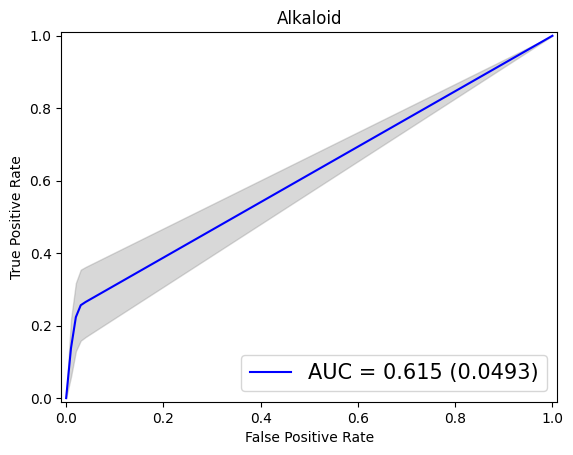

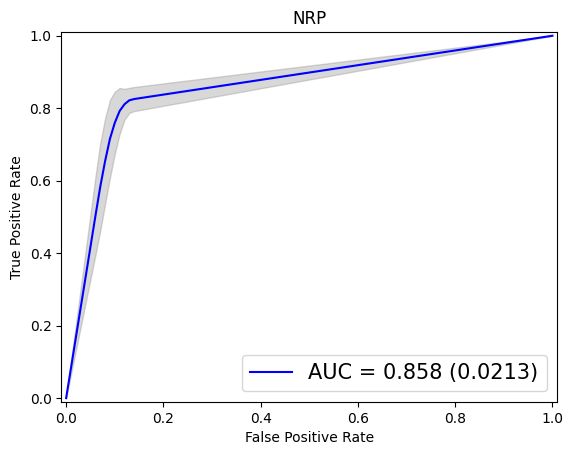

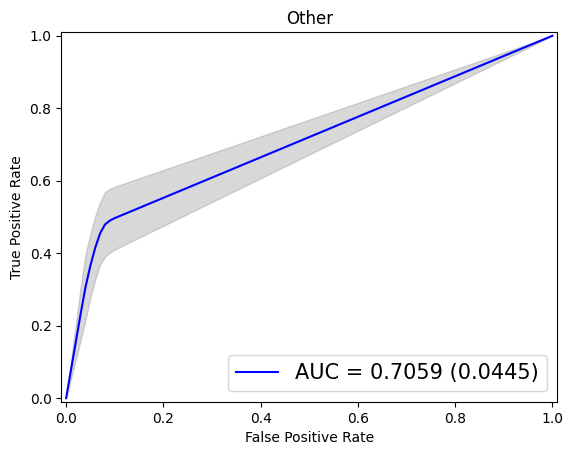

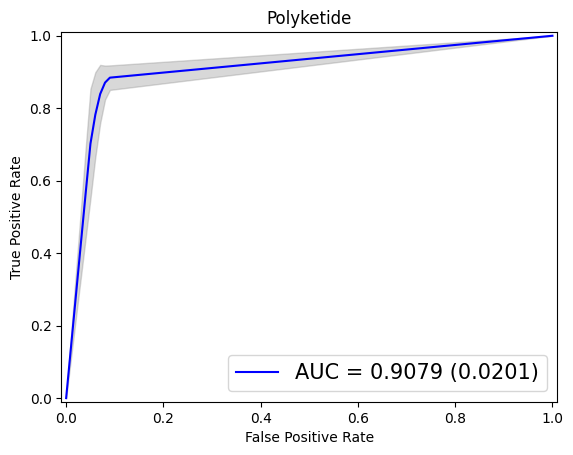

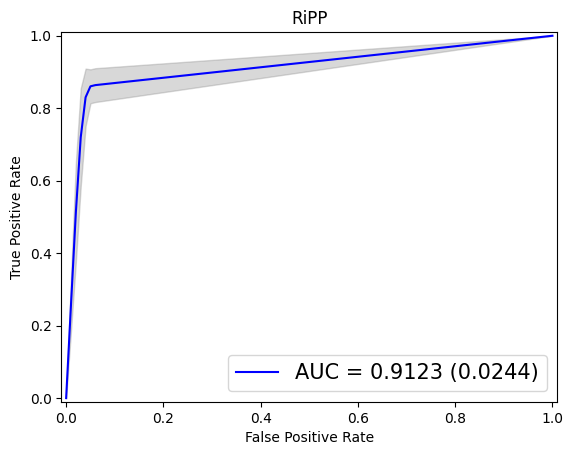

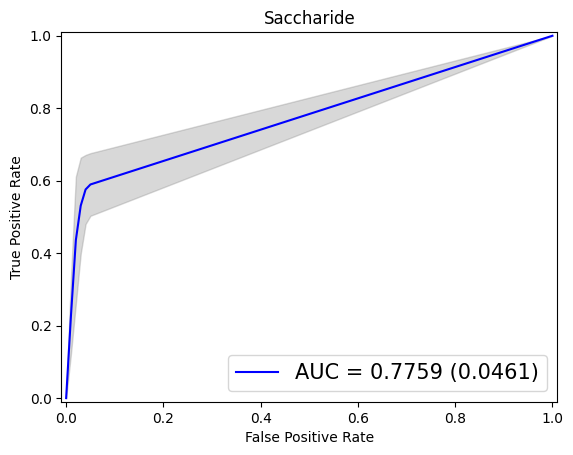

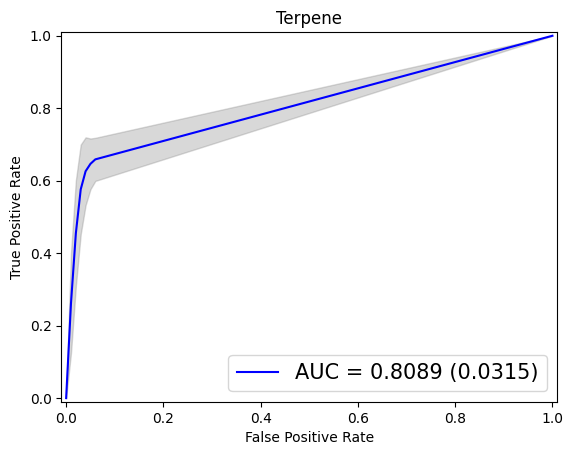

In [54]:
from sklearn.tree import ExtraTreeClassifier

print('Enconding: One-Hot Encoding')
print('Model: Extra Tree Classifier')

scores_extra_one_hot, std_extra_one_hot = make_classification(X_one_hot, Y, ExtraTreeClassifier(random_state=99), model_name='extra',encoding='one_hot')

Enconding: Pfam2Vec
Model: Extra Tree Classifier
Accuracy: 0.5213(0.0256)
F1 score: 0.6493(0.02)
Precision: 0.6478(0.0225)
Recall: 0.6537(0.02)
AUC: 0.7229(0.0169)


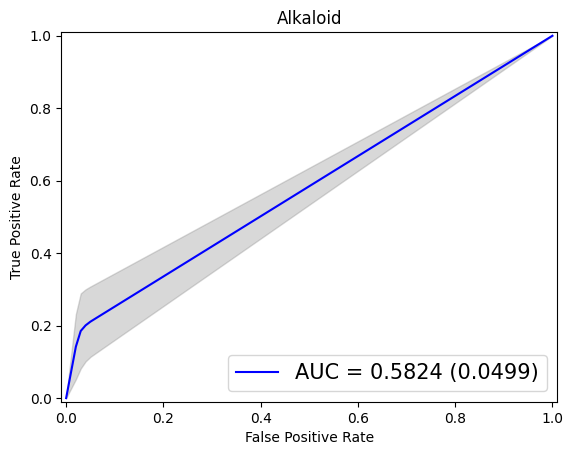

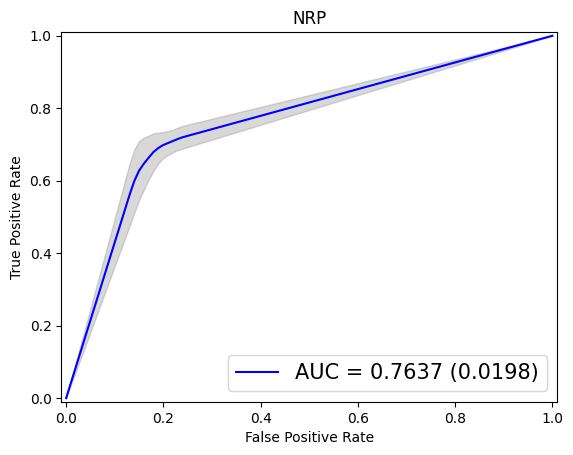

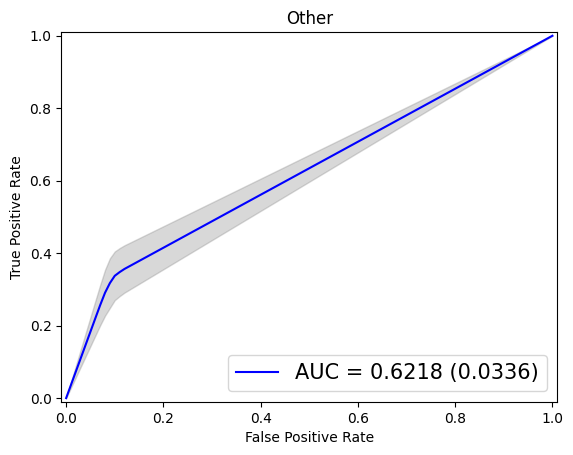

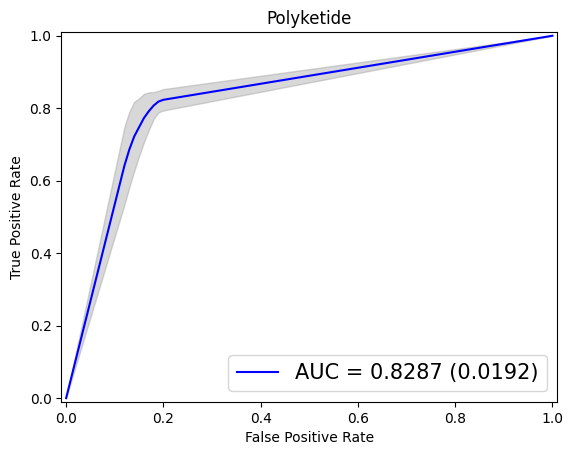

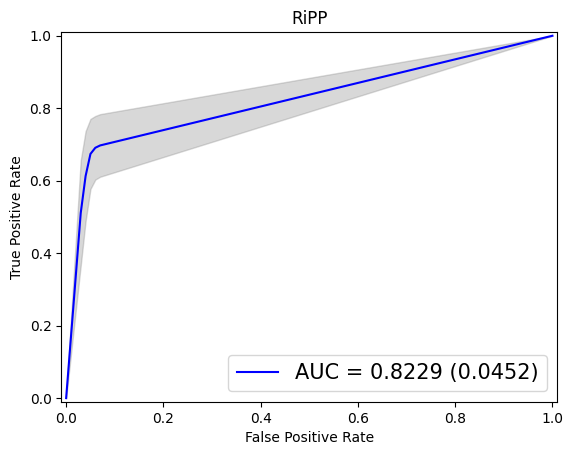

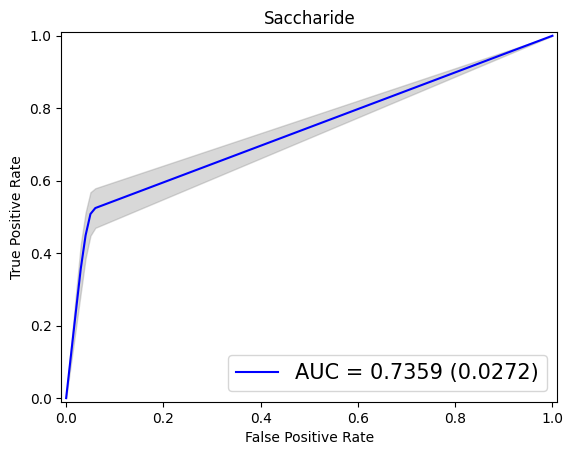

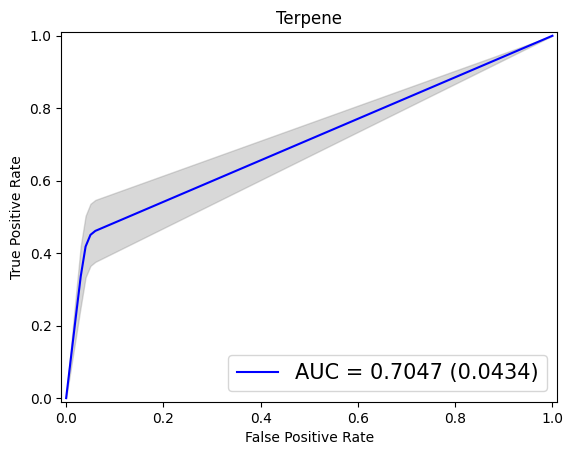

In [55]:
from sklearn.tree import ExtraTreeClassifier

print('Enconding: Pfam2Vec')
print('Model: Extra Tree Classifier')

scores_extra_pfam, std_extra_pfam = make_classification(X_pfam, Y, ExtraTreeClassifier(random_state=99), model_name ='extra', encoding='pfam2vec')

Enconding: Pfam2Vec
Model: Ensemble Extra Trees Classifier
Accuracy: 0.5924(0.0133)
F1 score: 0.7351(0.0086)
Precision: 0.8936(0.0175)
Recall: 0.6555(0.0112)
AUC: 0.8806(0.0097)


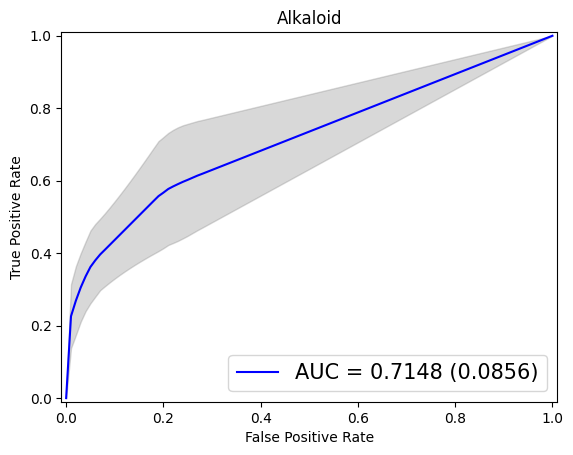

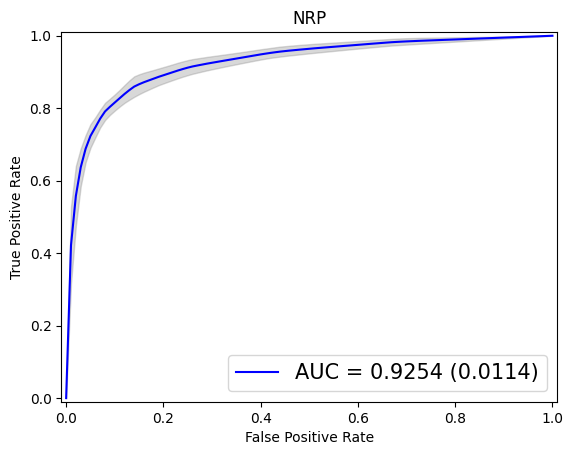

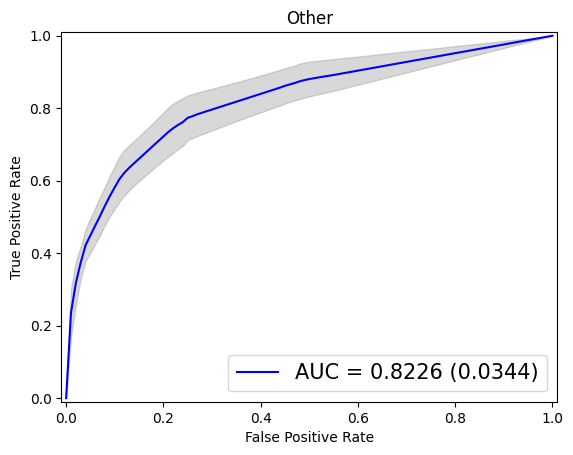

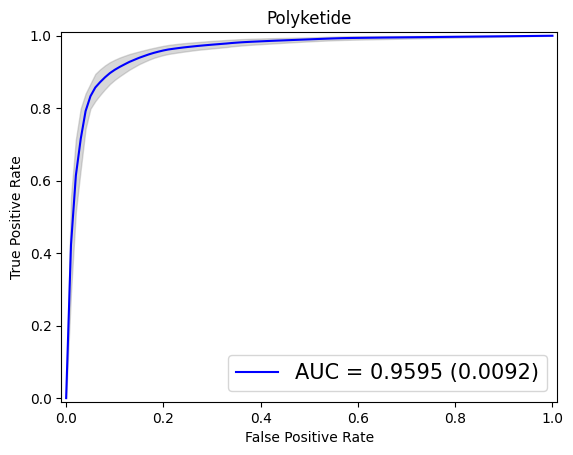

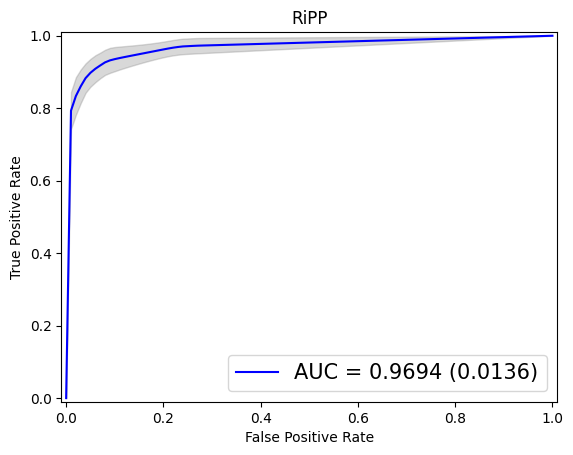

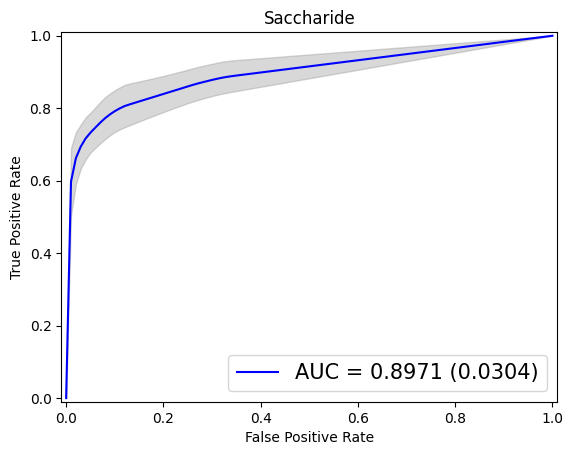

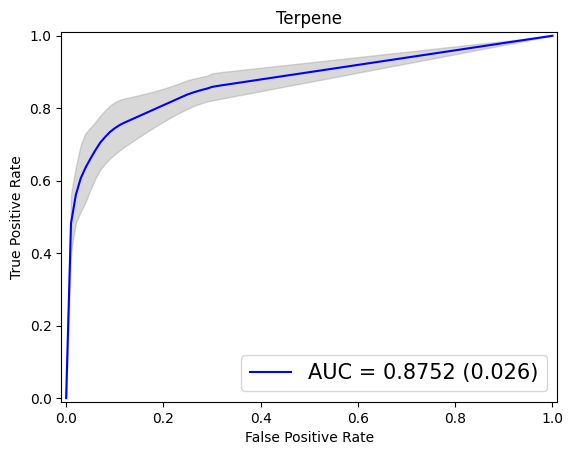

In [56]:
from sklearn.ensemble import ExtraTreesClassifier

print('Enconding: Pfam2Vec')
print('Model: Ensemble Extra Trees Classifier')

scores_extras_pfam, std_extras_pfam = make_classification(X_pfam, Y, ExtraTreesClassifier(random_state=11), model_name='extras', encoding='pfam2vec')

Enconding: One-Hot Encoding
Model: Ensemble Extra Trees Classifier
Accuracy: 0.7323(0.0107)
F1 score: 0.8268(0.0075)
Precision: 0.9005(0.0122)
Recall: 0.786(0.0086)
AUC: 0.9146(0.0081)


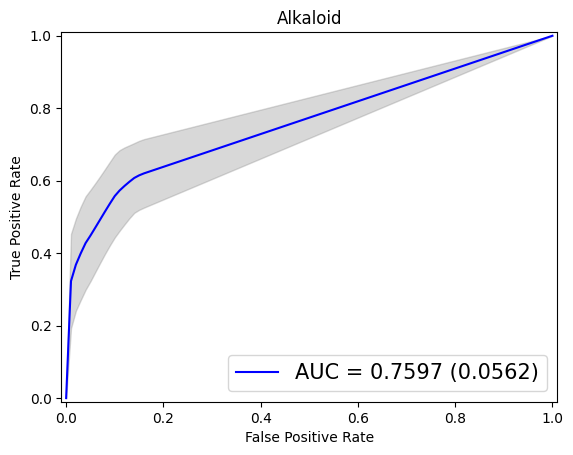

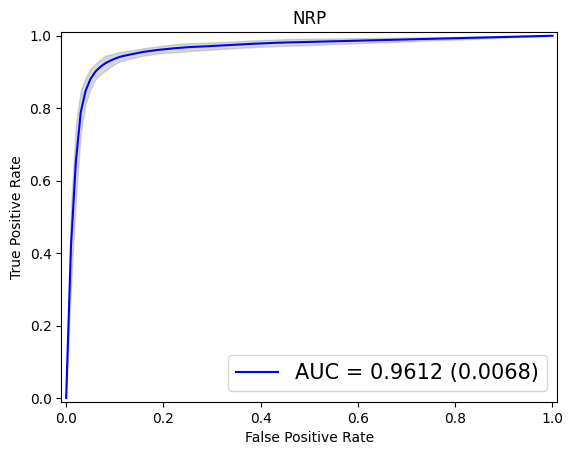

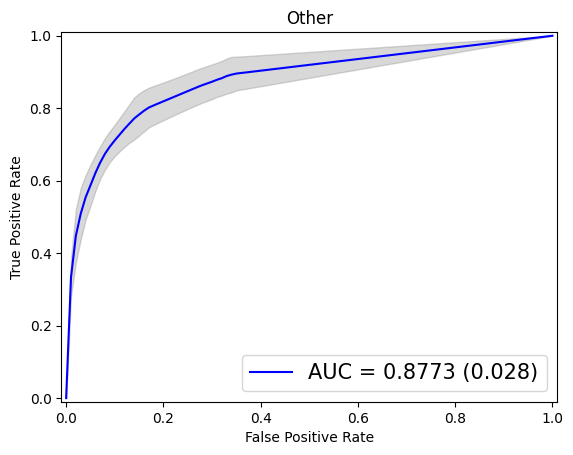

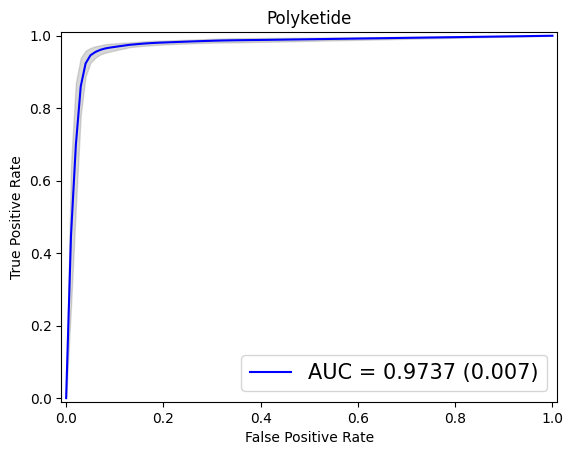

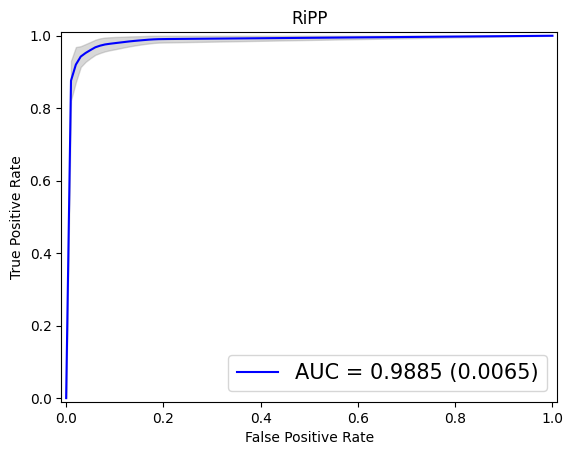

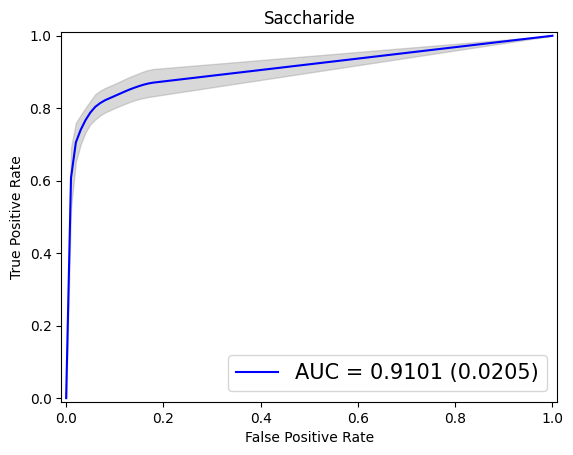

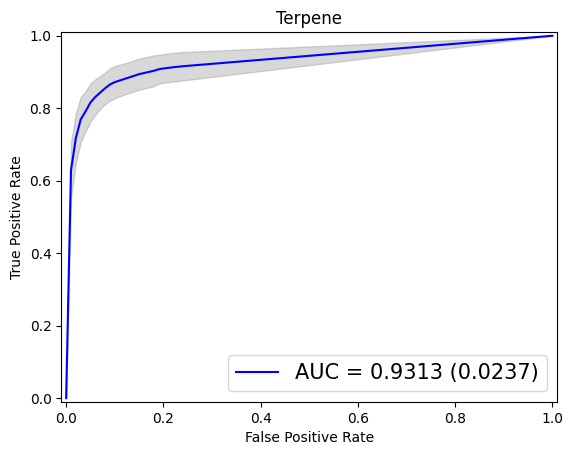

In [57]:
from sklearn.ensemble import ExtraTreesClassifier

print('Enconding: One-Hot Encoding')
print('Model: Ensemble Extra Trees Classifier')

scores_extras_one_hot, std_extras_one_hot = make_classification(X_one_hot, Y, ExtraTreesClassifier(random_state=11), model_name='extras', encoding='one_hot')

In [59]:
!pip install openpyxl

Let's compare the scores of all the methods we've used so far!

In [380]:
accuracy = []
f1 = []
precision = [] # What proportion of positive identifications was actually correct?
recall = [] # What proportion of actual positives was identified correctly?
auc = []

scores = [scores_rf_one_hot, scores_rf_pfam,
         scores_dt_one_hot, scores_dt_pfam,
         scores_knn_one_hot, scores_knn_pfam,
         scores_mlp_one_hot, scores_mlp_pfam,
         scores_extra_one_hot, scores_extra_pfam,
         scores_extras_one_hot, scores_extras_pfam]
model_list = ["Random Forest", "Random Forest", "Decision Tree", "Decision Tree", 
              "K-Nearest Neighbors", "K-Nearest Neighbors", "Multi Layer Perceptron", "Multi Layer Perceptron",
             "Extra Tree", "Extra Tree", "Extra Trees (Ensemble)", "Extra Trees (Ensemble)"]
encoding_list = ["One-Hot Encoding", "Pfam2Vec"] * 6

for el in scores:
    accuracy.append(el['accuracy'])
    f1.append(el['f1_score'])
    precision.append(el['precision'])
    recall.append(el['recall'])
    auc.append(el['auc'])

results = pd.DataFrame({'Model' : model_list, 'Encoding': encoding_list, 'AUC': auc, 'Accuracy': accuracy, 
                       'F1 Score': f1, 'Precision': precision, 'Recall': recall})

results

,Model,Encoding,AUC,Accuracy,F1 Score,Precision,Recall
0,Random Forest,One-Hot Encoding,0.6254,0.1892,0.3114,0.4952,0.2480
1,Random Forest,Pfam2Vec,0.8838,0.5904,0.7321,0.8904,0.6511
2,Decision Tree,One-Hot Encoding,0.8340,0.7410,0.8213,0.8262,0.8190
3,Decision Tree,Pfam2Vec,0.7429,0.5583,0.6845,0.6813,0.6911
4,K-Nearest Neighbors,One-Hot Encoding,0.8816,0.7123,0.7926,0.8609,0.7781
5,K-Nearest Neighbors,Pfam2Vec,0.8711,0.6611,0.7650,0.8213,0.7519
6,Multi Layer Perceptron,One-Hot Encoding,0.9204,0.7258,0.8287,0.8633,0.8037
7,Multi Layer Perceptron,Pfam2Vec,0.9266,0.6958,0.7963,0.8585,0.7578
8,Extra Tree,One-Hot Encoding,0.7977,0.6681,0.7645,0.7724,0.7613
9,Extra Tree,Pfam2Vec,0.7229,0.5213,0.6493,0.6478,0.6537


In [381]:
results = results.sort_values(by=['AUC'], ascending=False)
results

,Model,Encoding,AUC,Accuracy,F1 Score,Precision,Recall
7,Multi Layer Perceptron,Pfam2Vec,0.9266,0.6958,0.7963,0.8585,0.7578
6,Multi Layer Perceptron,One-Hot Encoding,0.9204,0.7258,0.8287,0.8633,0.8037
10,Extra Trees (Ensemble),One-Hot Encoding,0.9146,0.7323,0.8268,0.9005,0.7860
1,Random Forest,Pfam2Vec,0.8838,0.5904,0.7321,0.8904,0.6511
4,K-Nearest Neighbors,One-Hot Encoding,0.8816,0.7123,0.7926,0.8609,0.7781
11,Extra Trees (Ensemble),Pfam2Vec,0.8806,0.5924,0.7351,0.8936,0.6555
5,K-Nearest Neighbors,Pfam2Vec,0.8711,0.6611,0.7650,0.8213,0.7519
2,Decision Tree,One-Hot Encoding,0.8340,0.7410,0.8213,0.8262,0.8190
8,Extra Tree,One-Hot Encoding,0.7977,0.6681,0.7645,0.7724,0.7613
3,Decision Tree,Pfam2Vec,0.7429,0.5583,0.6845,0.6813,0.6911


We use AUC as the best metrics to measure classification success. We can see that **MLPClassifier** outperformed Random Forest with Pfam2Vec proving as the best input representation. This is a hint that further parameter tuning could help us improve classification even more. However, I am not very convinced of the ability MLPClassifier to handle overfitting so these results can be significantly biased.

It is worth noting that original paper reports average AUC 0.792 with the use of Random Forest. However, it was trained and validated on older version of MiBIG database 1.3. Here I am working with MiBIG 3.0 that is twice as big, hence Random Forest appears to perform better (0.9128). 

In [62]:
results.to_excel('data/classifiers_score.xlsx', index=False)

## Deep Learning classification

I am going to try to design my own multiple layer perceptrons with different architectures. For this I am using Keras with Tensorflow as a backend. 

In [306]:
import tensorflow as tf
from tensorflow.keras.models import Sequential, clone_model
from tensorflow.keras.layers import Dense, Dropout

Multi-label classification that I am performing here requires **sigmoid** as its activation function in the output layer instead of commonly used softmax (outputs probability prediction for one variable only). Since the target variables can be either 0 or 1, **binary cross entropy** will be used as loss function. Lastly, I am using **dropout** in between hidden layers (and input and hidden layer) to prevent overfitting. 

During training I also chose to utilize **Early Stopping** with patience 10, which enforces premature end of computation if the training loss is not decreasing after 10 consecutive epochs.

Training and validation loss is plotted. This can will be helpful in determining whether I am overfitting my model.

In [330]:
def nn1(n_inputs, n_outputs, dropout=0.2):
    model = Sequential()
    model.add(Dense(100, input_dim=n_inputs, kernel_initializer='he_uniform', activation='relu'))
    model.add(Dropout(dropout))
    model.add(Dense(n_outputs, activation='sigmoid'))
    
    return model

In [68]:
import warnings
warnings.filterwarnings("ignore")

Model: NN1 (1 hidden layer, 100 nodes)
Encoding: Pfam2Vec
Split: 0, repeat: 1
Epochs before early stopping: 164


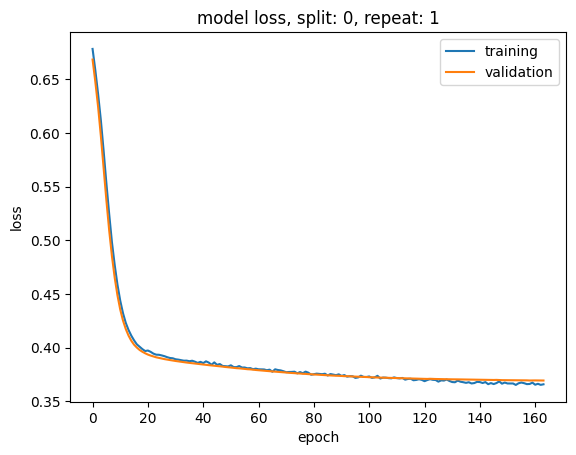

Split: 1, repeat: 1
Epochs before early stopping: 153


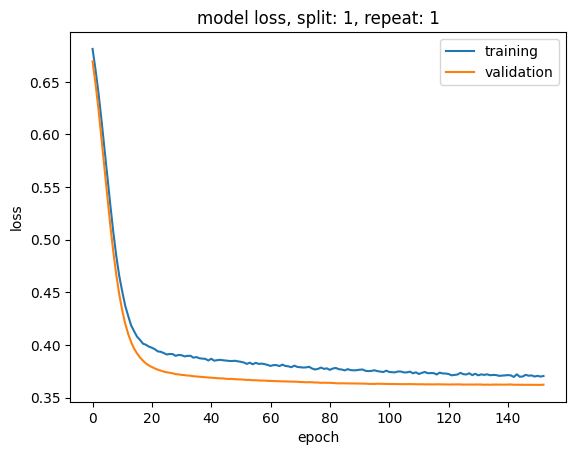

Split: 2, repeat: 1
Epochs before early stopping: 197


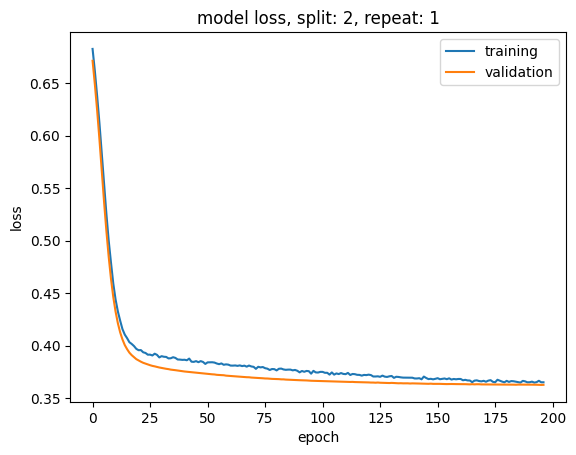

Split: 3, repeat: 1
Epochs before early stopping: 188


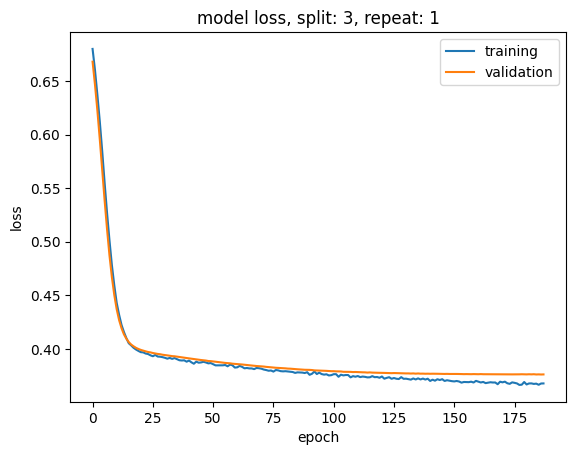

Split: 4, repeat: 1
Epochs before early stopping: 228


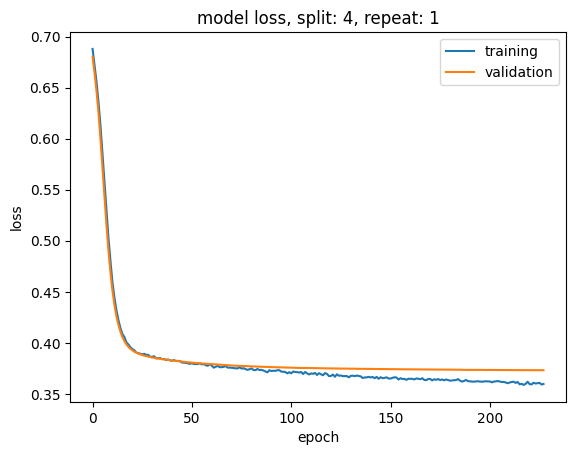

Split: 5, repeat: 2
Epochs before early stopping: 202


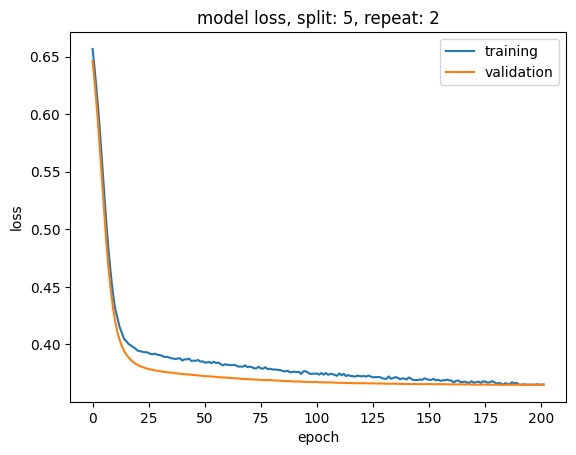

Split: 6, repeat: 2
Epochs before early stopping: 114


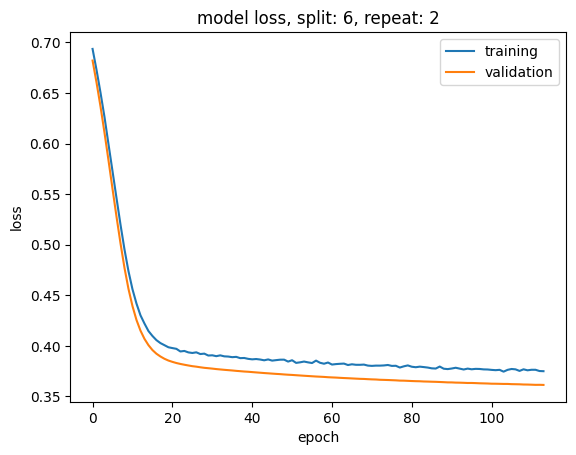

Split: 7, repeat: 2
Epochs before early stopping: 137


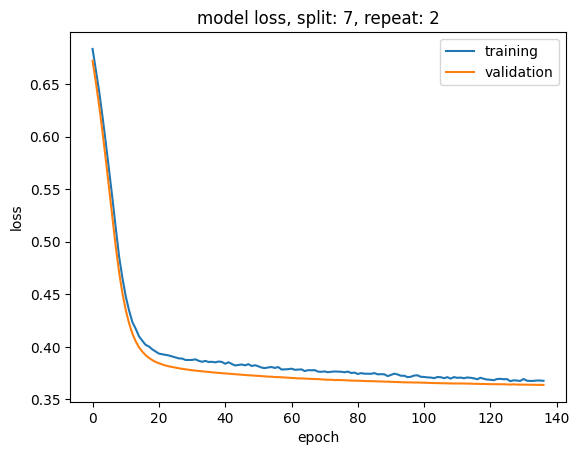

Split: 8, repeat: 2
Epochs before early stopping: 150


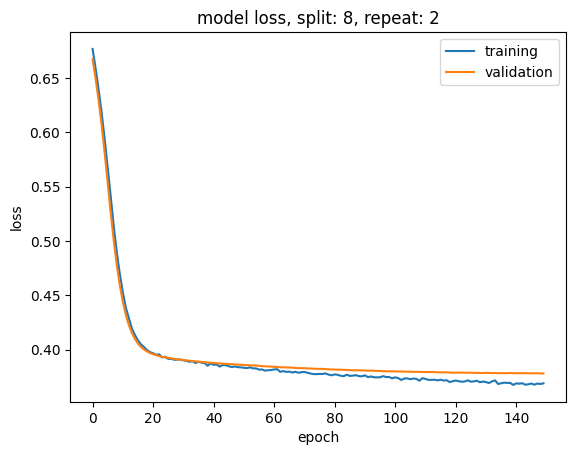

Split: 9, repeat: 2
Epochs before early stopping: 140


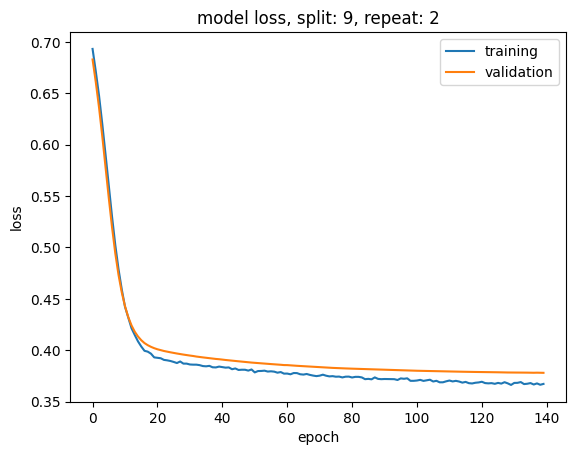

Split: 10, repeat: 3
Epochs before early stopping: 113


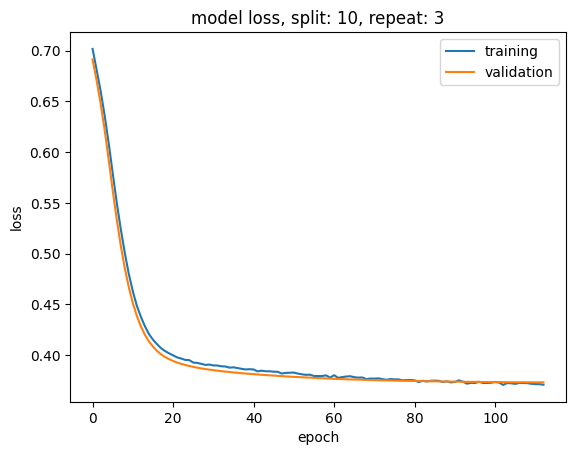

Split: 11, repeat: 3
Epochs before early stopping: 120


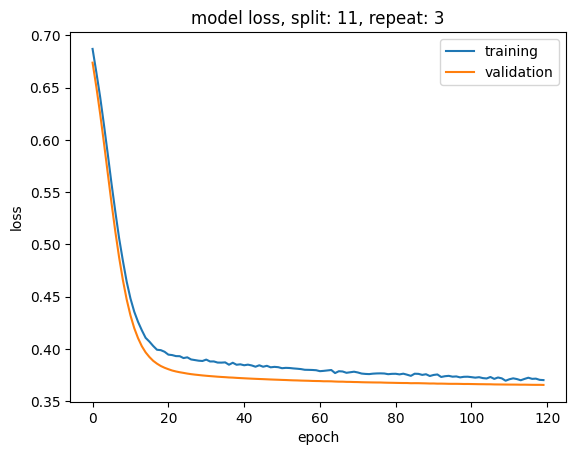

Split: 12, repeat: 3
Epochs before early stopping: 129


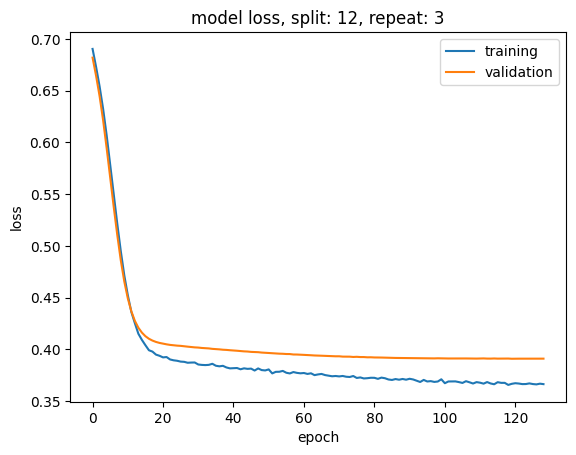

Split: 13, repeat: 3
Epochs before early stopping: 136


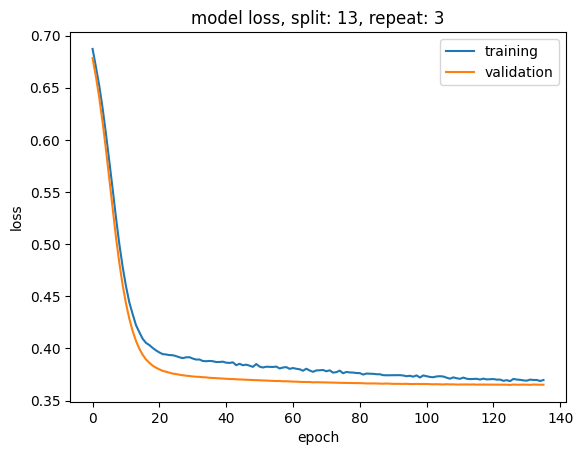

Split: 14, repeat: 3
Epochs before early stopping: 125


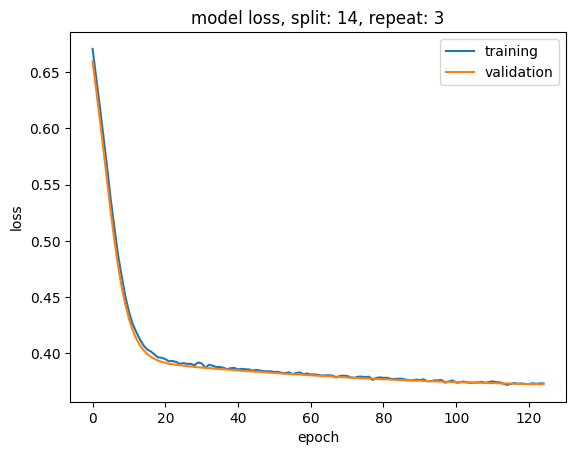

Accuracy: 0.103(0.0175)
F1 score: 0.1828(0.0182)
Precision: 0.3802(0.0519)
Recall: 0.1373(0.0172)
AUC: 0.6377(0.0199)


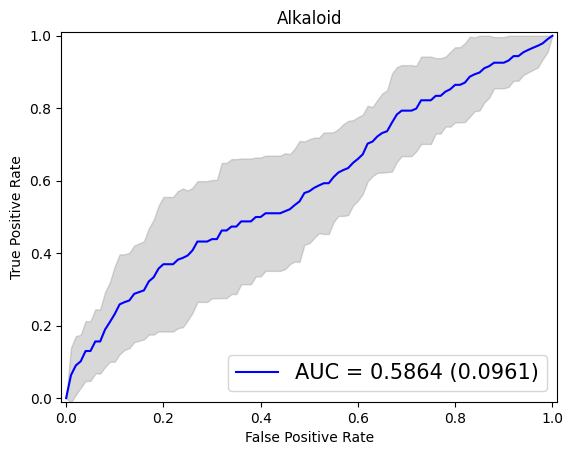

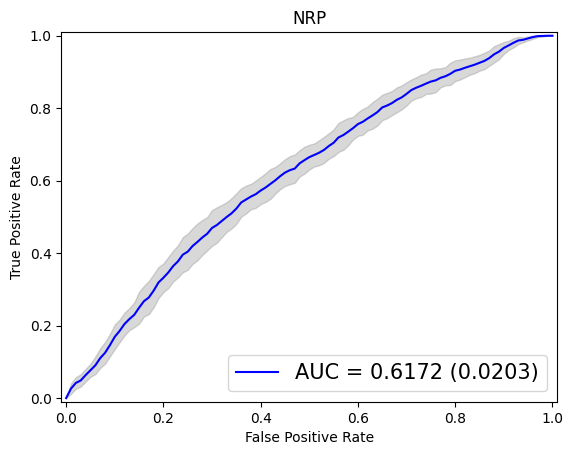

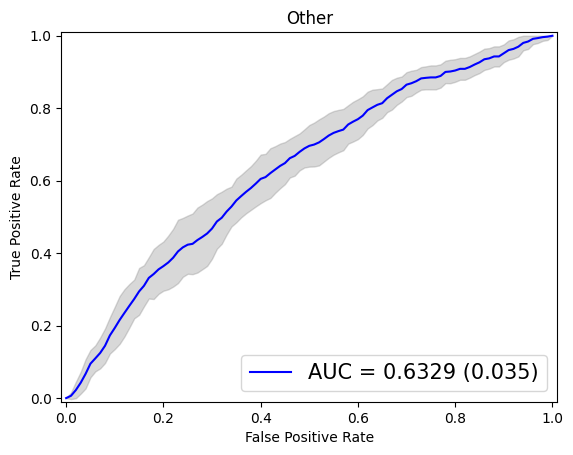

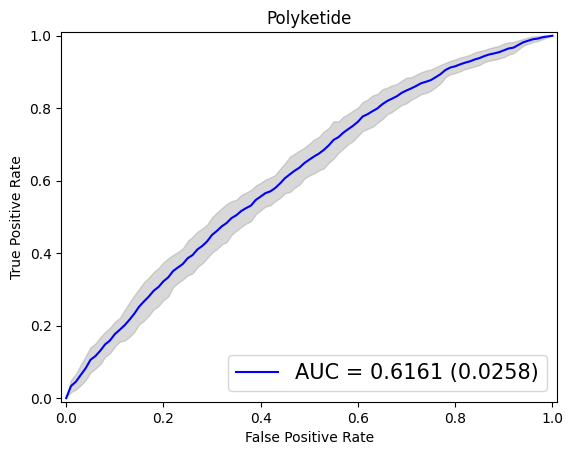

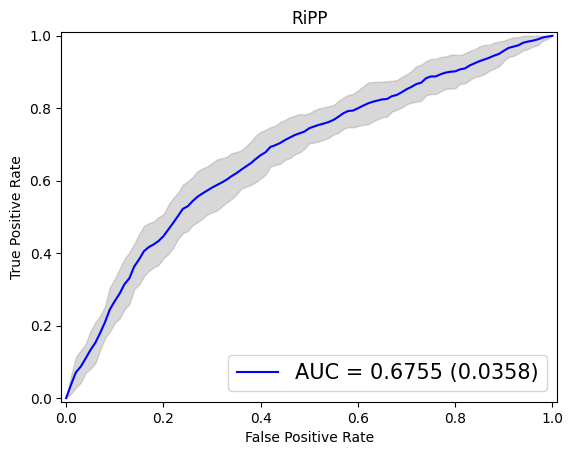

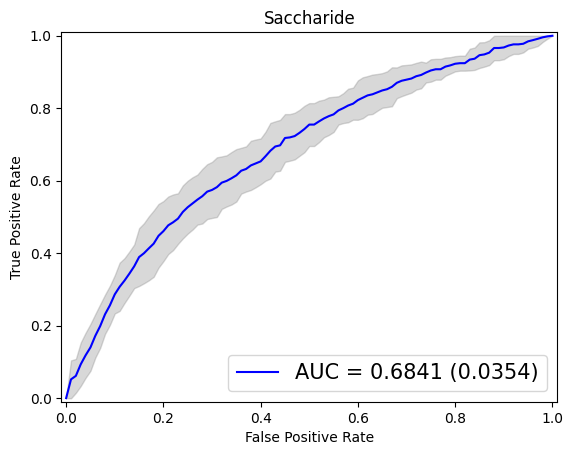

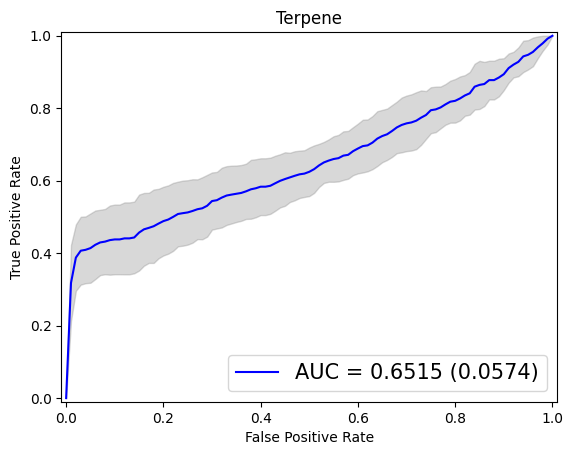

In [310]:
n_inputs_one_hot = X_one_hot.shape[1]
n_inputs_pfam = X_pfam.shape[1]
n_outputs = Y.shape[1]

print('Model: NN1 (1 hidden layer, 100 nodes)')
print('Encoding: Pfam2Vec')
scores_nn1_pfam, std_nn1_pfam = make_classification(X_pfam, Y, nn1(n_inputs_pfam, n_outputs), nn=True, mlp=True, model_name='nn1', encoding='pfam2vec', n_epochs=500)

Model: NN1 (1 hidden layer, 100 nodes)
Encoding: One-Hot Encoding
Learning rate: 0.00001
Split: 0, repeat: 1
Epochs before early stopping: 500


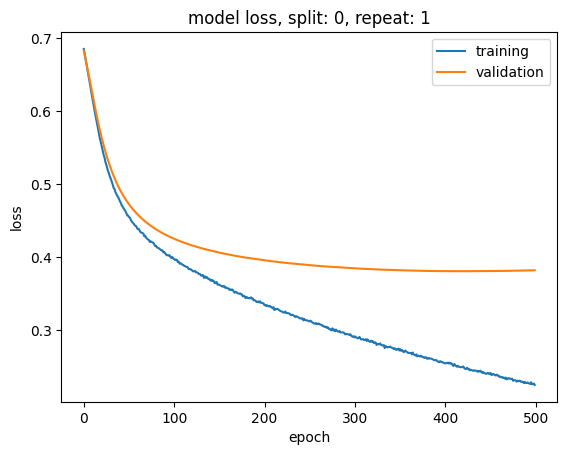

Split: 1, repeat: 1
Epochs before early stopping: 500


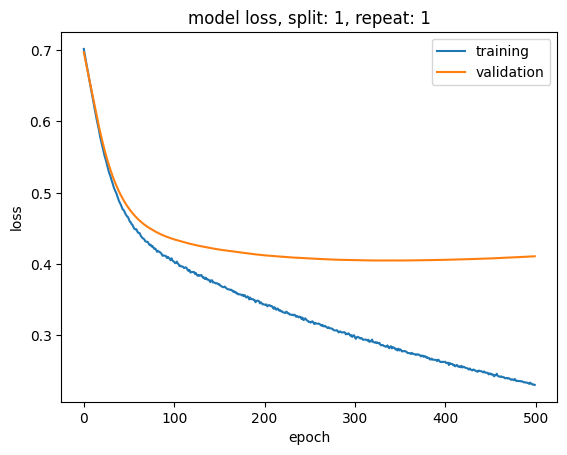

Split: 2, repeat: 1
Epochs before early stopping: 500


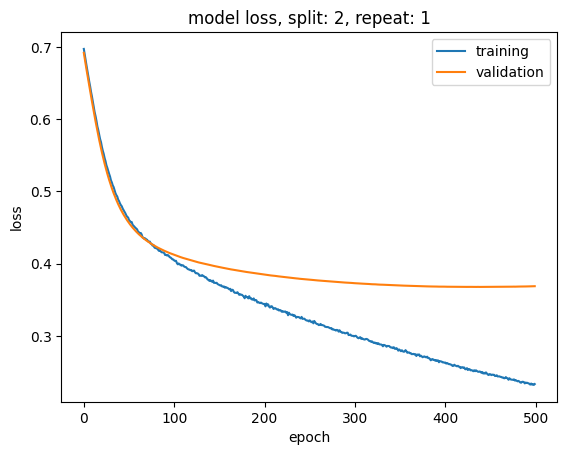

Split: 3, repeat: 1
Epochs before early stopping: 500


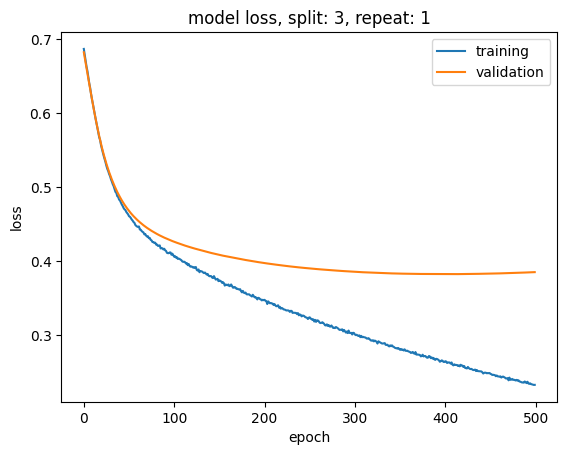

Split: 4, repeat: 1
Epochs before early stopping: 500


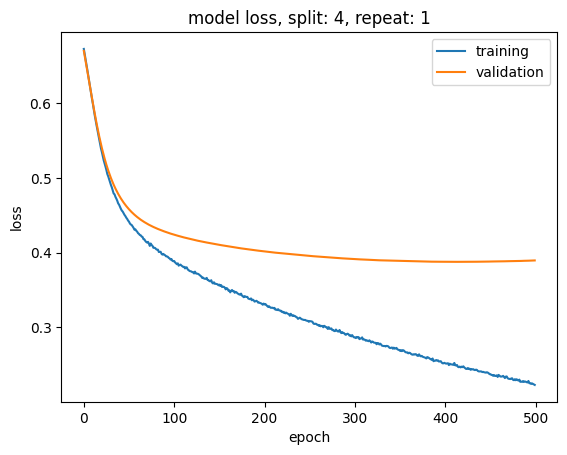

Split: 5, repeat: 2
Epochs before early stopping: 500


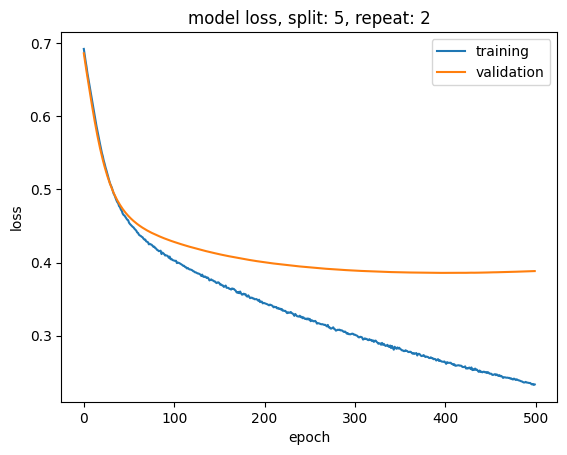

Split: 6, repeat: 2
Epochs before early stopping: 500


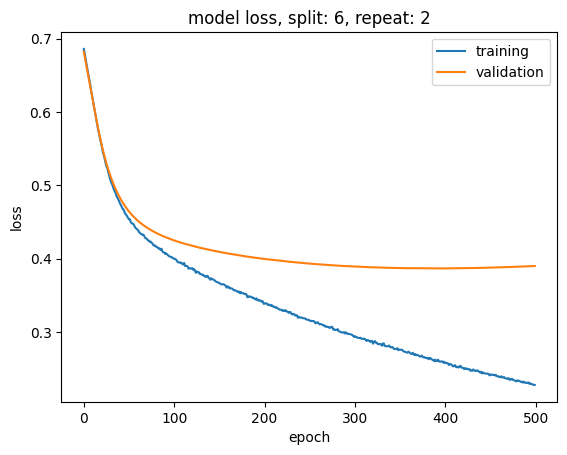

Split: 7, repeat: 2
Epochs before early stopping: 500


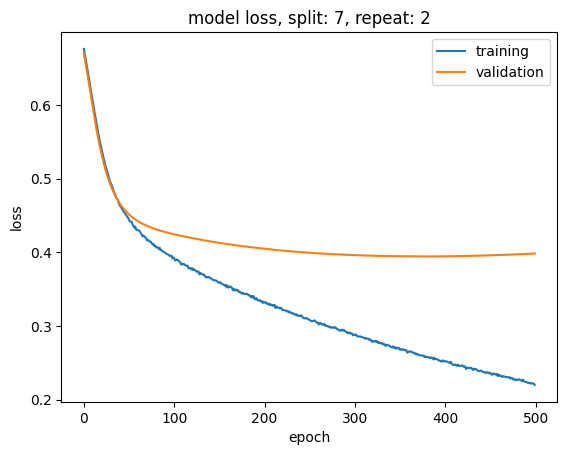

Split: 8, repeat: 2
Epochs before early stopping: 500


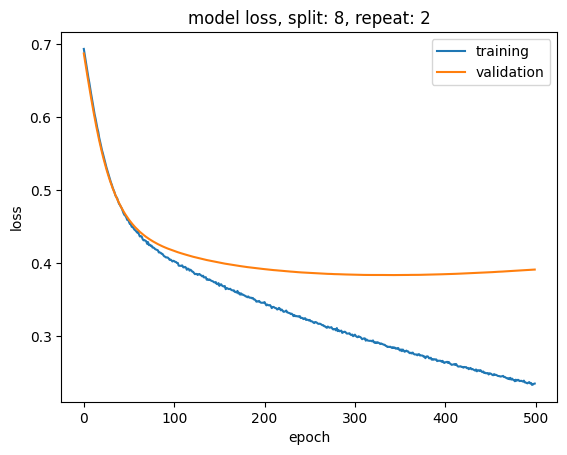

Split: 9, repeat: 2
Epochs before early stopping: 500


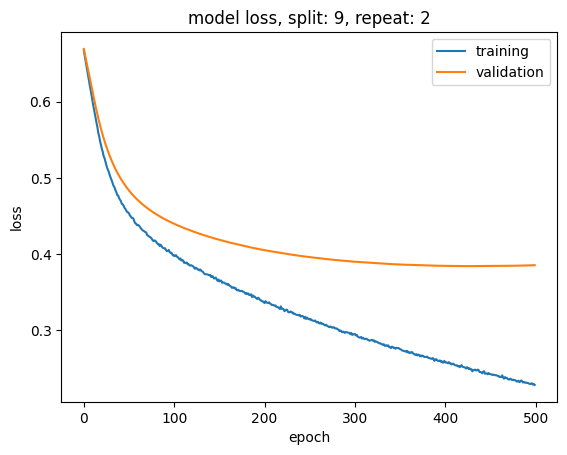

Split: 10, repeat: 3
Epochs before early stopping: 500


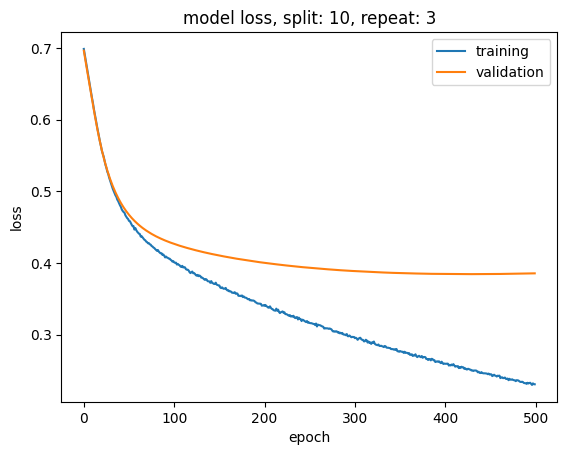

Split: 11, repeat: 3
Epochs before early stopping: 500


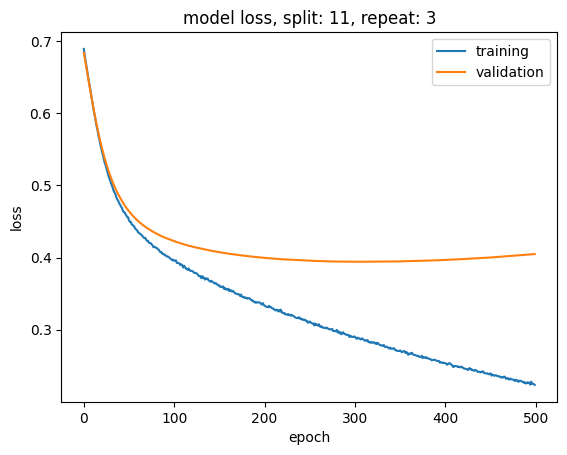

Split: 12, repeat: 3
Epochs before early stopping: 500


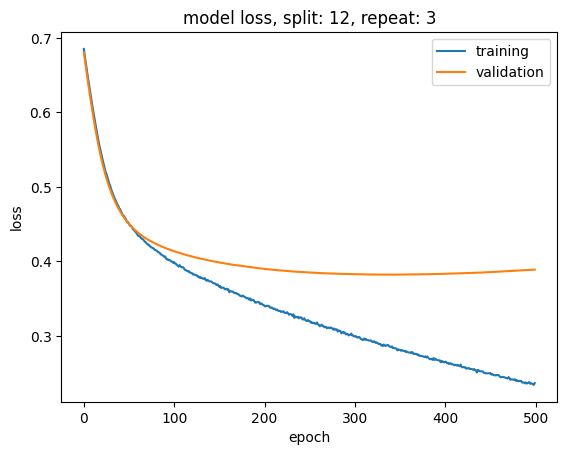

Split: 13, repeat: 3
Epochs before early stopping: 500


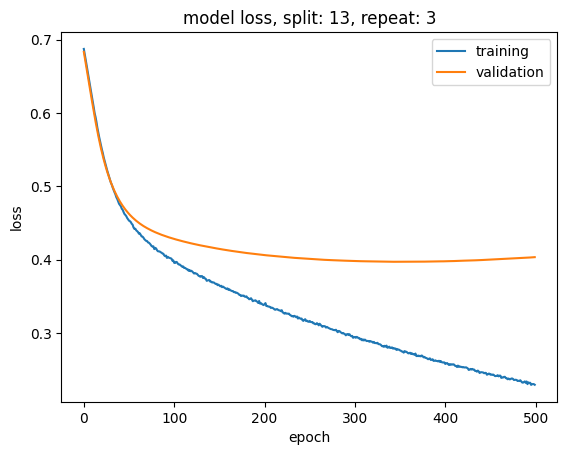

Split: 14, repeat: 3
Epochs before early stopping: 500


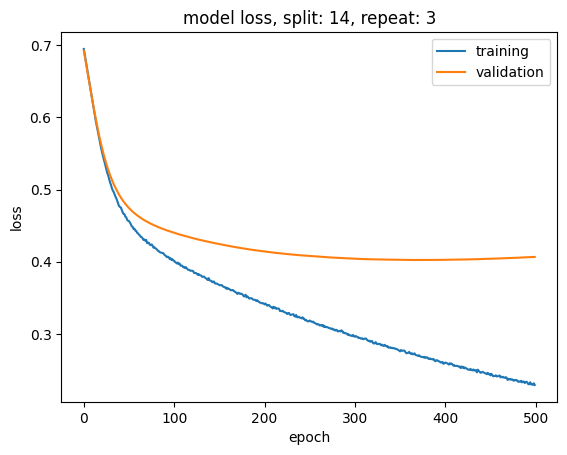

Accuracy: 0.1838(0.0115)
F1 score: 0.2964(0.015)
Precision: 0.5098(0.0527)
Recall: 0.2365(0.0136)
AUC: 0.6431(0.0117)


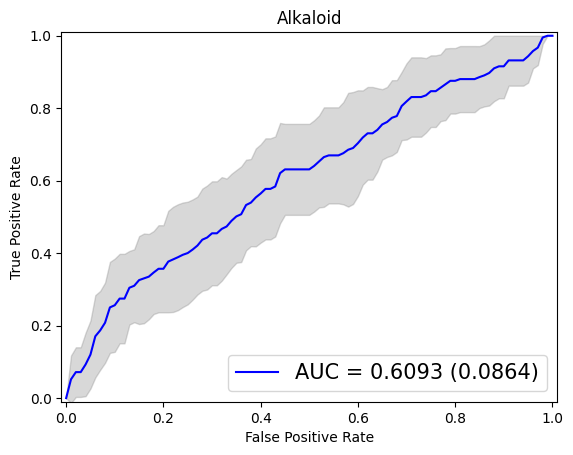

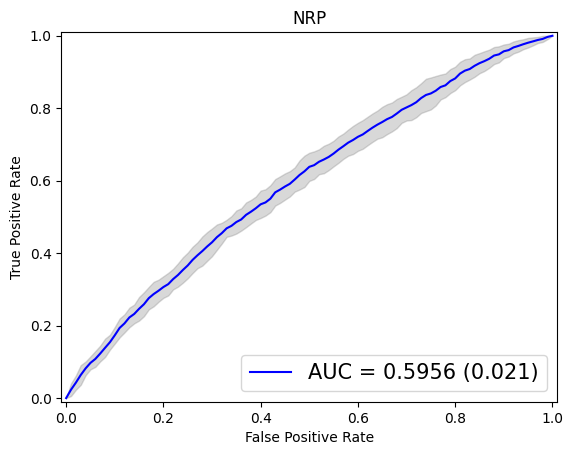

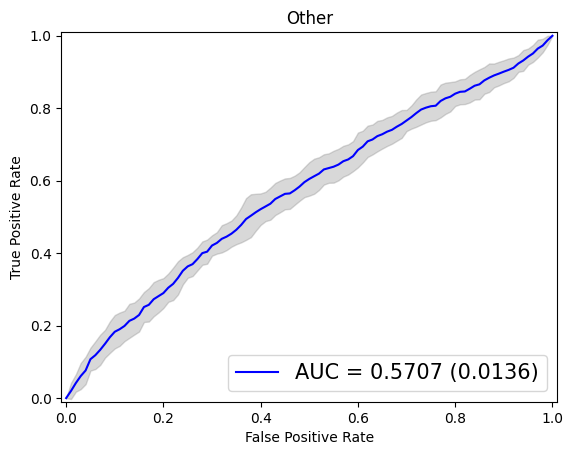

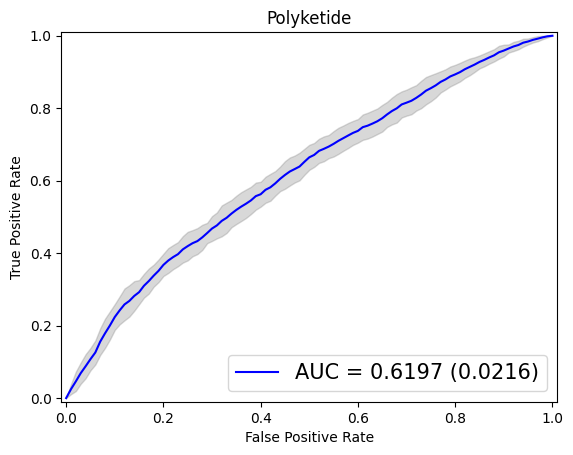

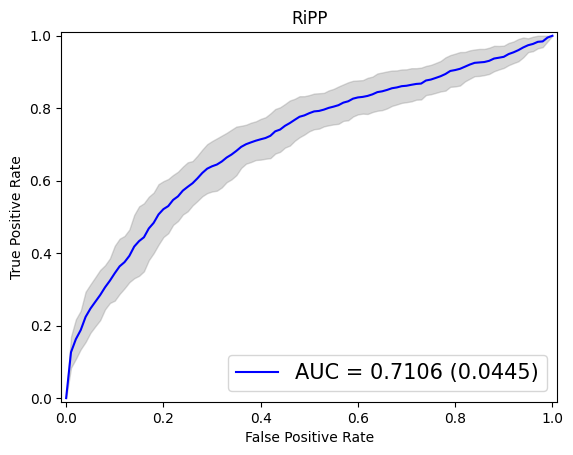

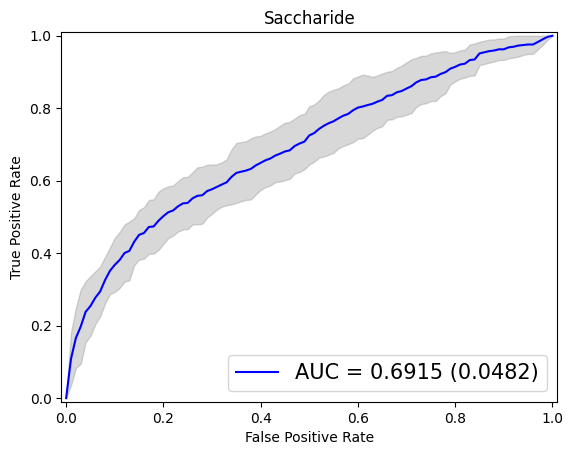

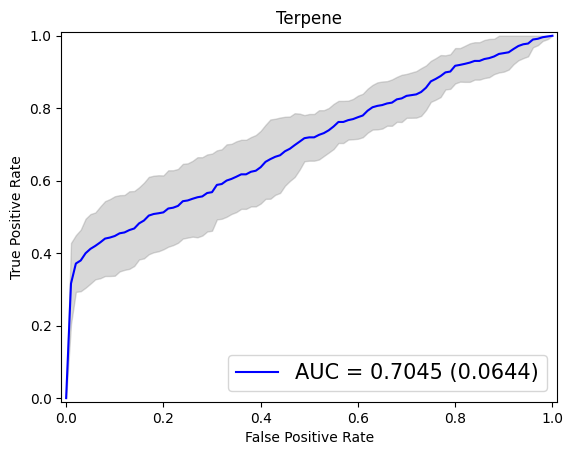

In [316]:
print('Model: NN1 (1 hidden layer, 100 nodes)')
print('Encoding: One-Hot Encoding')
print('Learning rate: 0.00001')
scores_nn1_one_hot, std_nn1_one_hot = make_classification(X_one_hot, Y, nn1(n_inputs_one_hot, n_outputs), nn=True, mlp=True, n_epochs=500, learning_rate=0.00001, model_name='nn1', encoding='one_hot')

Already for MLP with one hidden layer, One-Hot Encoding shows clear overfitting issue (training loss keeps decreasing even after 500 epochs). This wasn't solved even after 100x decreasing learning rate. :-(

Let's experiment with different number of hidden layers and then different number of neurons per hidden layer...

In [317]:
def nn2(n_inputs, n_outputs):
    
    model = Sequential()
    model.add(Dense(100, input_dim=n_inputs, kernel_initializer='he_uniform', activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(100, activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(n_outputs, activation='sigmoid'))
    
    return model

Model: NN2 (2 hidden layers, 100 nodes)
Encoding: One-Hot Encoding
Learning Rate: 0.00001
Epochs: 500
Split: 0, repeat: 1
Epochs before early stopping: 500


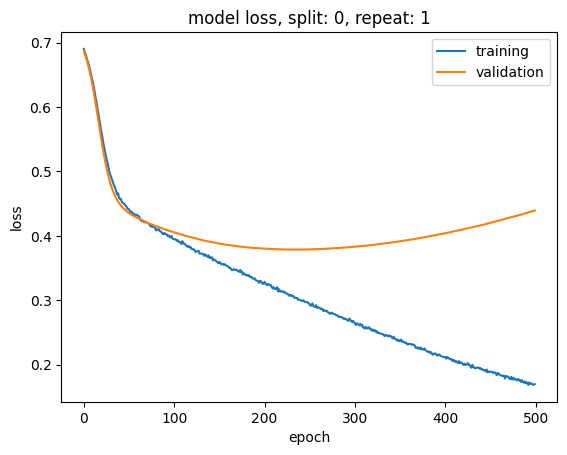

Split: 1, repeat: 1
Epochs before early stopping: 500


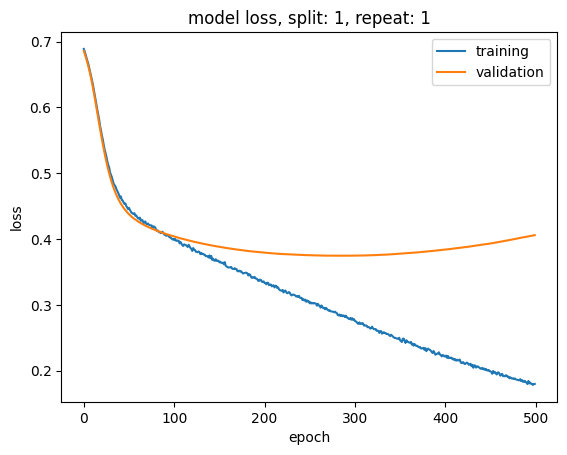

Split: 2, repeat: 1
Epochs before early stopping: 500


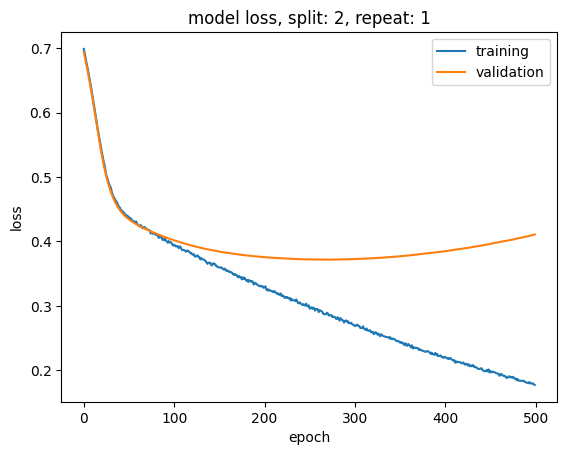

Split: 3, repeat: 1
Epochs before early stopping: 500


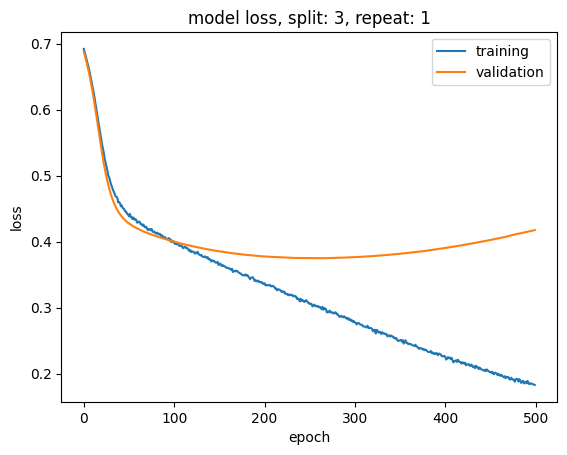

Split: 4, repeat: 1
Epochs before early stopping: 500


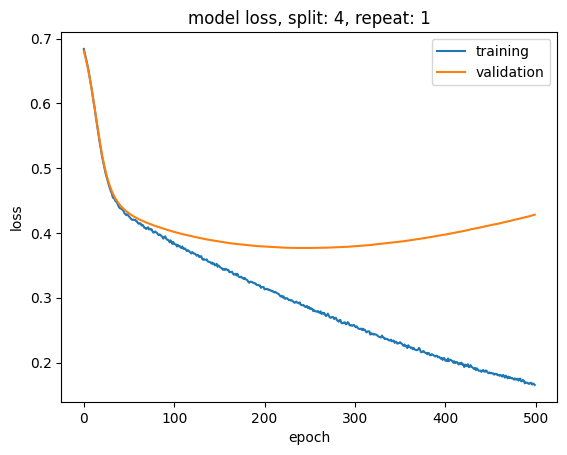

Split: 5, repeat: 2
Epochs before early stopping: 500


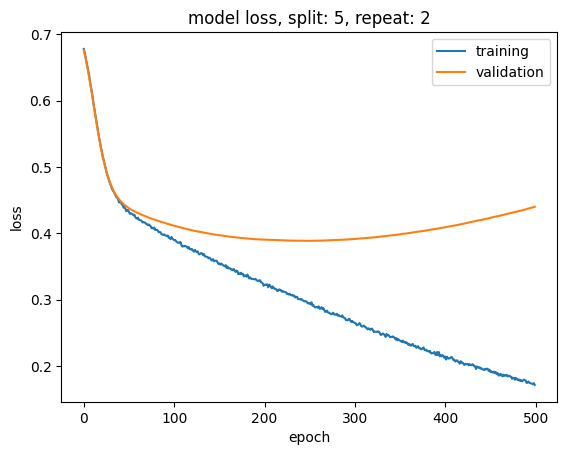

Split: 6, repeat: 2
Epochs before early stopping: 500


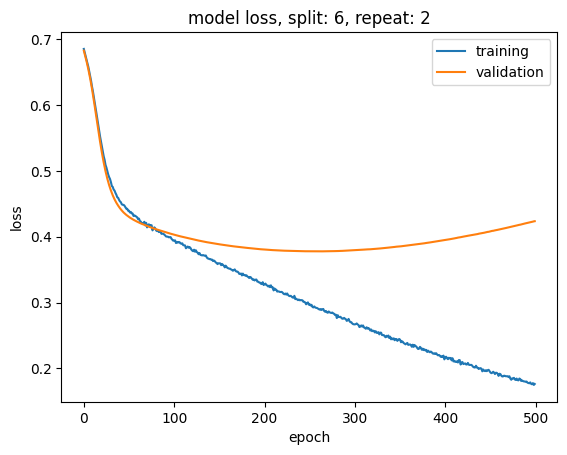

Split: 7, repeat: 2
Epochs before early stopping: 500


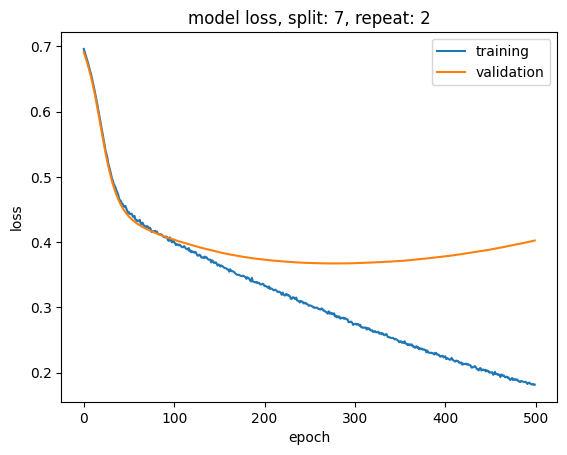

Split: 8, repeat: 2
Epochs before early stopping: 500


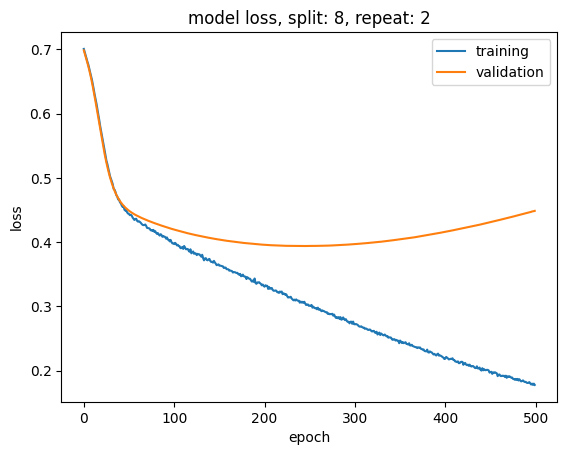

Split: 9, repeat: 2
Epochs before early stopping: 500


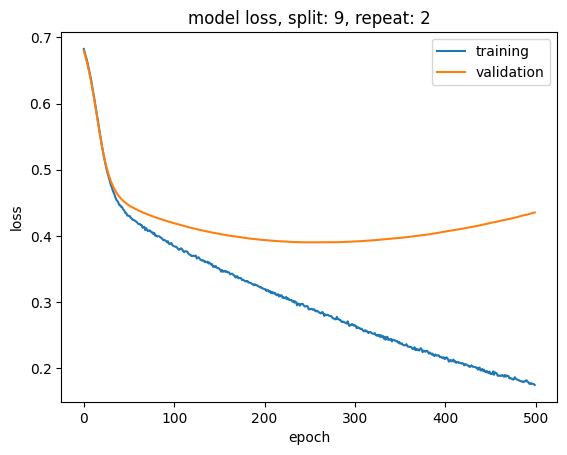

Split: 10, repeat: 3
Epochs before early stopping: 500


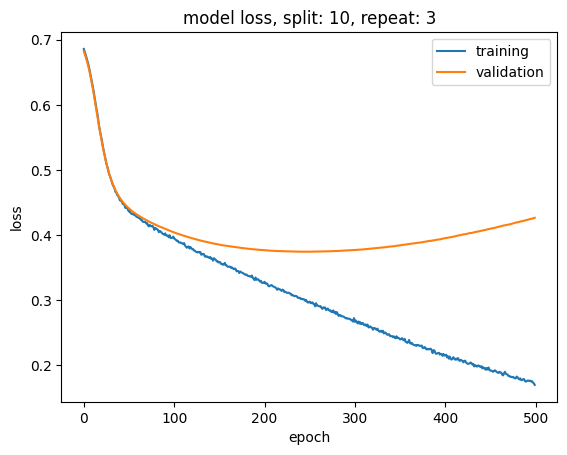

Split: 11, repeat: 3
Epochs before early stopping: 500


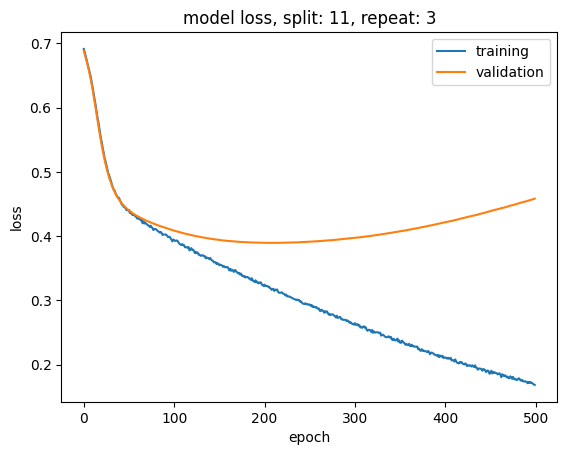

Split: 12, repeat: 3
Epochs before early stopping: 500


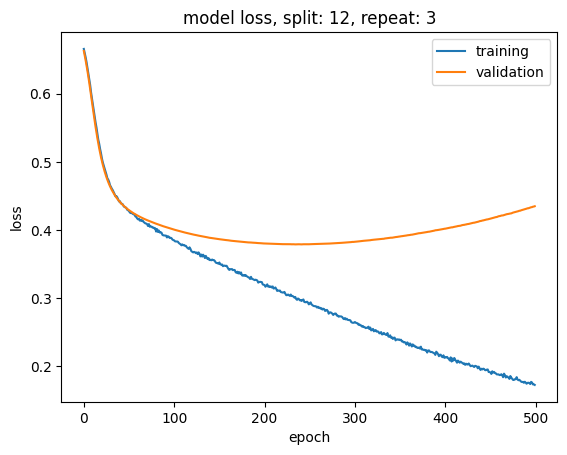

Split: 13, repeat: 3
Epochs before early stopping: 500


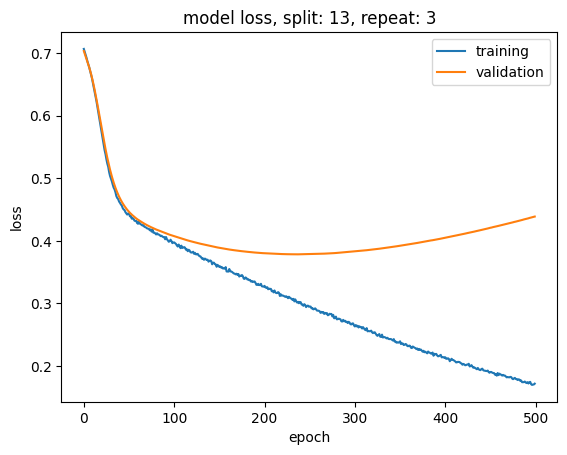

Split: 14, repeat: 3
Epochs before early stopping: 500


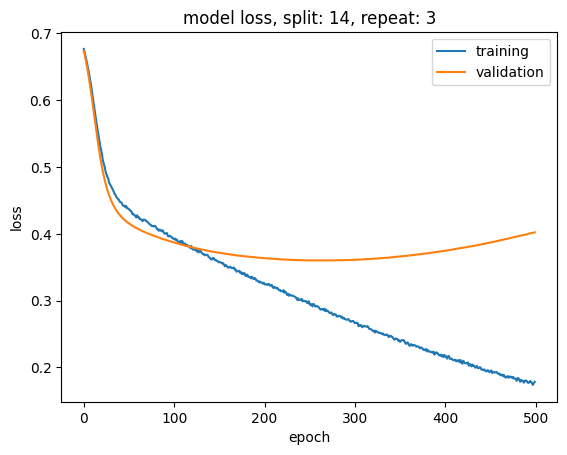

Accuracy: 0.2012(0.0153)
F1 score: 0.3315(0.018)
Precision: 0.4913(0.0431)
Recall: 0.2799(0.0162)
AUC: 0.6334(0.0131)


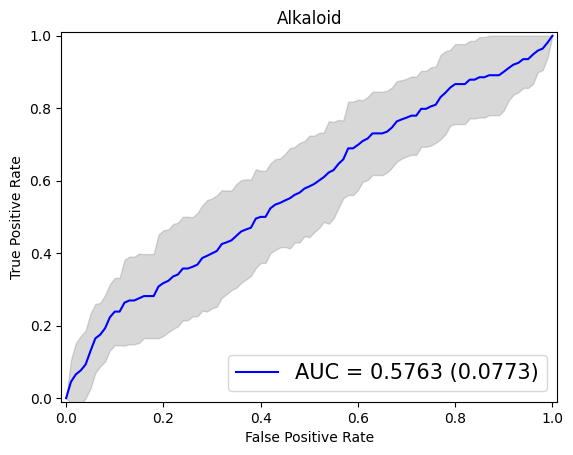

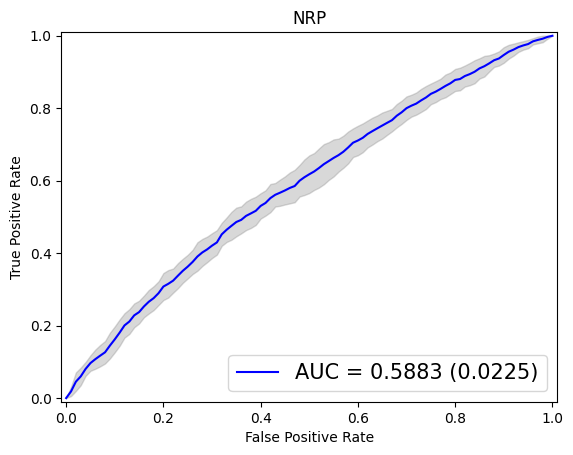

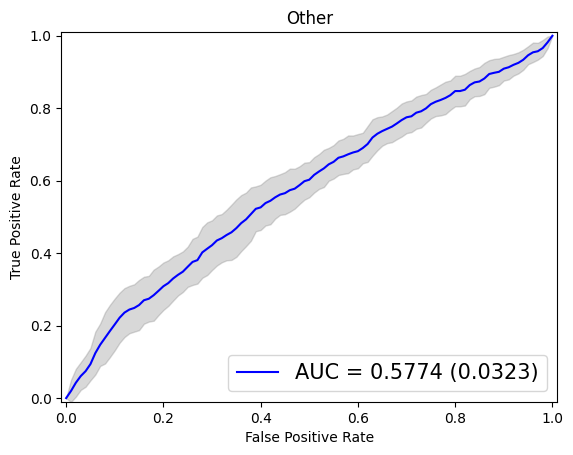

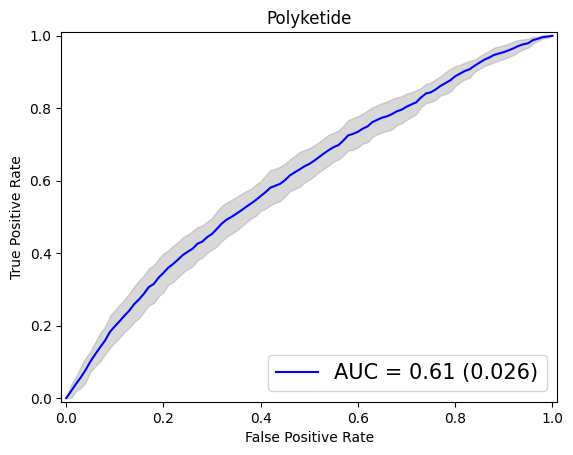

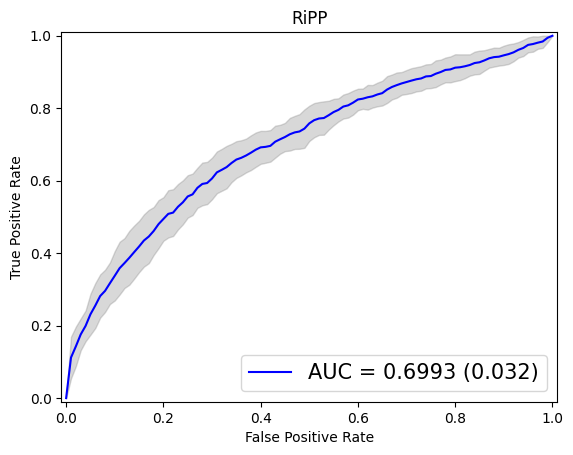

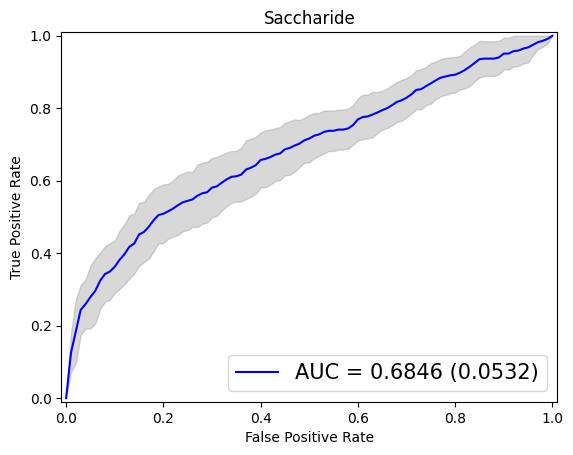

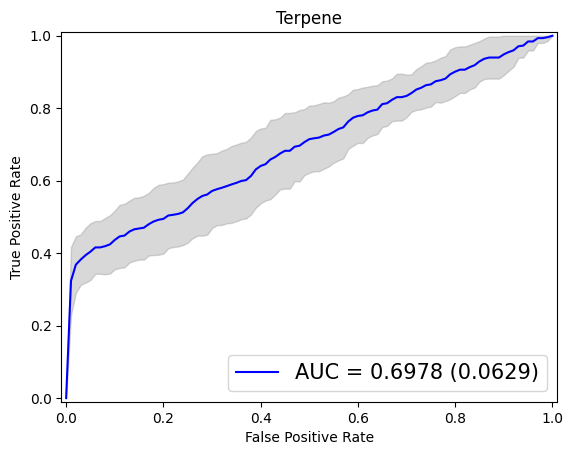

In [320]:
print('Model: NN2 (2 hidden layers, 100 nodes)')
print('Encoding: One-Hot Encoding')
print('Learning Rate: 0.00001')
print('Epochs: 500')
scores_nn2_one_hot, std_nn2_one_hot = make_classification(X_one_hot, Y, nn2(n_inputs_one_hot, n_outputs), n_epochs=500, learning_rate=0.00001, nn=True, mlp=True, model_name='nn2', encoding='one_hot')

Same issue arose with the second NN architecture, this time it appears to be even more significant. After reading this post: https://www.kdnuggets.com/2019/12/5-techniques-prevent-overfitting-neural-networks.html I have decided to only try simplified architectures on one-hot encoded input. 

Model: NN2 (2 hidden layers, 100 nodes)
Encoding: Pfam2Vec
Split: 0, repeat: 1
Epochs before early stopping: 73


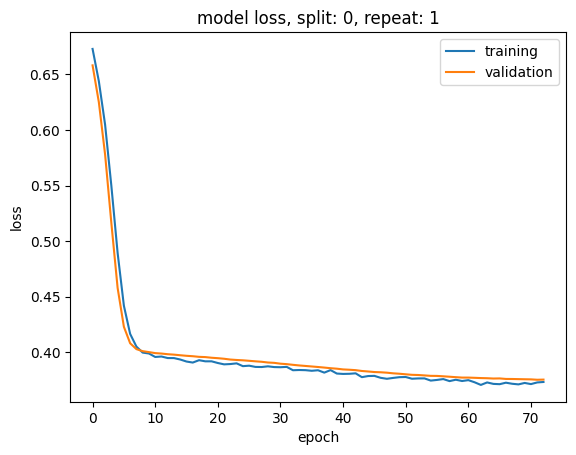

Split: 1, repeat: 1
Epochs before early stopping: 146


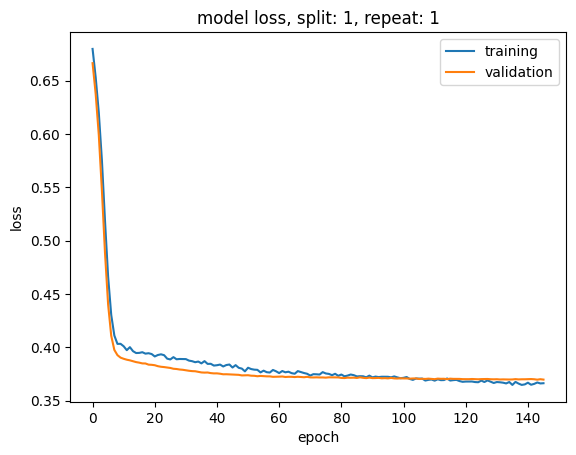

Split: 2, repeat: 1
Epochs before early stopping: 186


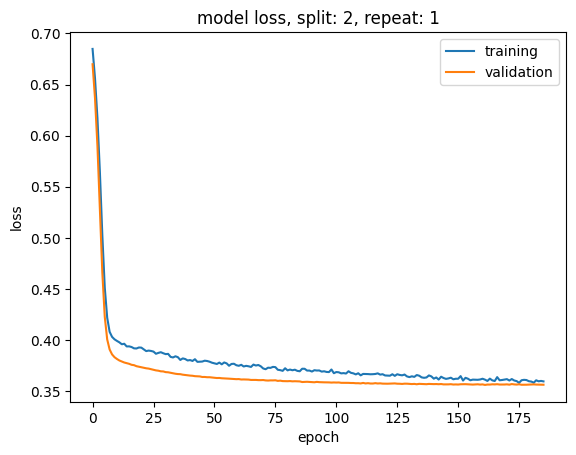

Split: 3, repeat: 1
Epochs before early stopping: 133


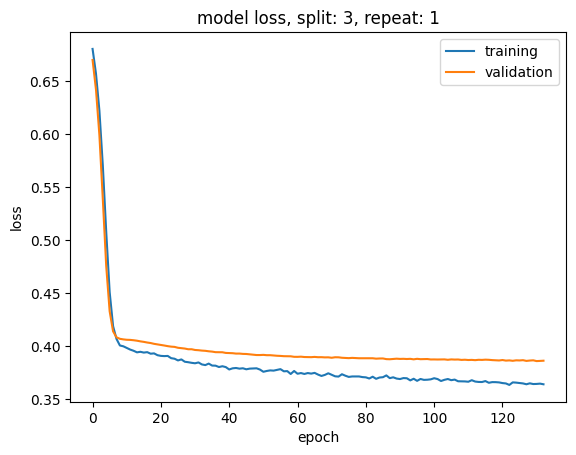

Split: 4, repeat: 1
Epochs before early stopping: 196


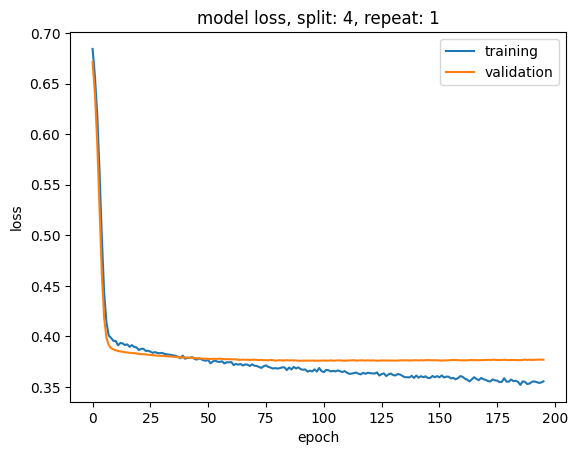

Split: 5, repeat: 2
Epochs before early stopping: 200


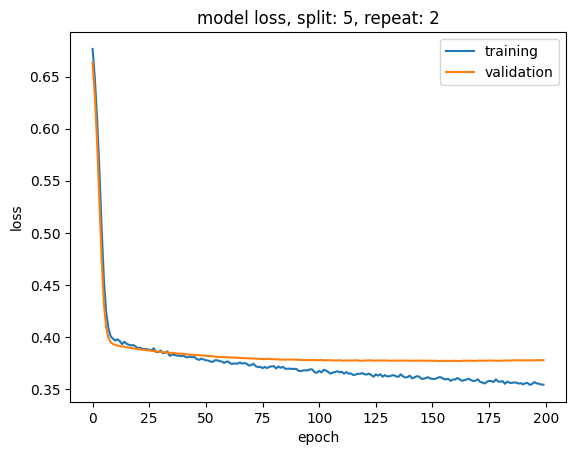

Split: 6, repeat: 2
Epochs before early stopping: 200


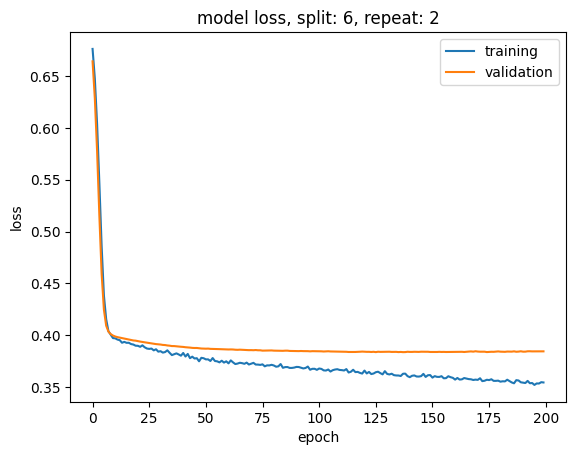

Split: 7, repeat: 2
Epochs before early stopping: 146


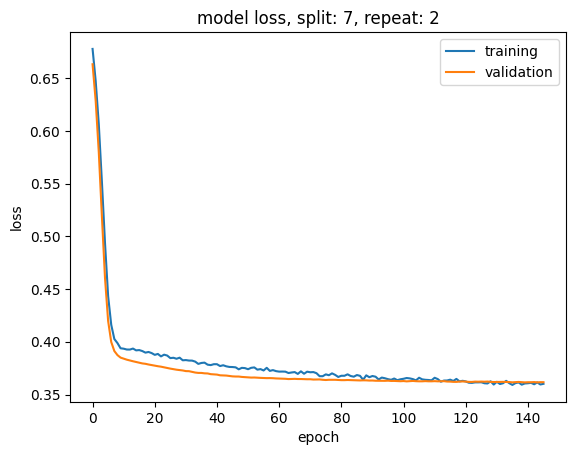

Split: 8, repeat: 2
Epochs before early stopping: 163


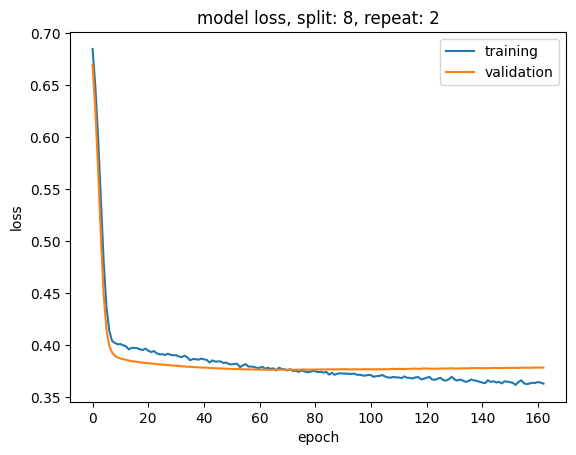

Split: 9, repeat: 2
Epochs before early stopping: 89


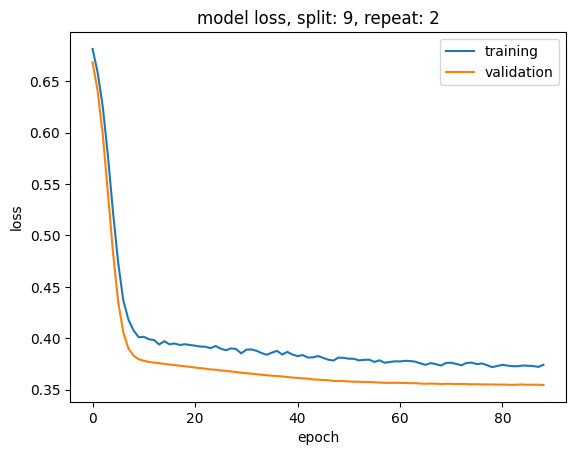

Split: 10, repeat: 3
Epochs before early stopping: 105


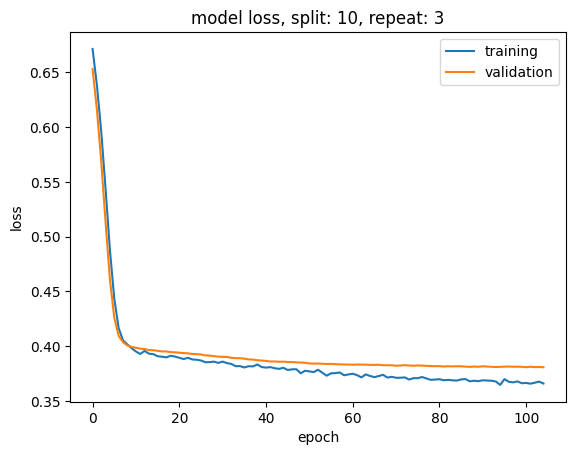

Split: 11, repeat: 3
Epochs before early stopping: 174


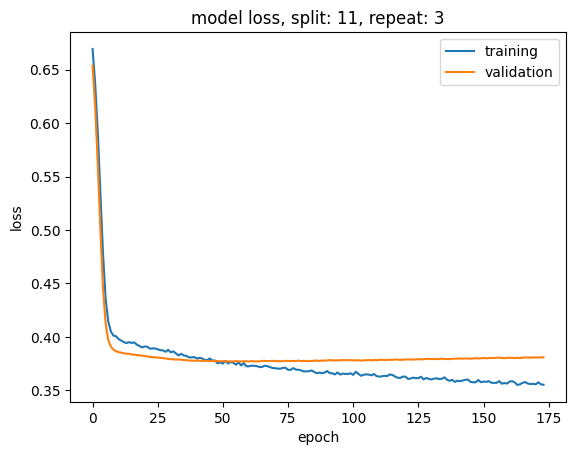

Split: 12, repeat: 3
Epochs before early stopping: 113


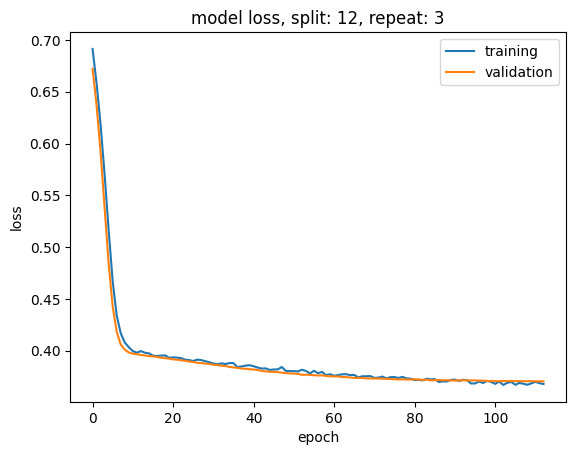

Split: 13, repeat: 3
Epochs before early stopping: 135


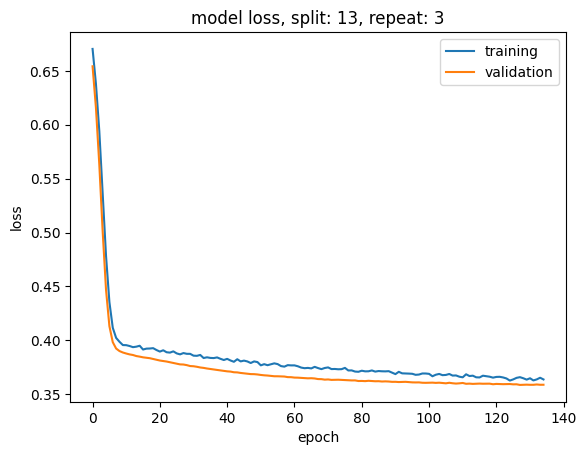

Split: 14, repeat: 3
Epochs before early stopping: 107


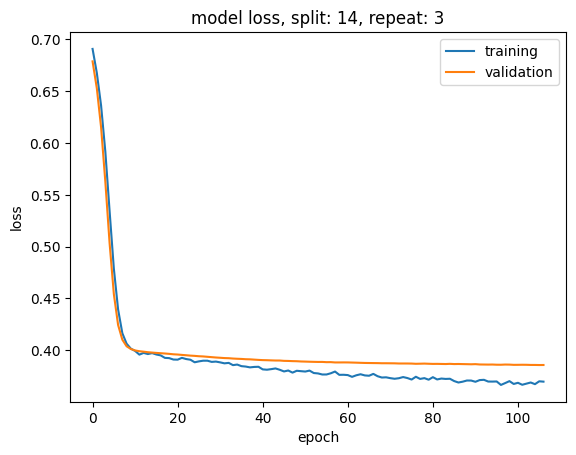

Accuracy: 0.1464(0.0214)
F1 score: 0.2284(0.0253)
Precision: 0.3737(0.0451)
Recall: 0.1843(0.0228)
AUC: 0.639(0.019)


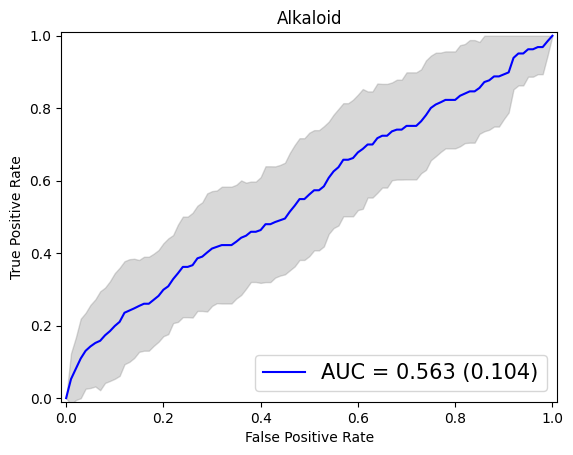

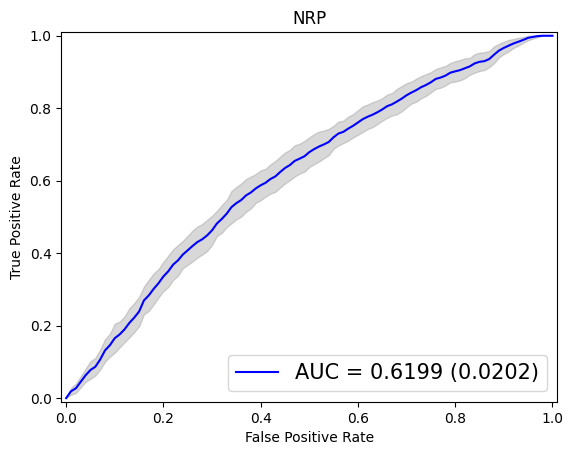

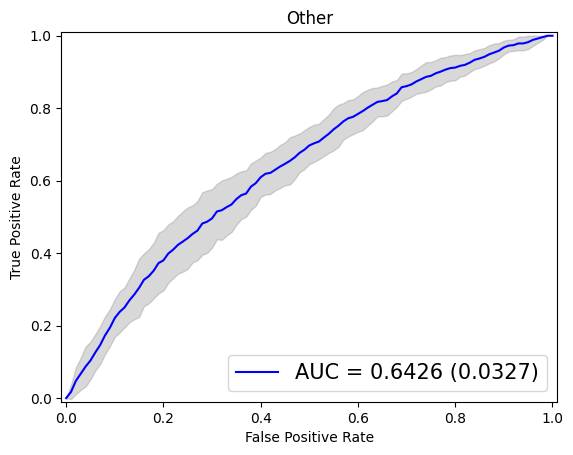

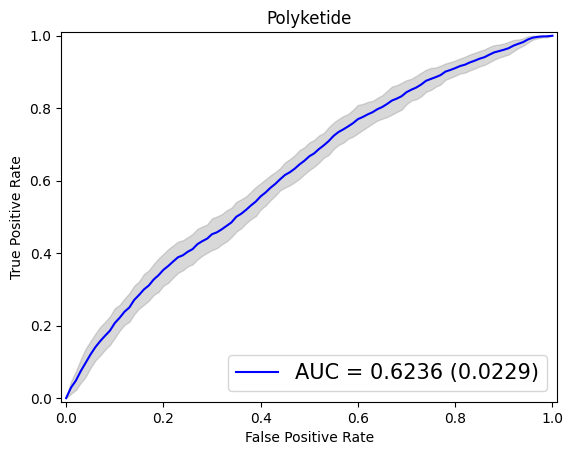

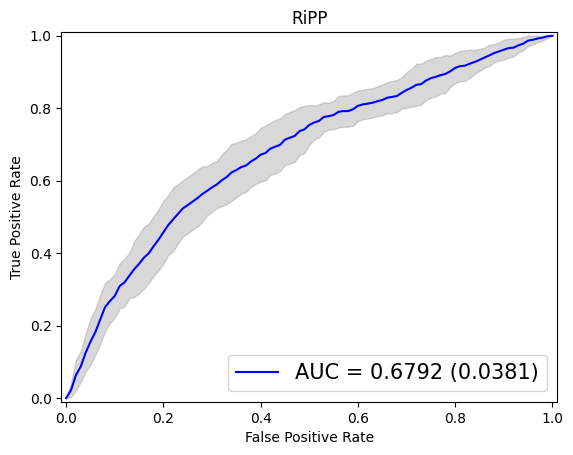

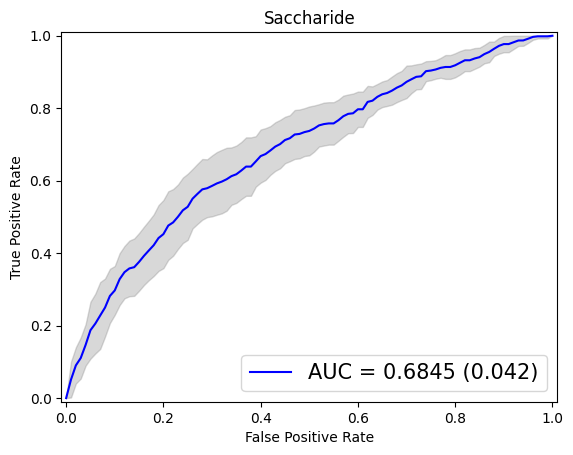

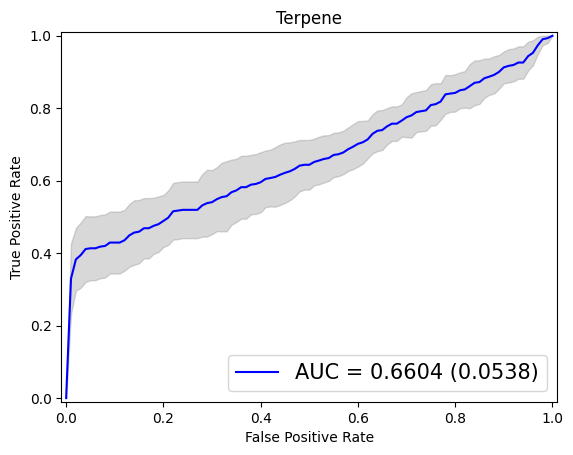

In [318]:
print('Model: NN2 (2 hidden layers, 100 nodes)')
print('Encoding: Pfam2Vec')
scores_nn2_pfam, std_nn2_pfam = make_classification(X_pfam, Y, nn2(n_inputs_pfam, n_outputs), nn=True, mlp=True, model_name='nn2', encoding='pfam2vec')

In [373]:
def nn3(n_inputs, n_outputs):    
    model = Sequential()
    model.add(Dense(100, input_dim=n_inputs, kernel_initializer='he_uniform', activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(100, activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(100, activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(n_outputs, activation='sigmoid'))
    
    return model

Model: NN3 (3 hidden layers, 100 nodes)
Encoding: Pfam2Vec
Split: 0, repeat: 1
Epochs before early stopping: 90


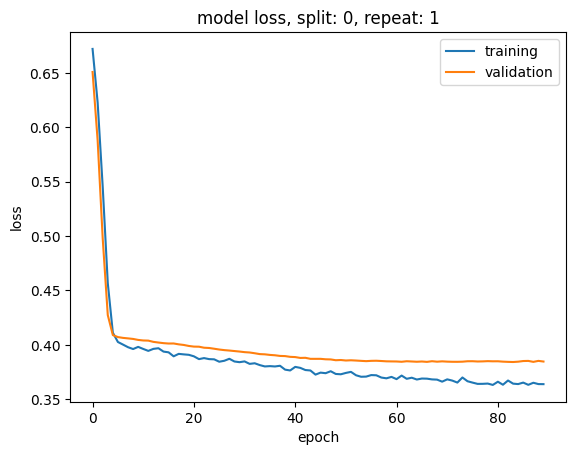

Split: 1, repeat: 1
Epochs before early stopping: 158


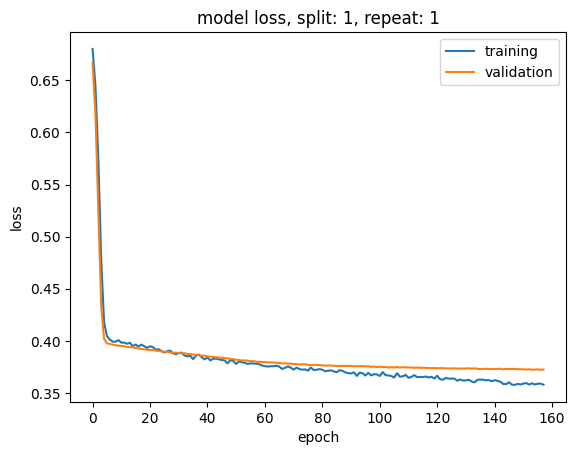

Split: 2, repeat: 1
Epochs before early stopping: 83


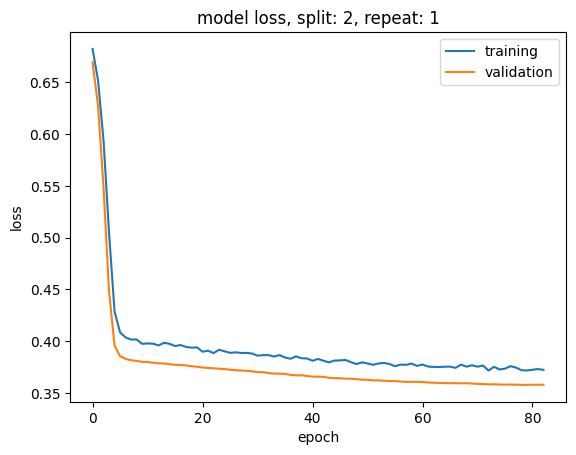

Split: 3, repeat: 1
Epochs before early stopping: 143


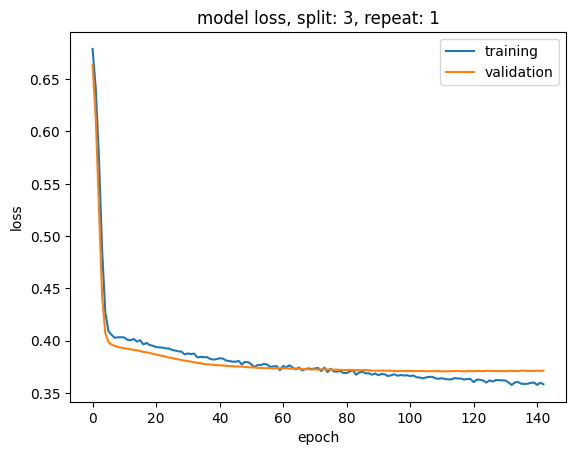

Split: 4, repeat: 1
Epochs before early stopping: 176


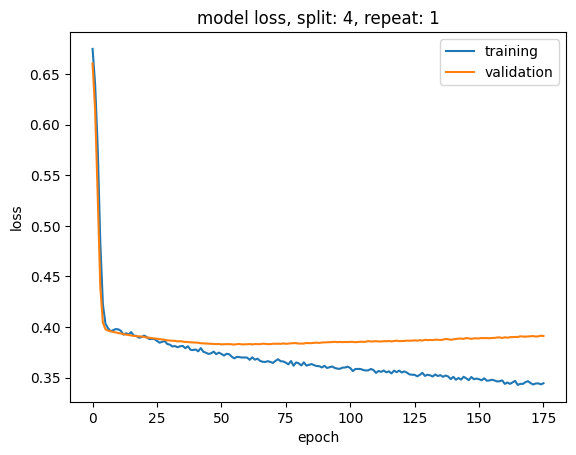

Split: 5, repeat: 2
Epochs before early stopping: 188


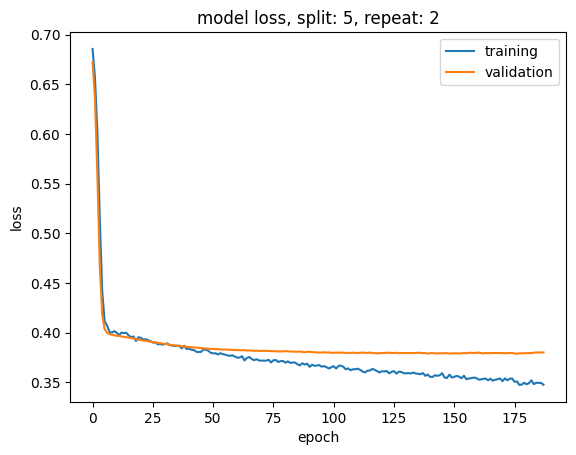

Split: 6, repeat: 2
Epochs before early stopping: 98


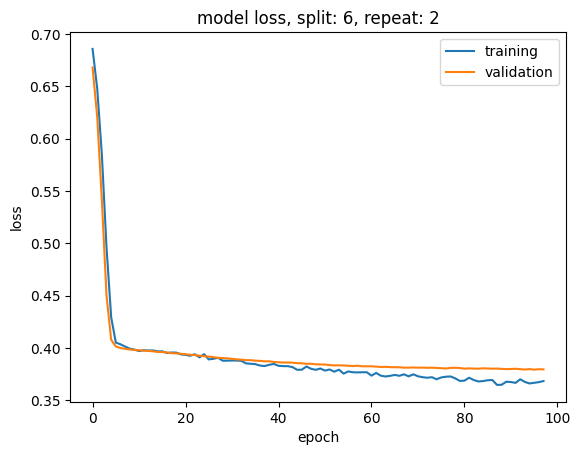

Split: 7, repeat: 2
Epochs before early stopping: 187


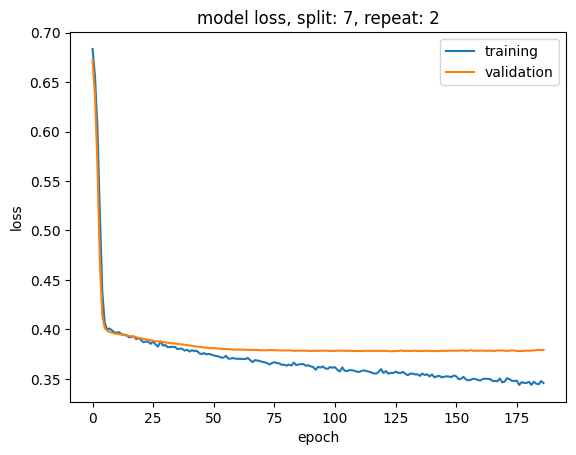

Split: 8, repeat: 2
Epochs before early stopping: 64


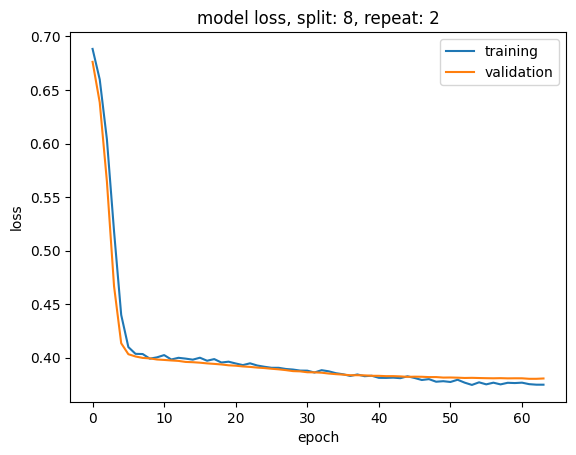

Split: 9, repeat: 2
Epochs before early stopping: 63


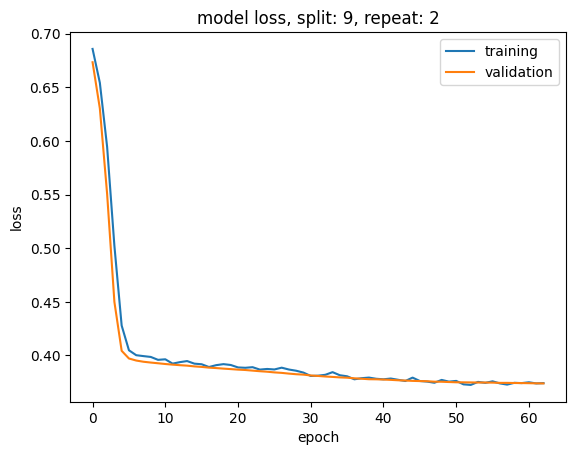

Split: 10, repeat: 3
Epochs before early stopping: 197


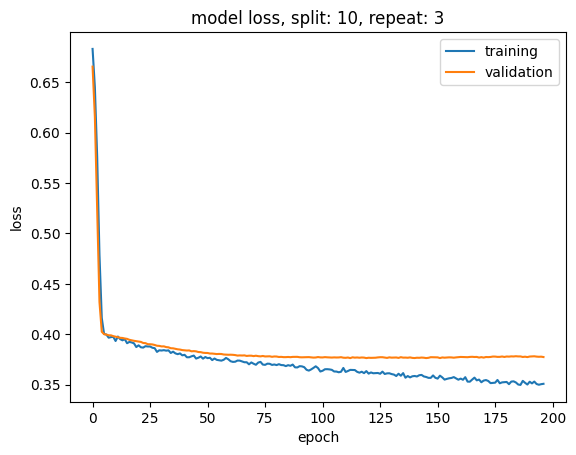

Split: 11, repeat: 3
Epochs before early stopping: 145


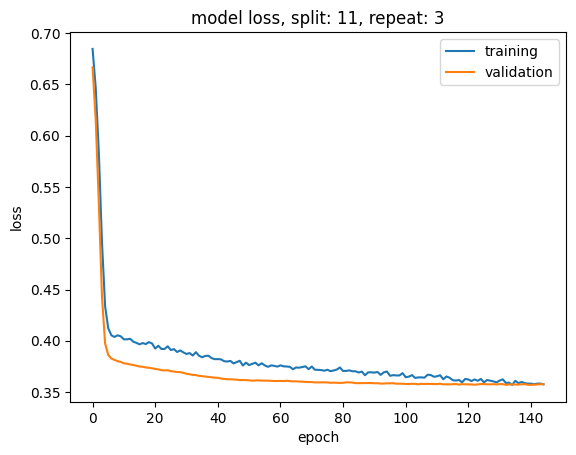

Split: 12, repeat: 3
Epochs before early stopping: 79


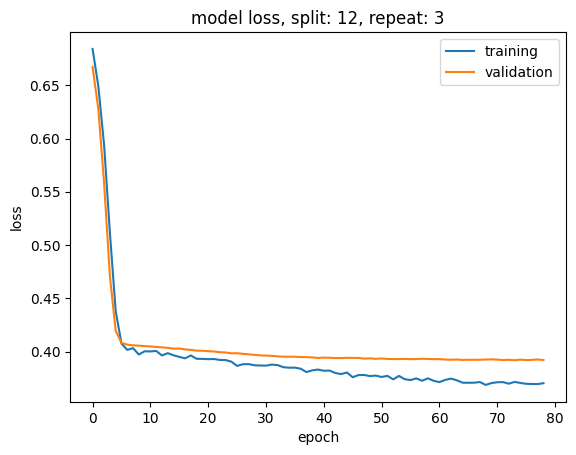

Split: 13, repeat: 3
Epochs before early stopping: 200


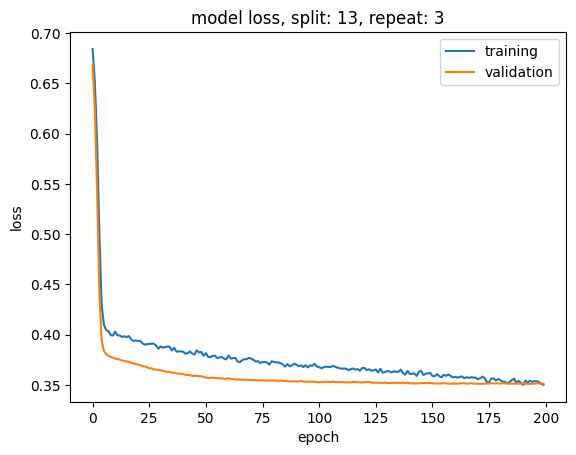

Split: 14, repeat: 3
Epochs before early stopping: 111


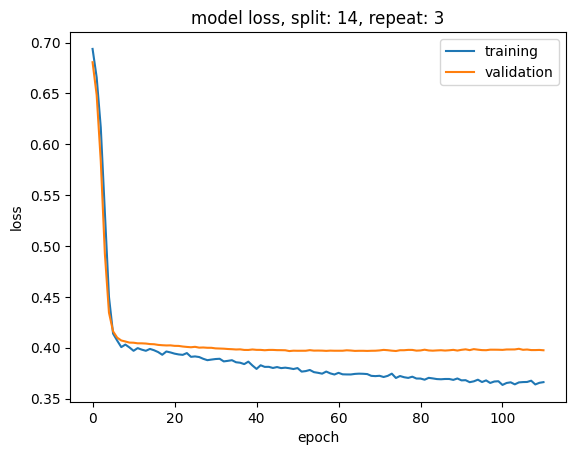

Accuracy: 0.1615(0.0293)
F1 score: 0.2415(0.036)
Precision: 0.3728(0.0677)
Recall: 0.2037(0.0351)
AUC: 0.6373(0.0252)


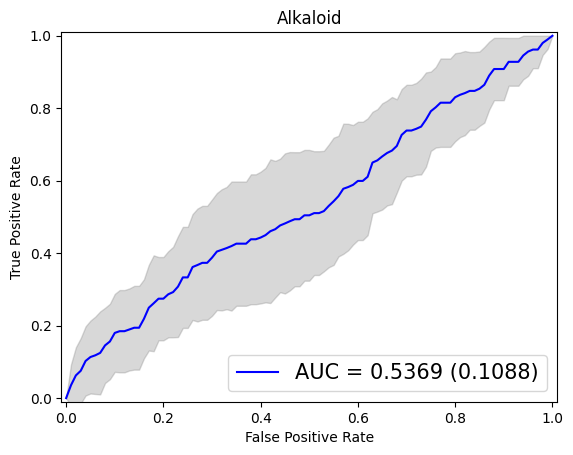

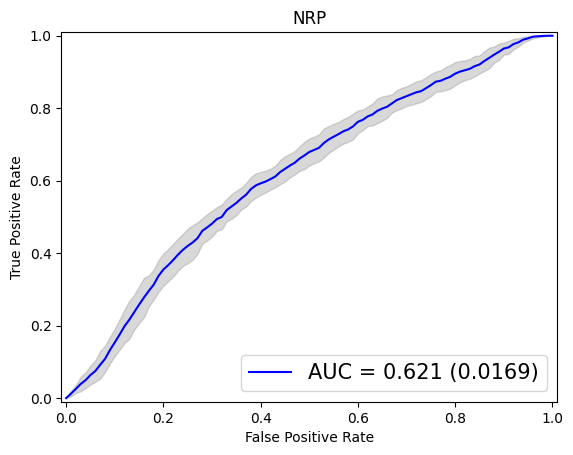

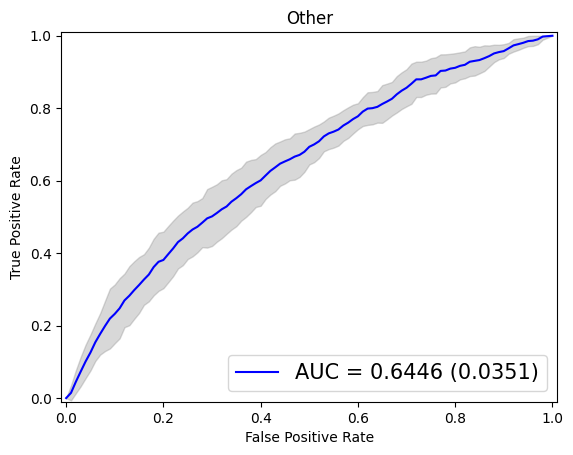

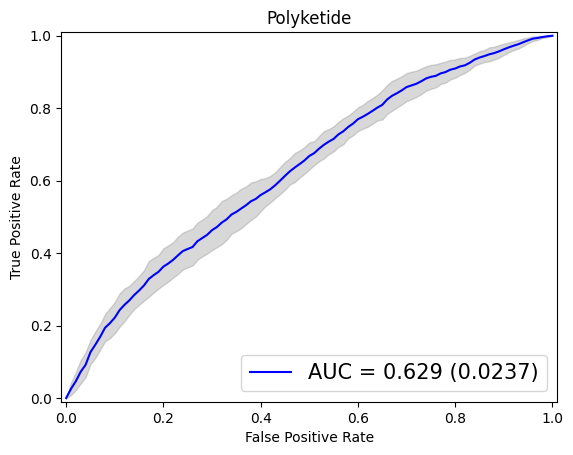

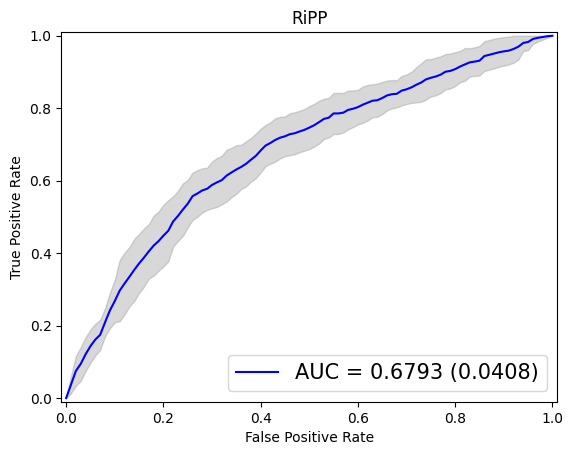

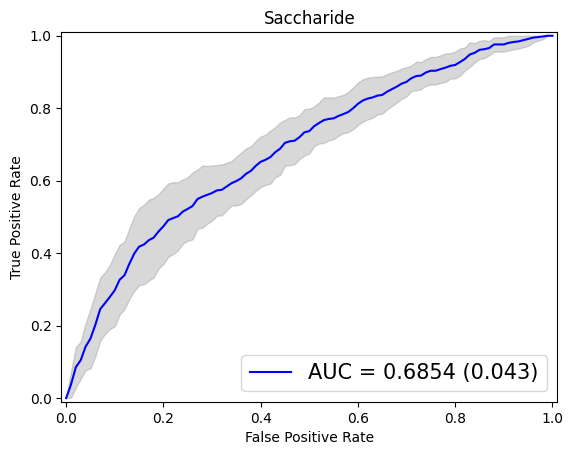

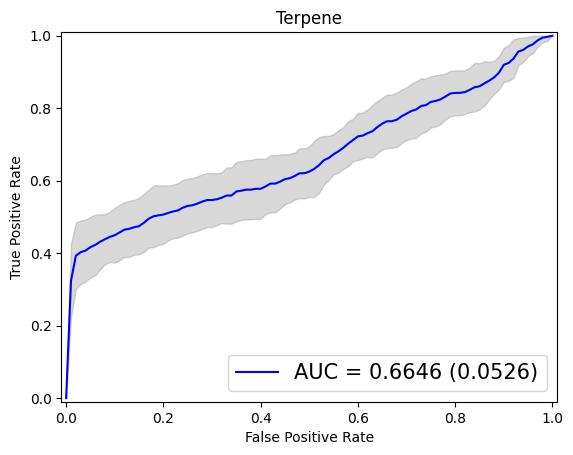

In [323]:
print('Model: NN3 (3 hidden layers, 100 nodes)')
print('Encoding: Pfam2Vec')
scores_nn3_pfam, std_nn3_pfam = make_classification(X_pfam, Y, nn3(n_inputs_pfam, n_outputs), nn=True, mlp=True, model_name='nn3', encoding='pfam2vec')

In [337]:
def nn4(n_inputs, n_outputs):
    model = Sequential()
    model.add(Dense(100, input_dim=n_inputs, kernel_initializer='he_uniform', activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(100, activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(100, activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(100, activation='relu'))
    model.add(Dropout(0.2))

    model.add(Dense(n_outputs, activation='sigmoid'))
    
    return model

Model: NN4 (4 hidden layers, 100 nodes)
Encoding: Pfam2Vec
Epochs: 500
Split: 0, repeat: 1
Epochs before early stopping: 79


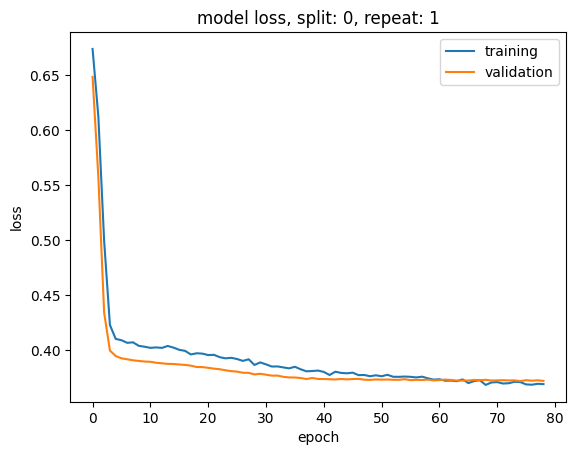

Split: 1, repeat: 1
Epochs before early stopping: 173


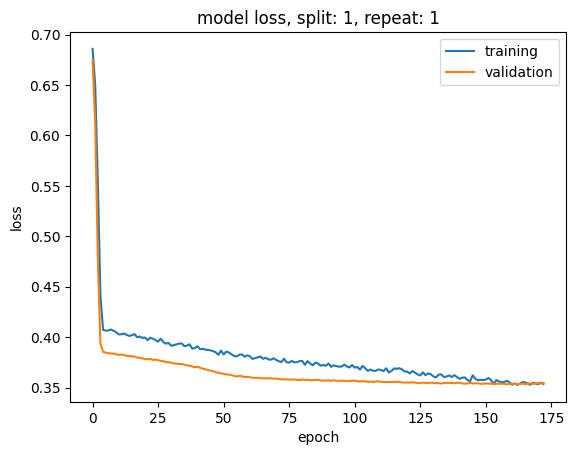

Split: 2, repeat: 1
Epochs before early stopping: 133


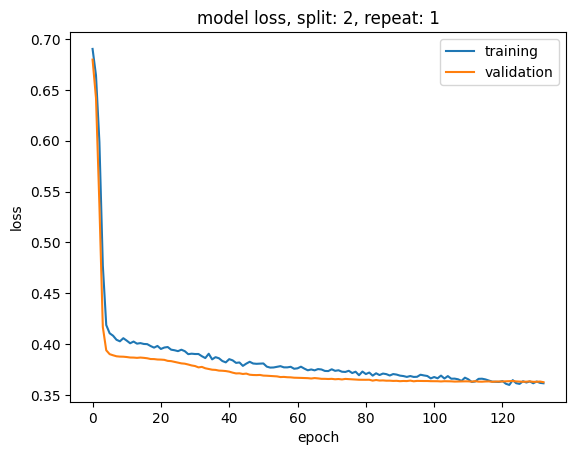

Split: 3, repeat: 1
Epochs before early stopping: 132


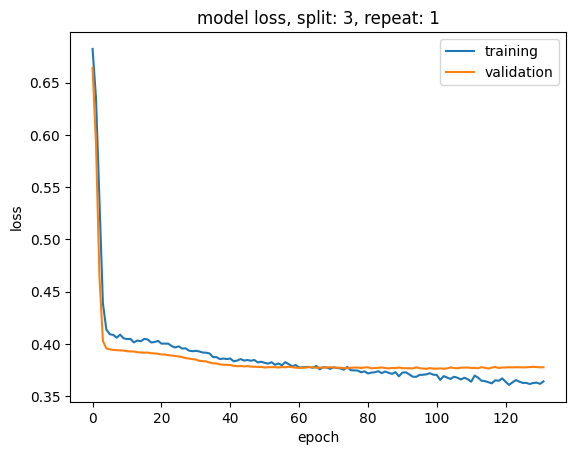

Split: 4, repeat: 1
Epochs before early stopping: 275


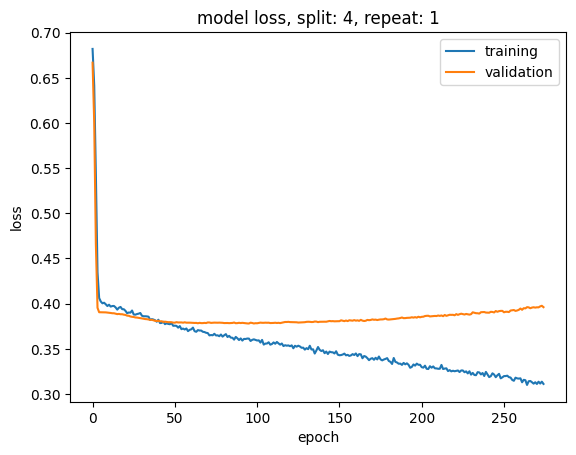

Split: 5, repeat: 2
Epochs before early stopping: 108


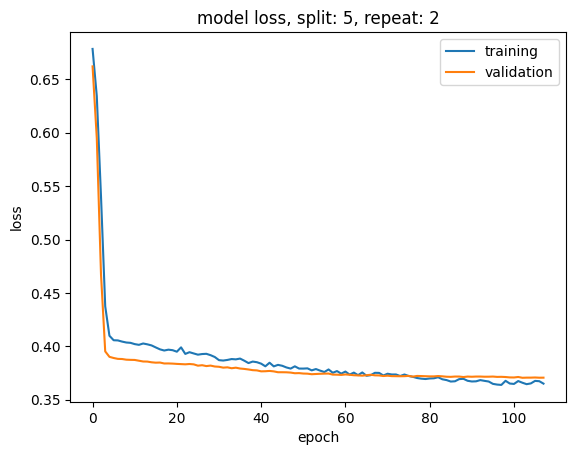

Split: 6, repeat: 2
Epochs before early stopping: 196


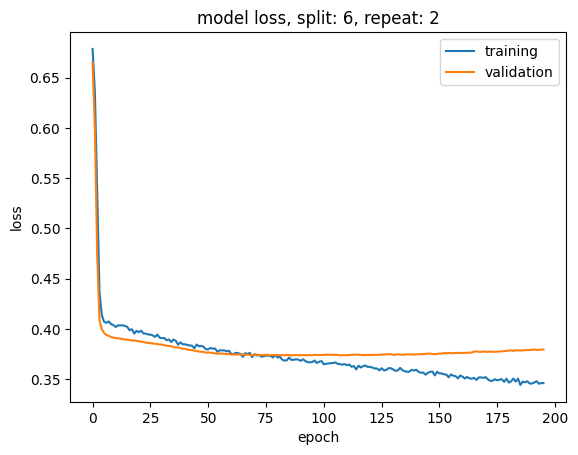

Split: 7, repeat: 2
Epochs before early stopping: 111


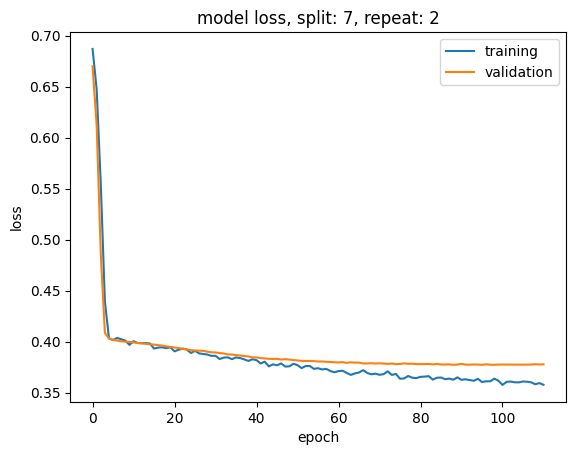

Split: 8, repeat: 2
Epochs before early stopping: 88


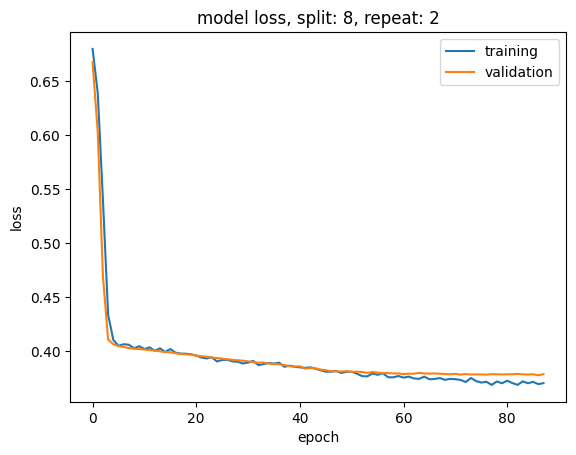

Split: 9, repeat: 2
Epochs before early stopping: 139


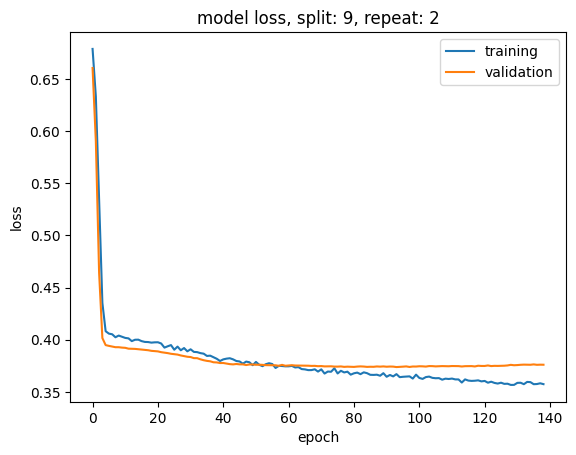

Split: 10, repeat: 3
Epochs before early stopping: 74


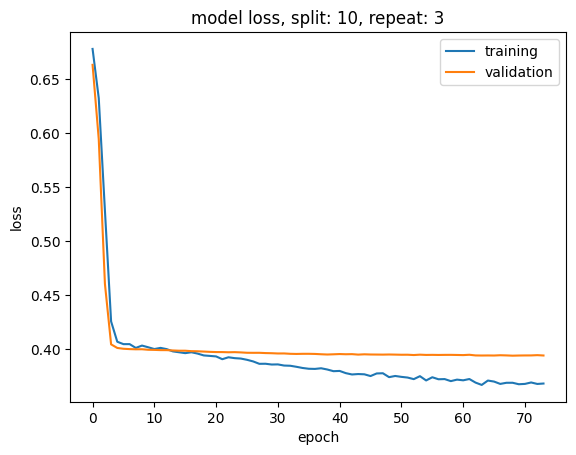

Split: 11, repeat: 3
Epochs before early stopping: 134


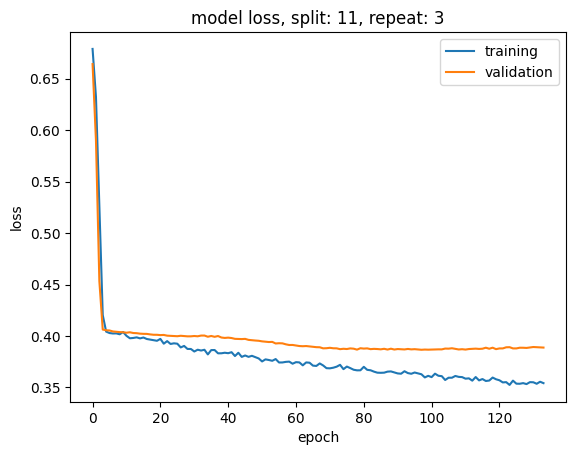

Split: 12, repeat: 3
Epochs before early stopping: 95


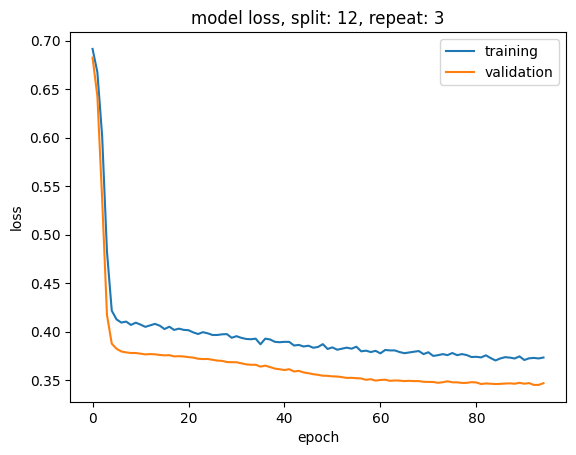

Split: 13, repeat: 3
Epochs before early stopping: 63


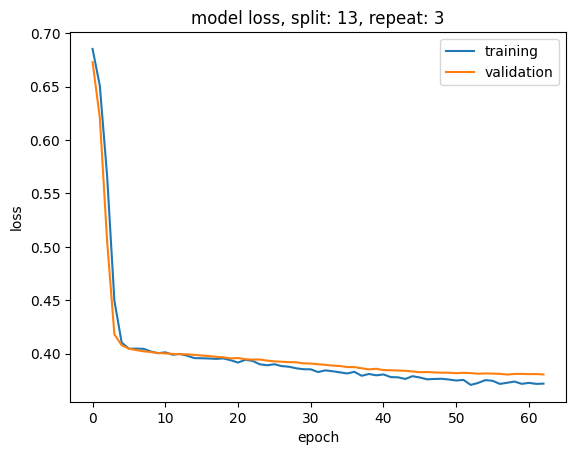

Split: 14, repeat: 3
Epochs before early stopping: 226


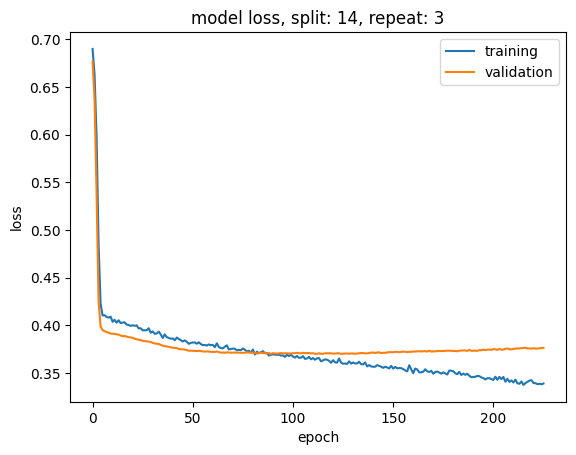

Accuracy: 0.1859(0.0285)
F1 score: 0.2665(0.0394)
Precision: 0.3793(0.0481)
Recall: 0.2309(0.0377)
AUC: 0.6332(0.0199)


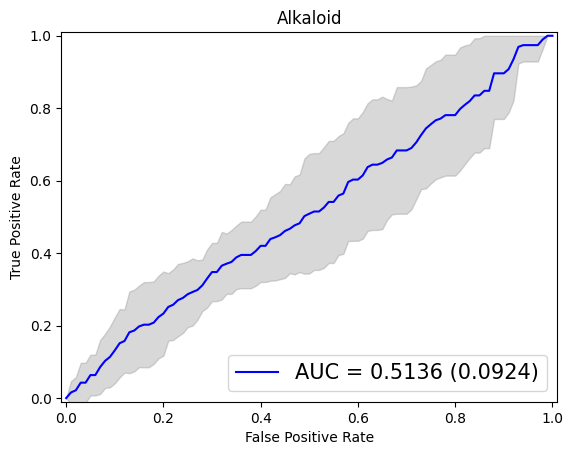

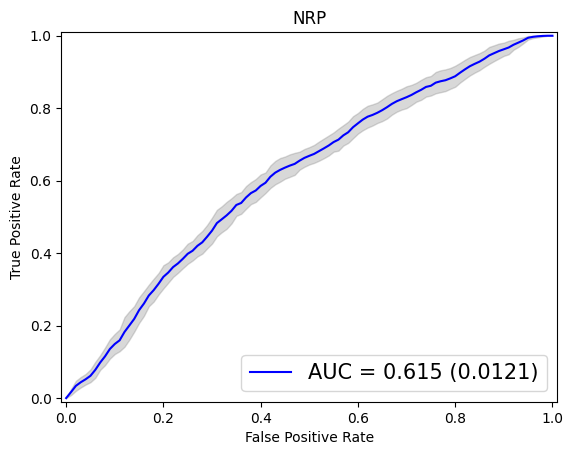

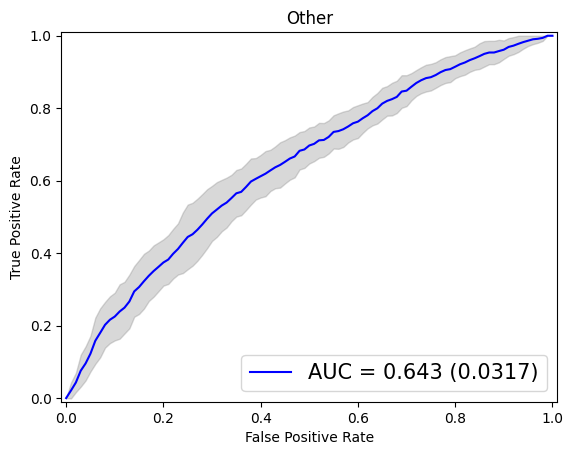

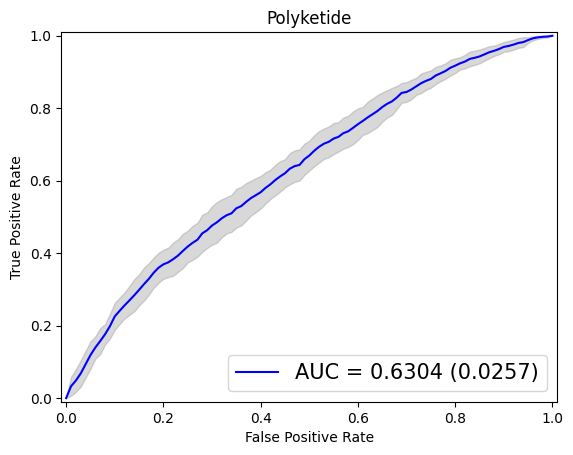

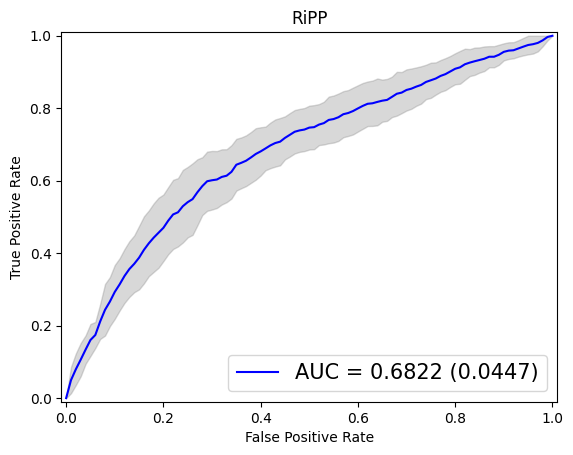

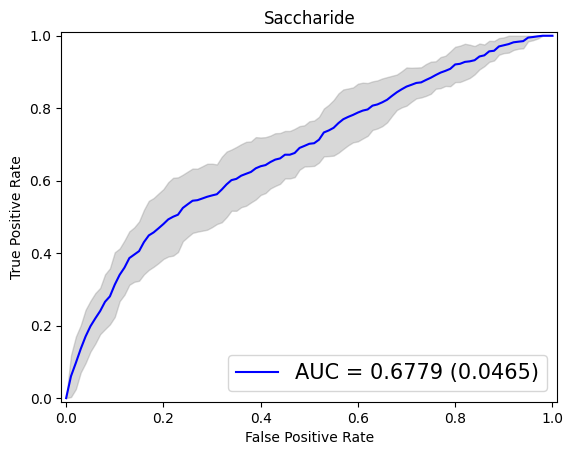

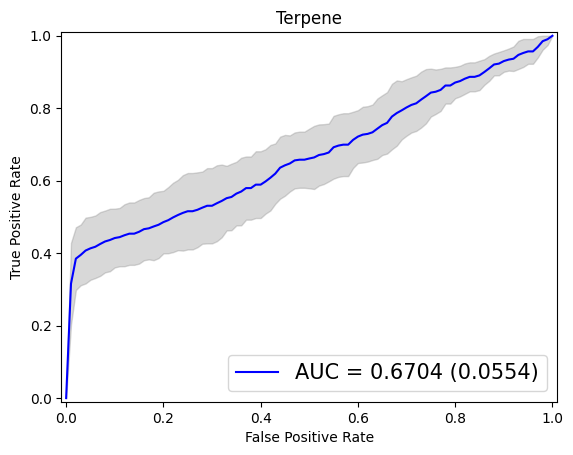

In [369]:
print('Model: NN4 (4 hidden layers, 100 nodes)')
print('Encoding: Pfam2Vec')
print('Epochs: 500')
scores_nn4_pfam, std_nn4_pfam = make_classification(X_pfam, Y, nn4(n_inputs_pfam, n_outputs), n_epochs=500, nn=True, mlp=True, model_name='nn4', encoding='pfam2vec')

While Pfam2Vec input shows reasonable training and validation loss per epoch (no signs of over or underfitting) the AUC is very bad :-(. Let's try less nodes per hidden layer:

In [357]:
def nn5(n_inputs, n_outputs):
    
    model = Sequential()
    model.add(Dense(50, input_dim=n_inputs, kernel_initializer='he_uniform', activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(50, activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(50, activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(n_outputs, activation='sigmoid'))
    
    return model

Model: NN5 (3 hidden layers, 50 nodes)
Encoding: Pfam2Vec
Epochs: 500
Learning rate: 0.00001
Split: 0, repeat: 1
Epochs before early stopping: 68


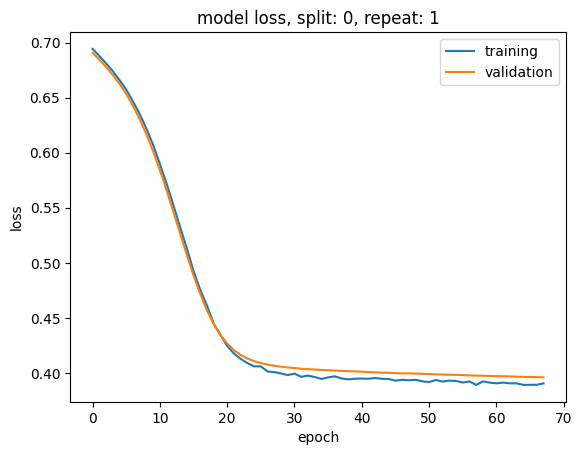

Split: 1, repeat: 1
Epochs before early stopping: 150


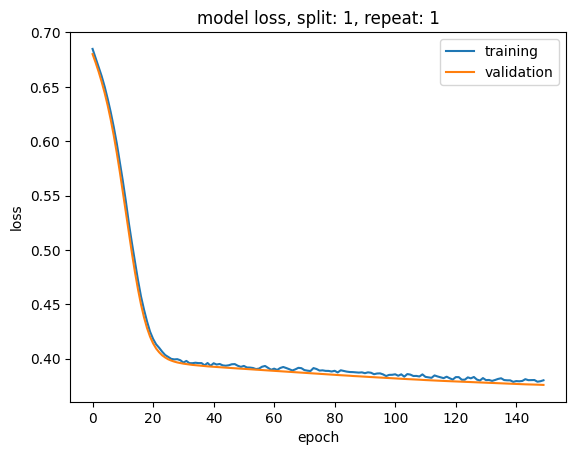

Split: 2, repeat: 1
Epochs before early stopping: 73


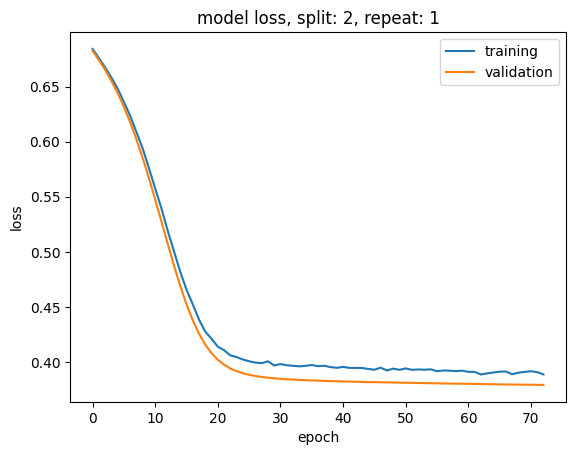

Split: 3, repeat: 1
Epochs before early stopping: 112


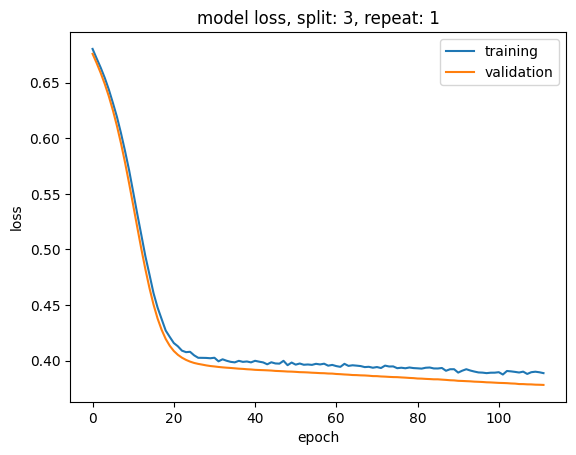

Split: 4, repeat: 1
Epochs before early stopping: 71


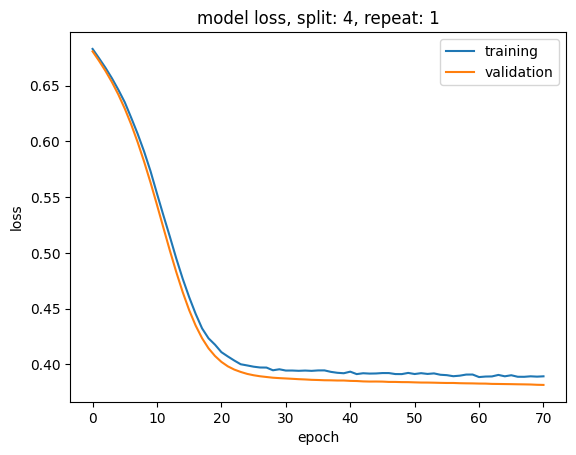

Split: 5, repeat: 2
Epochs before early stopping: 122


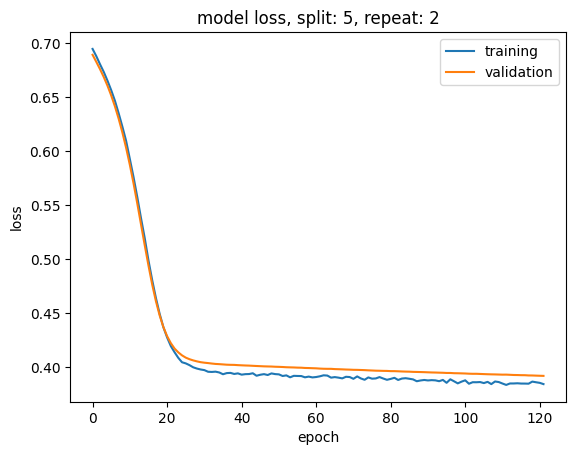

Split: 6, repeat: 2
Epochs before early stopping: 107


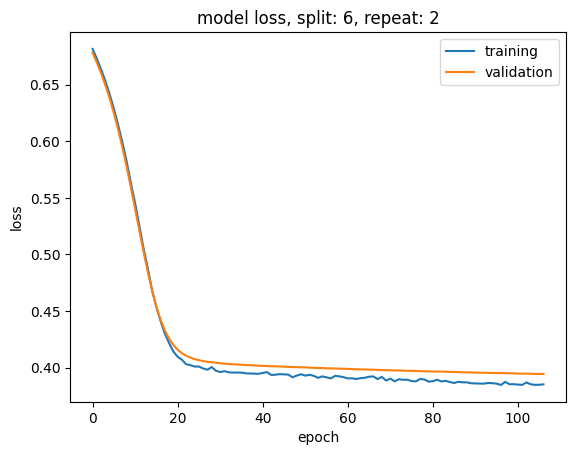

Split: 7, repeat: 2
Epochs before early stopping: 193


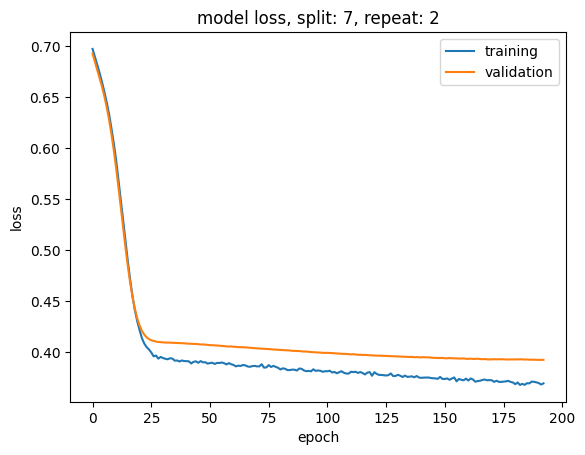

Split: 8, repeat: 2
Epochs before early stopping: 127


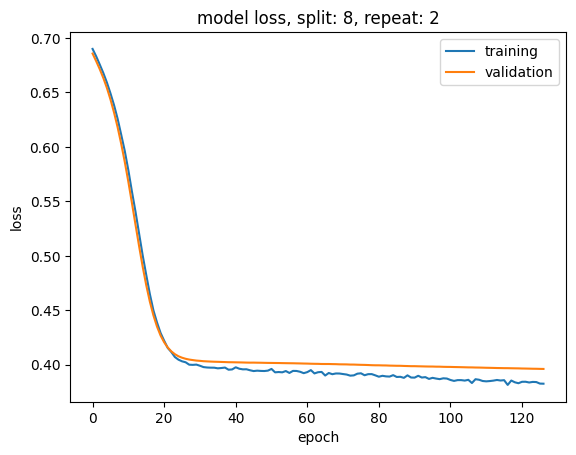

Split: 9, repeat: 2
Epochs before early stopping: 159


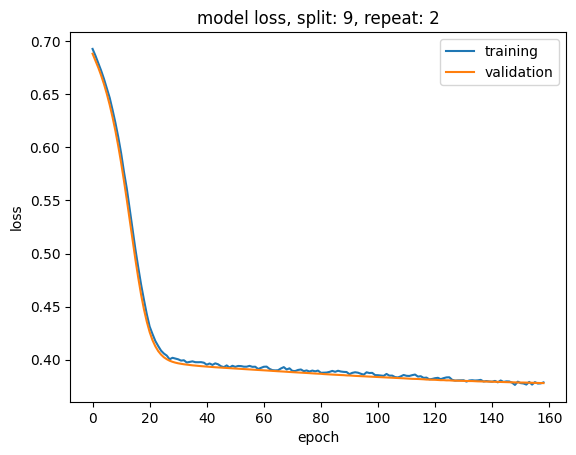

Split: 10, repeat: 3
Epochs before early stopping: 59


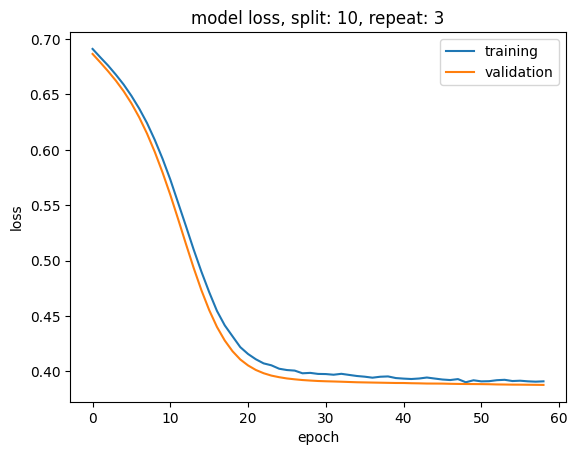

Split: 11, repeat: 3
Epochs before early stopping: 158


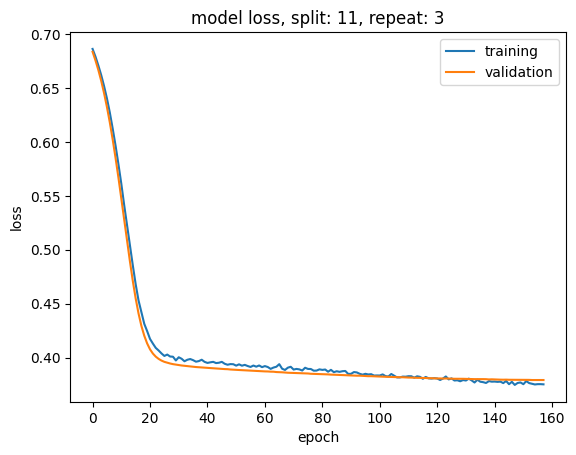

Split: 12, repeat: 3
Epochs before early stopping: 141


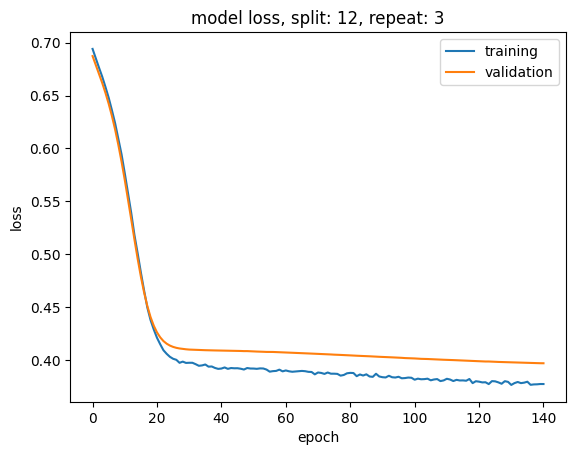

Split: 13, repeat: 3
Epochs before early stopping: 77


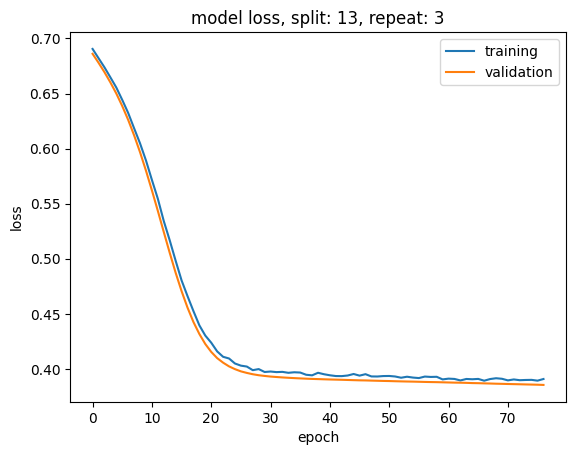

Split: 14, repeat: 3
Epochs before early stopping: 109


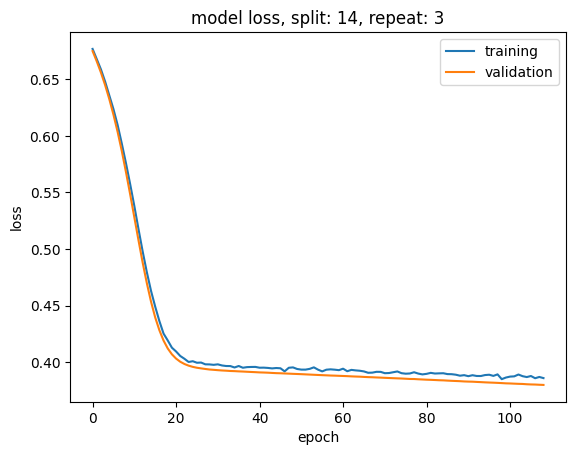

Accuracy: 0.0681(0.0365)
F1 score: 0.1167(0.0545)
Precision: 0.2019(0.0736)
Recall: 0.0931(0.0509)
AUC: 0.6139(0.0177)


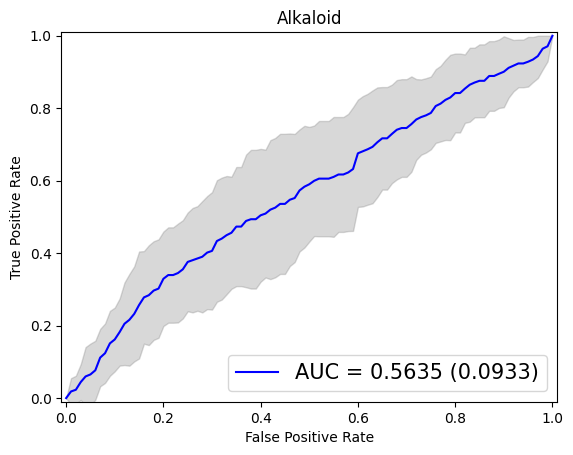

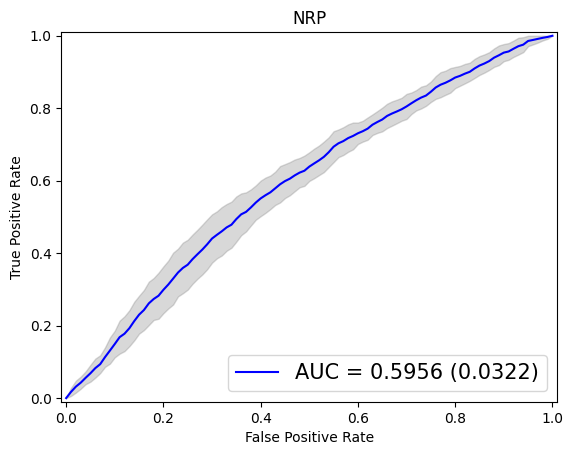

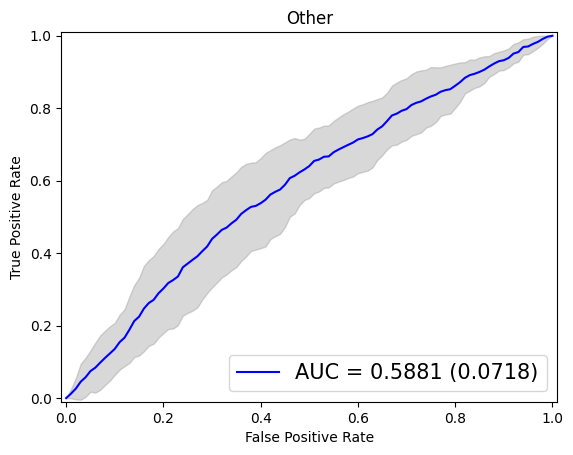

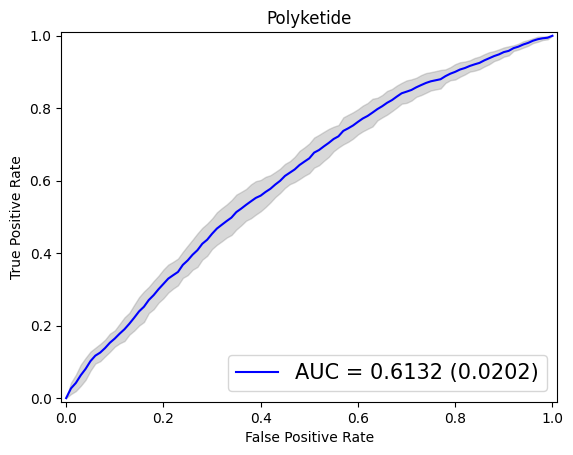

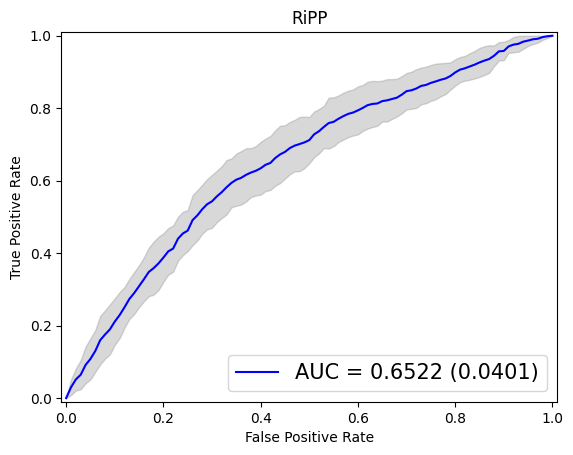

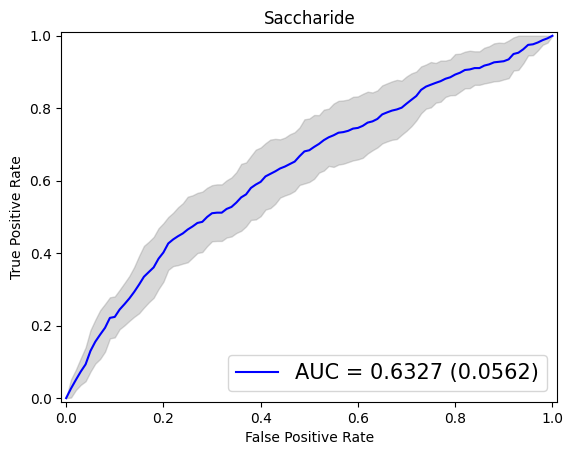

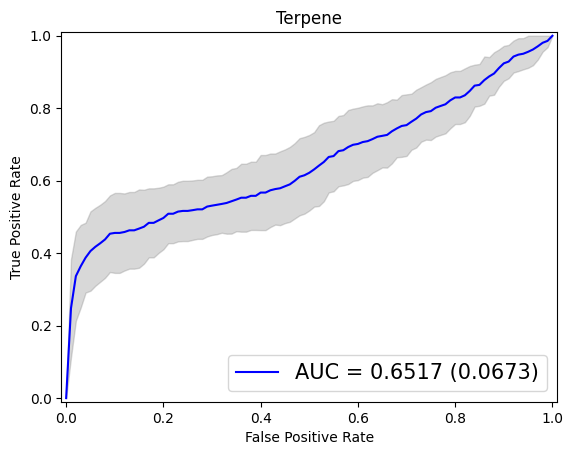

In [346]:
print('Model: NN5 (3 hidden layers, 50 nodes)')
print('Encoding: Pfam2Vec')
print('Epochs: 500')
print('Learning rate: 0.00001')
scores_nn5_pfam, std_nn5_pfam = make_classification(X_pfam, Y, nn5(n_inputs_pfam, n_outputs), n_epochs=500, learning_rate=0.00001, nn=True, mlp=True, model_name='nn5', encoding='pfam2vec')

In [358]:
def nn6(n_inputs, n_outputs):    
    model = Sequential()
    model.add(Dense(50, input_dim=n_inputs, kernel_initializer='he_uniform', activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(50, activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(n_outputs, activation='sigmoid'))
    
    return model

Model: NN6 (2 hidden layers, 50 nodes)
Encoding: Pfam2Vec
Epochs: 500
Split: 0, repeat: 1
Epochs before early stopping: 143


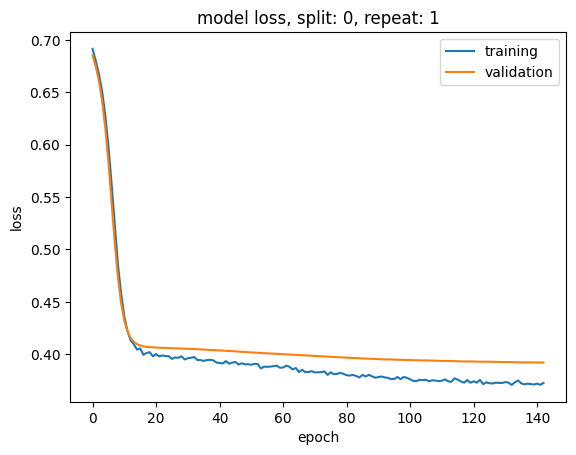

Split: 1, repeat: 1
Epochs before early stopping: 91


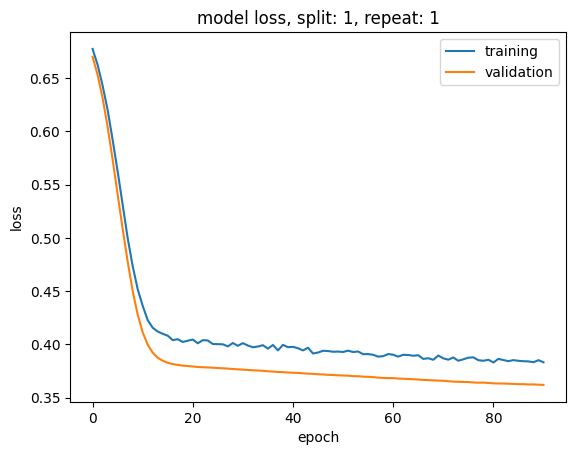

Split: 2, repeat: 1
Epochs before early stopping: 233


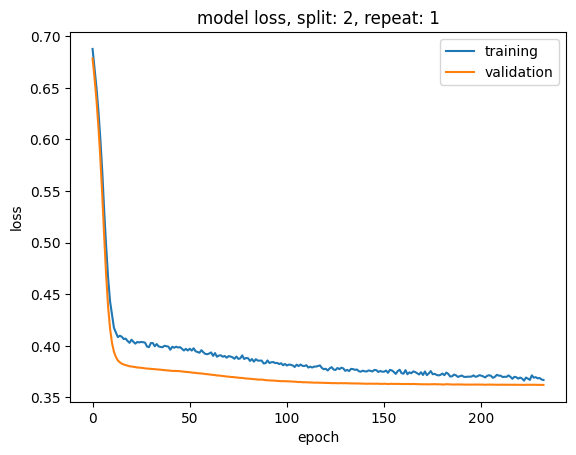

Split: 3, repeat: 1
Epochs before early stopping: 111


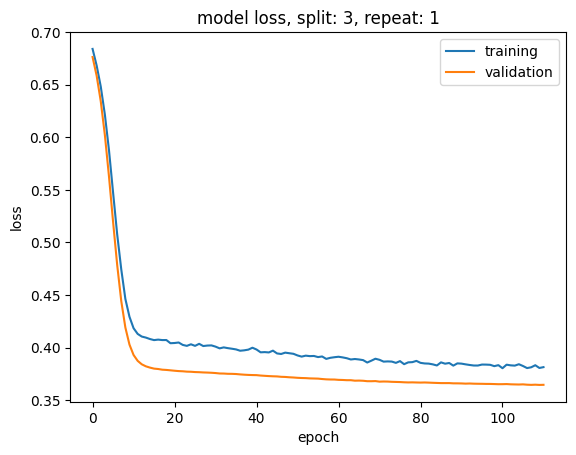

Split: 4, repeat: 1
Epochs before early stopping: 37


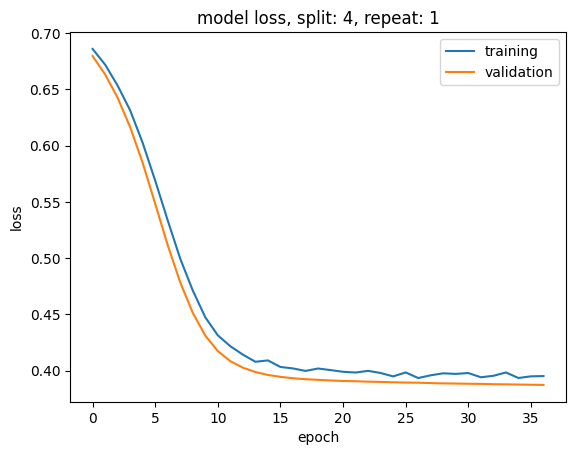

Split: 5, repeat: 2
Epochs before early stopping: 138


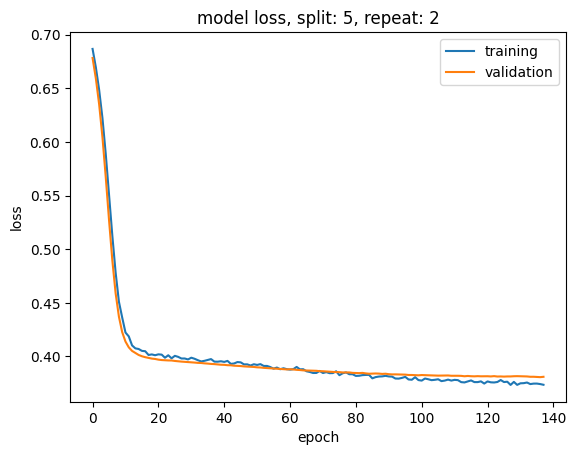

Split: 6, repeat: 2
Epochs before early stopping: 108


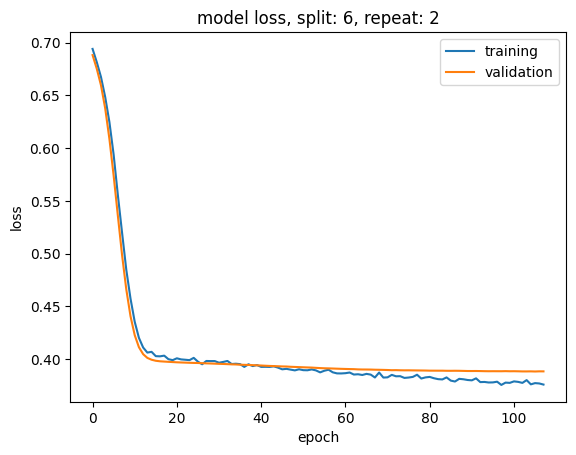

Split: 7, repeat: 2
Epochs before early stopping: 157


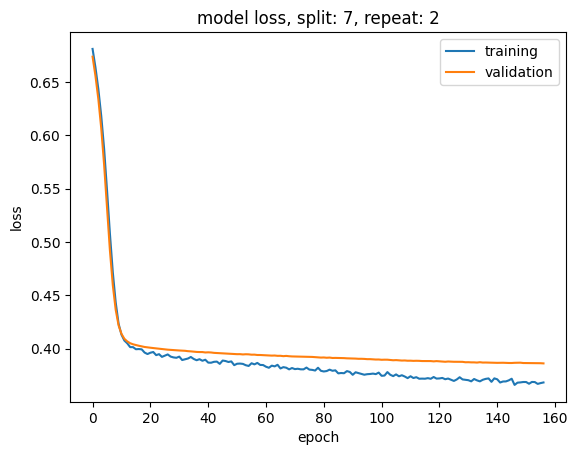

Split: 8, repeat: 2
Epochs before early stopping: 128


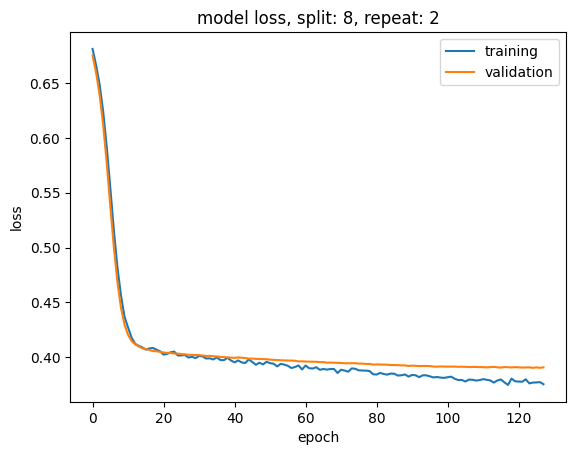

Split: 9, repeat: 2
Epochs before early stopping: 77


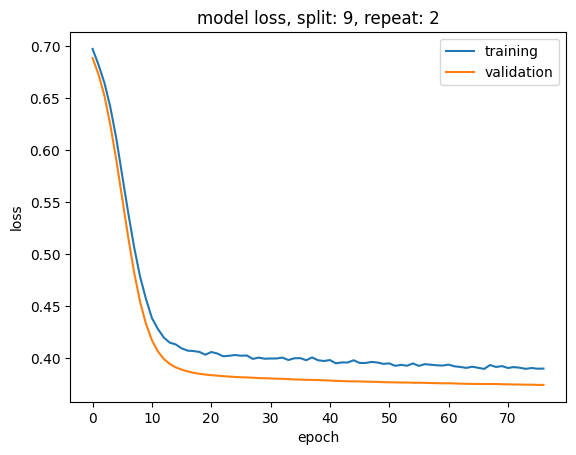

Split: 10, repeat: 3
Epochs before early stopping: 142


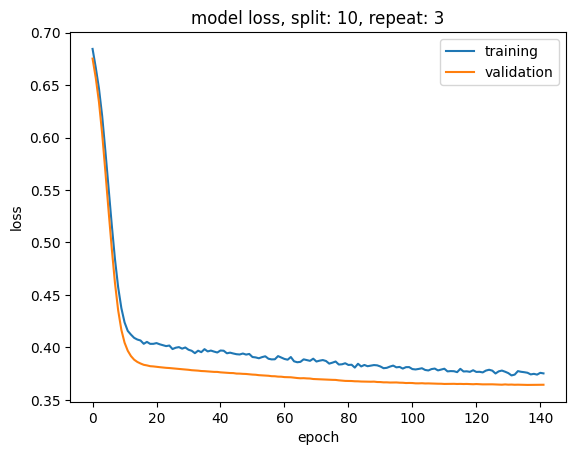

Split: 11, repeat: 3
Epochs before early stopping: 133


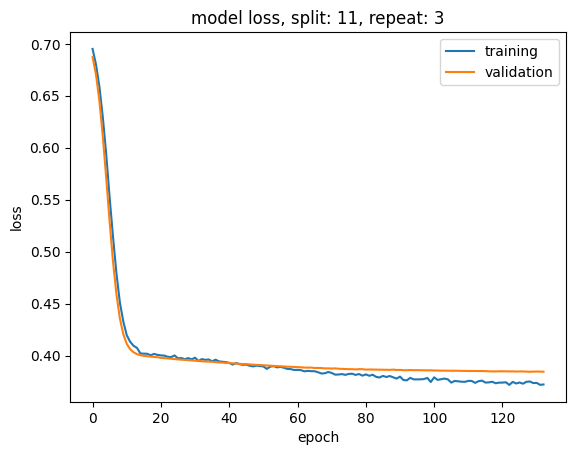

Split: 12, repeat: 3
Epochs before early stopping: 137


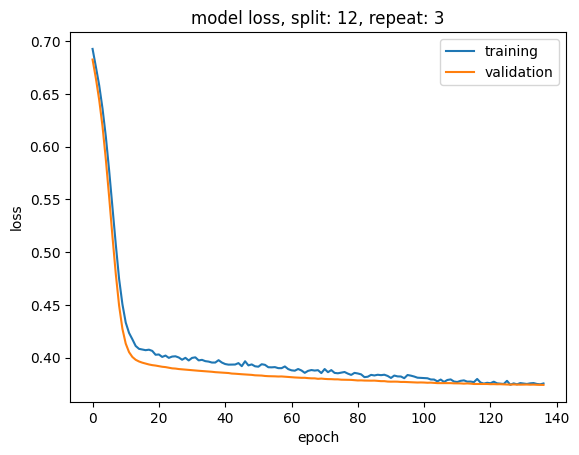

Split: 13, repeat: 3
Epochs before early stopping: 177


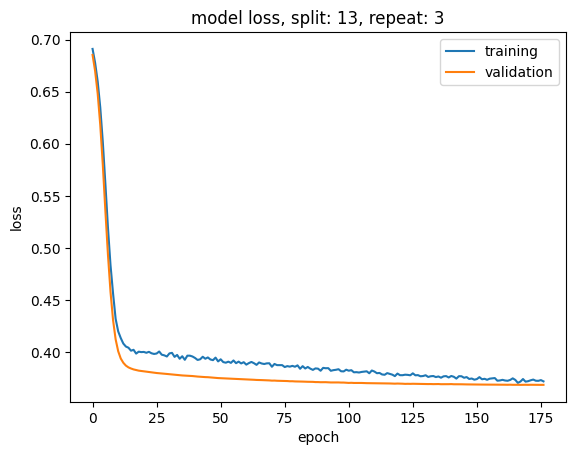

Split: 14, repeat: 3
Epochs before early stopping: 103


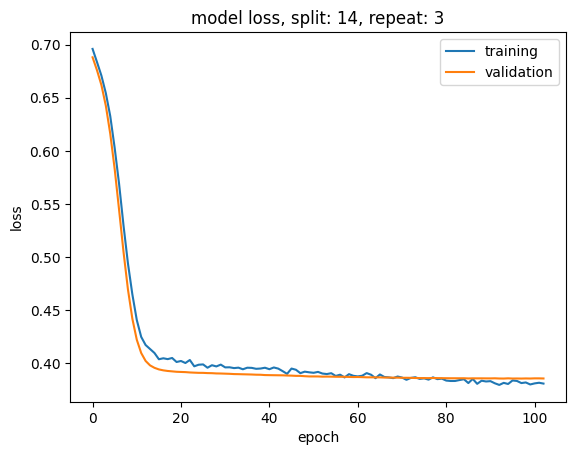

Accuracy: 0.0988(0.0364)
F1 score: 0.1609(0.0522)
Precision: 0.3284(0.0982)
Recall: 0.1277(0.045)
AUC: 0.6318(0.0176)


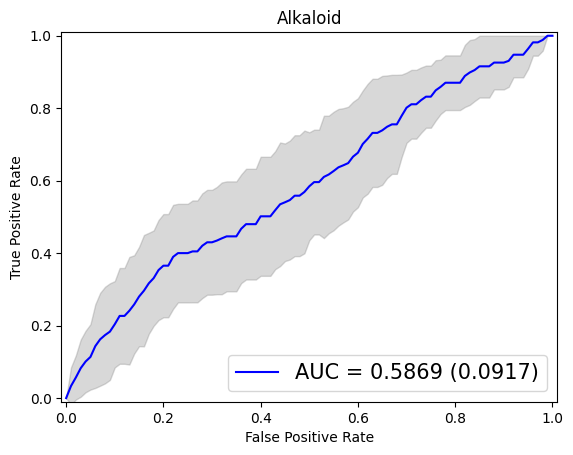

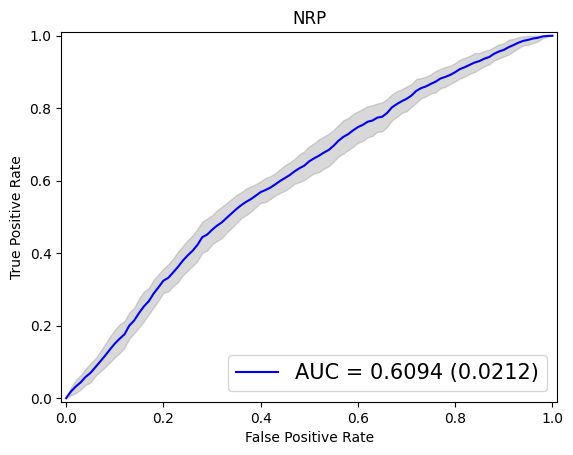

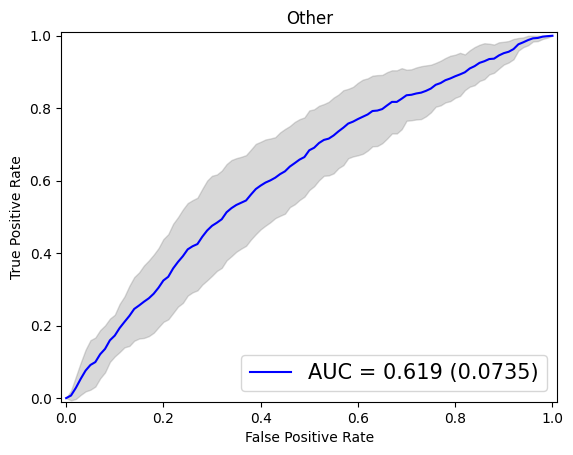

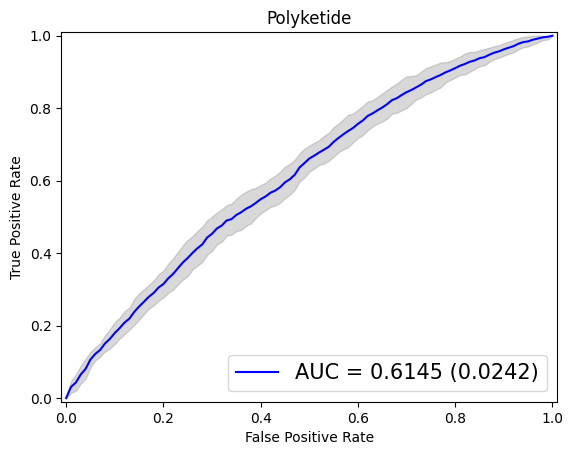

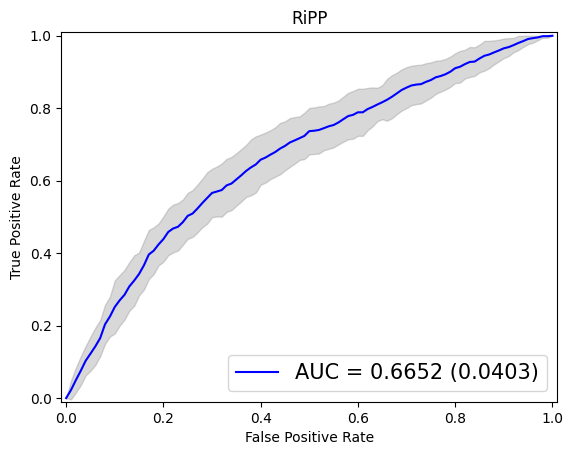

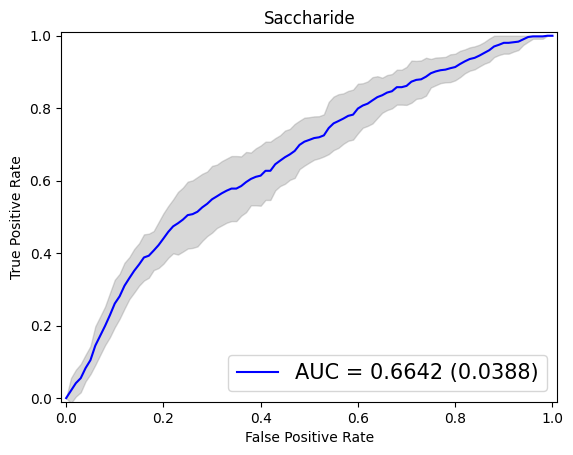

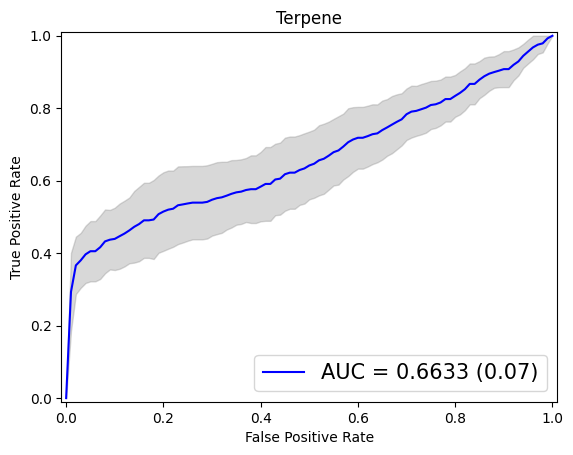

In [359]:
print('Model: NN6 (2 hidden layers, 50 nodes)')
print('Encoding: Pfam2Vec')
print('Epochs: 500')

scores_nn6_pfam, std_nn6_pfam = make_classification(X_pfam, Y, nn6(n_inputs_pfam, n_outputs), n_epochs=500, nn=True, mlp=True, model_name='nn6', encoding='pfam2vec')

In [360]:
def nn7(n_inputs, n_outputs):
    
    model = Sequential()
    model.add(Dense(50, input_dim=n_inputs, kernel_initializer='he_uniform', activation='relu'))
    model.add(Dropout(0.2))
    
    model.add(Dense(n_outputs, activation='sigmoid'))
    model.compile(loss='binary_crossentropy', optimizer='adam')
    
    return model

Model: NN7 (1 hidden layer, 50 nodes)
Encoding: Pfam2Vec
Epochs: 500
Split: 0, repeat: 1
Epochs before early stopping: 115


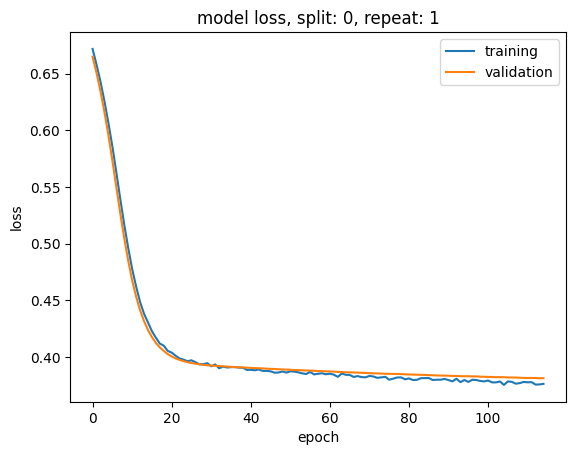

Split: 1, repeat: 1
Epochs before early stopping: 97


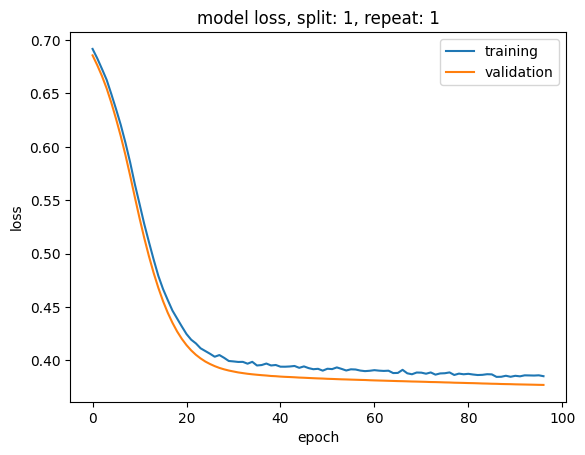

Split: 2, repeat: 1
Epochs before early stopping: 79


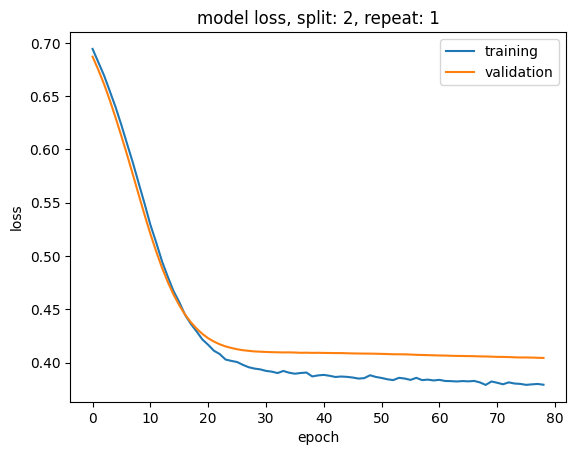

Split: 3, repeat: 1
Epochs before early stopping: 151


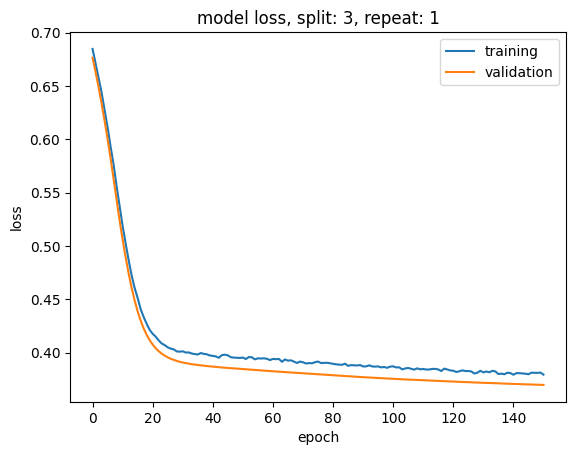

Split: 4, repeat: 1
Epochs before early stopping: 112


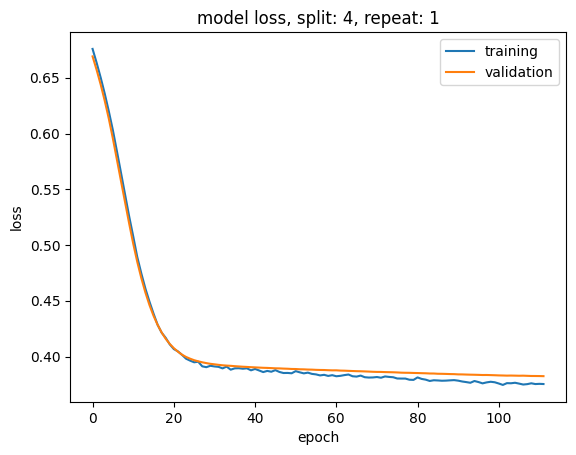

Split: 5, repeat: 2
Epochs before early stopping: 125


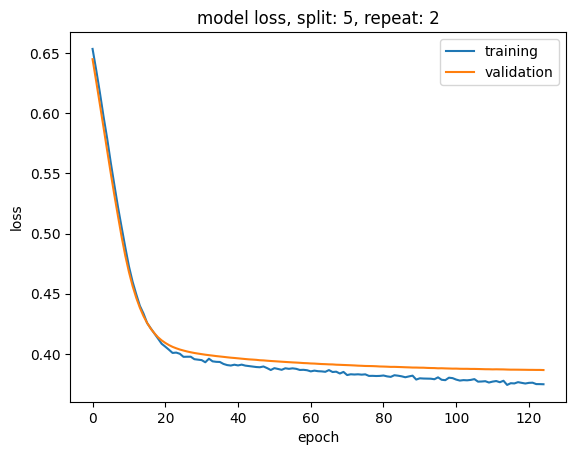

Split: 6, repeat: 2
Epochs before early stopping: 140


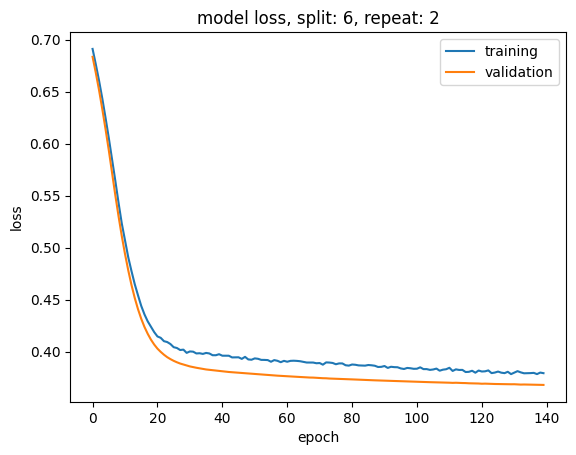

Split: 7, repeat: 2
Epochs before early stopping: 166


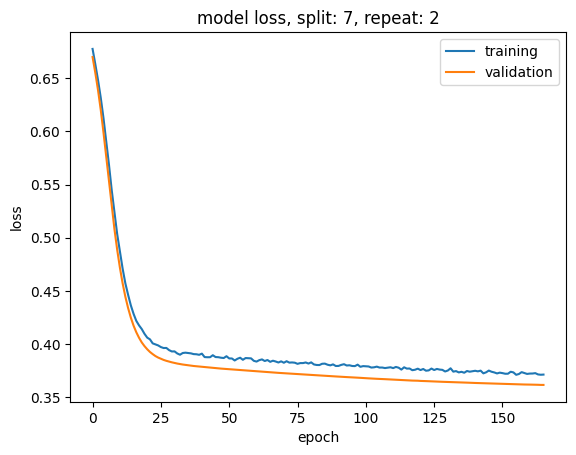

Split: 8, repeat: 2
Epochs before early stopping: 187


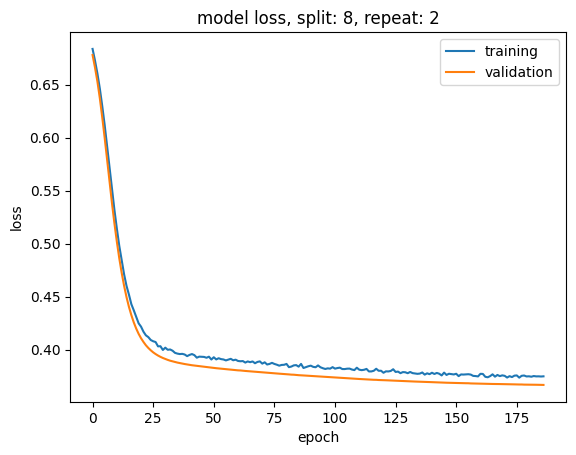

Split: 9, repeat: 2
Epochs before early stopping: 124


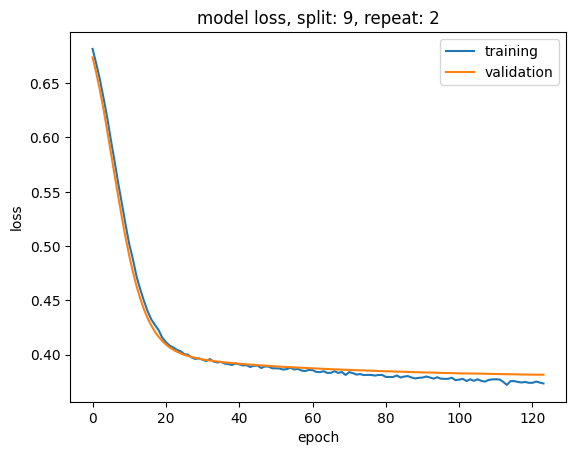

Split: 10, repeat: 3
Epochs before early stopping: 81


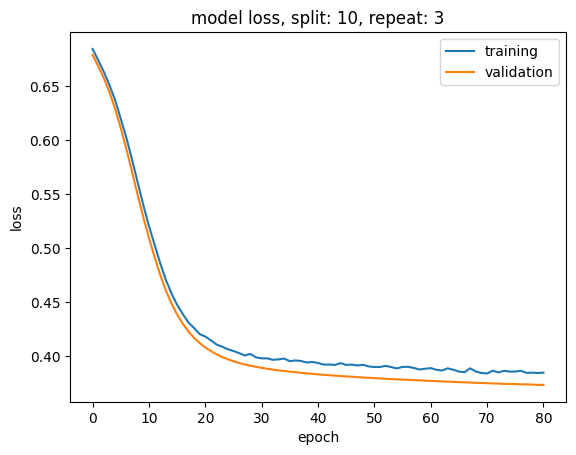

Split: 11, repeat: 3
Epochs before early stopping: 131


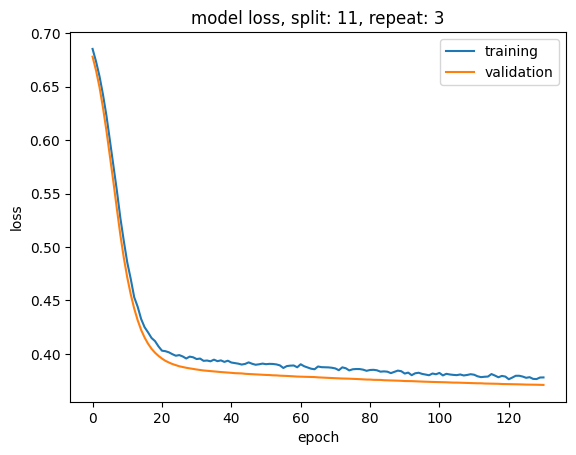

Split: 12, repeat: 3
Epochs before early stopping: 171


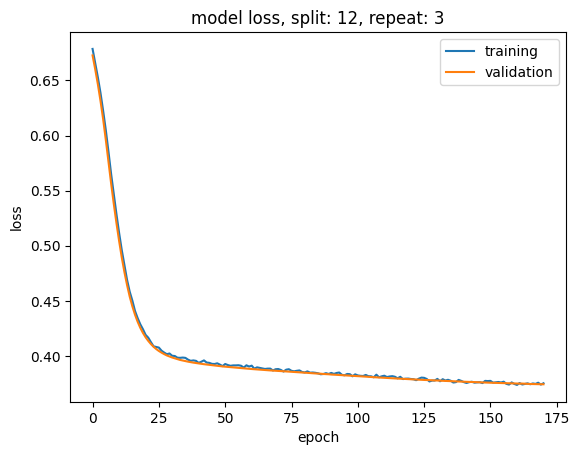

Split: 13, repeat: 3
Epochs before early stopping: 123


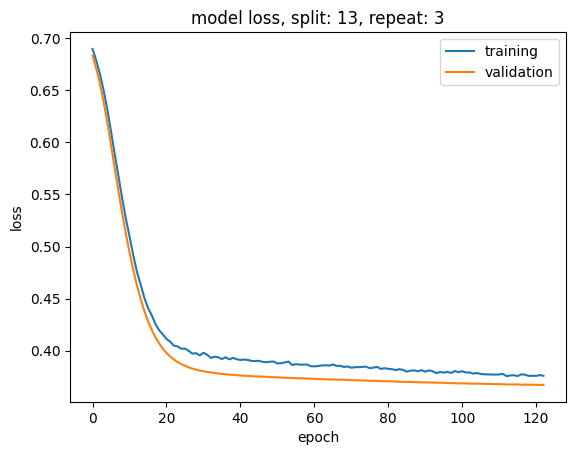

Split: 14, repeat: 3
Epochs before early stopping: 228


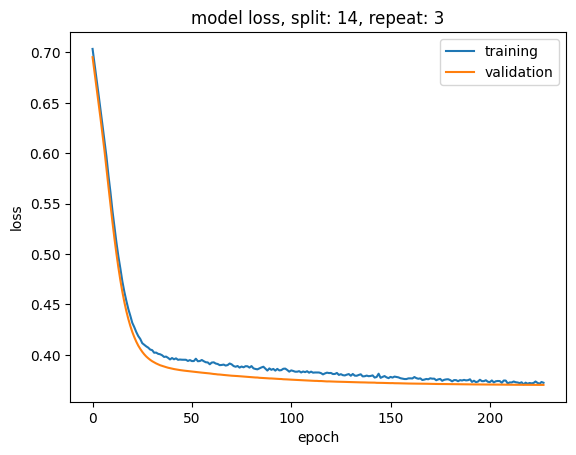

Accuracy: 0.0699(0.0203)
F1 score: 0.1293(0.031)
Precision: 0.2802(0.0767)
Recall: 0.0947(0.0279)
AUC: 0.6315(0.0163)


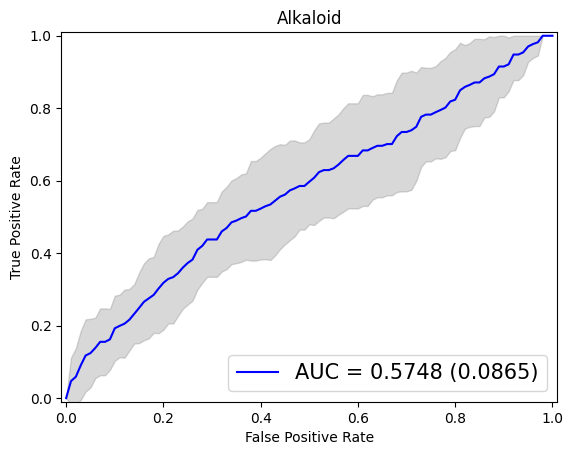

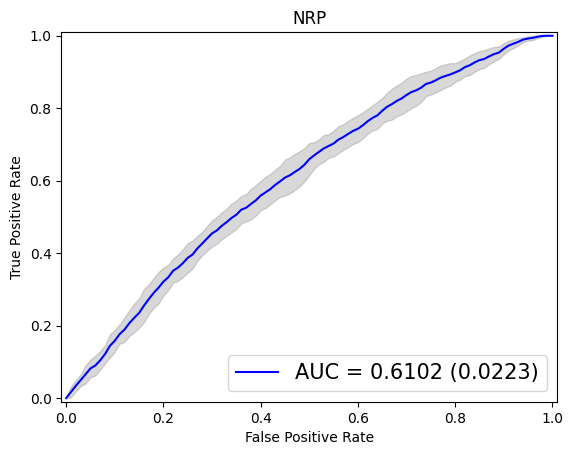

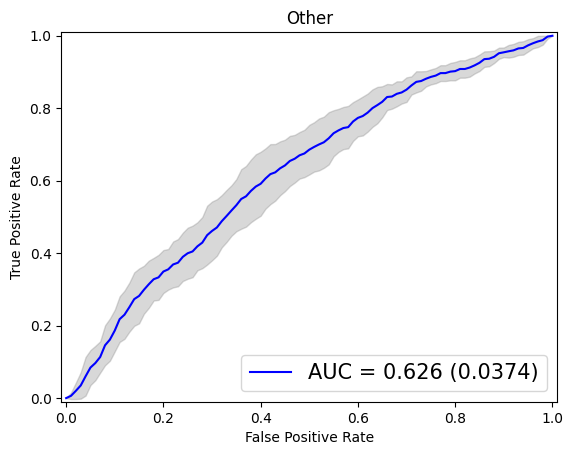

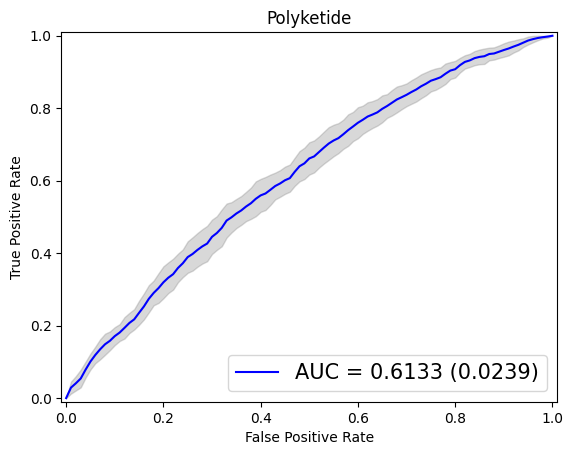

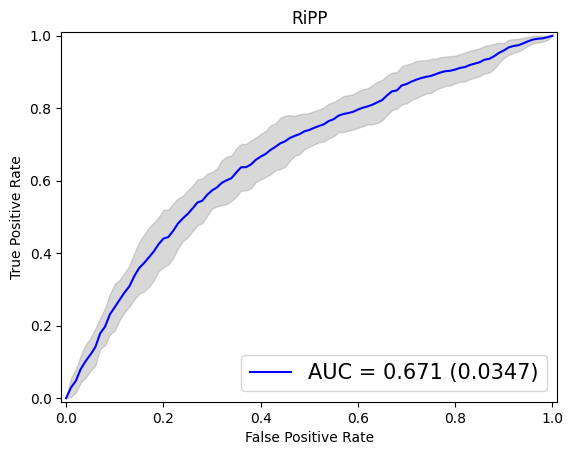

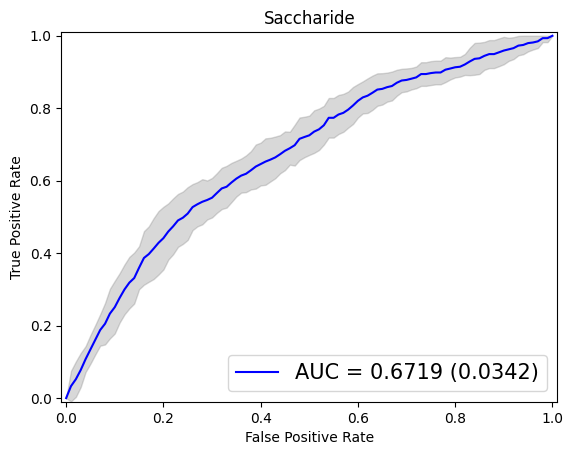

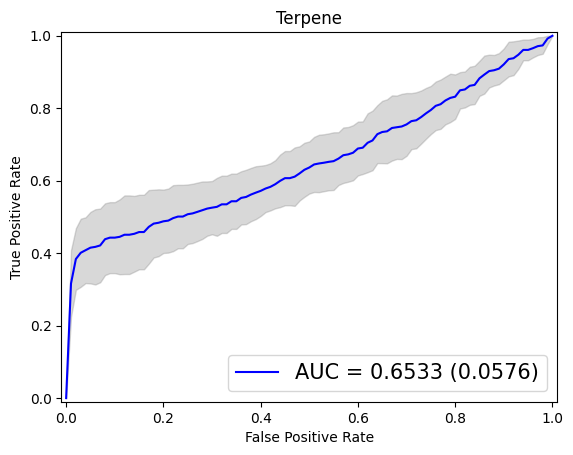

In [361]:
print('Model: NN7 (1 hidden layer, 50 nodes)')
print('Encoding: Pfam2Vec')
print('Epochs: 500')

scores_nn7_pfam, std_nn7_pfam = make_classification(X_pfam, Y, nn7(n_inputs_pfam, n_outputs), n_epochs=500, nn=True, mlp=True, model_name='nn7', encoding='pfam2vec')

Halving number of nodes per layer didn't really help unfortunately... now it's time to revisit One-Hot Encoding to see if we still there is still the overfitting issue at hand.

Model: NN7 (1 hidden layer, 50 nodes)
Encoding: One-Hot Encoding
Epochs: 500
Learning rate: 0.00001
Split: 0, repeat: 1
Epochs before early stopping: 500


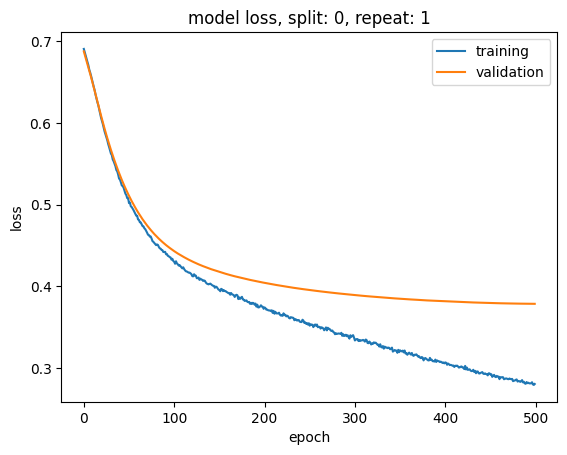

Split: 1, repeat: 1
Epochs before early stopping: 500


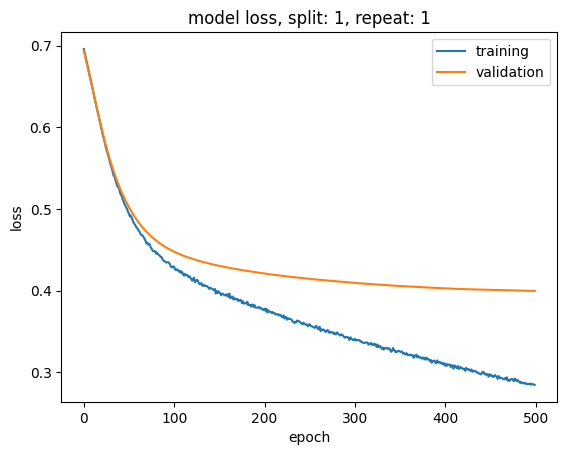

Split: 2, repeat: 1
Epochs before early stopping: 432


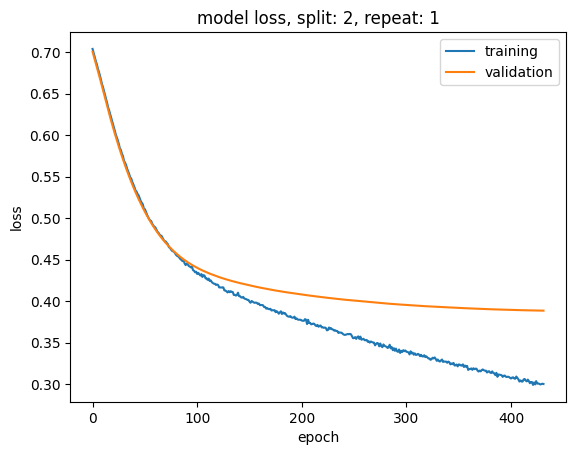

Split: 3, repeat: 1
Epochs before early stopping: 379


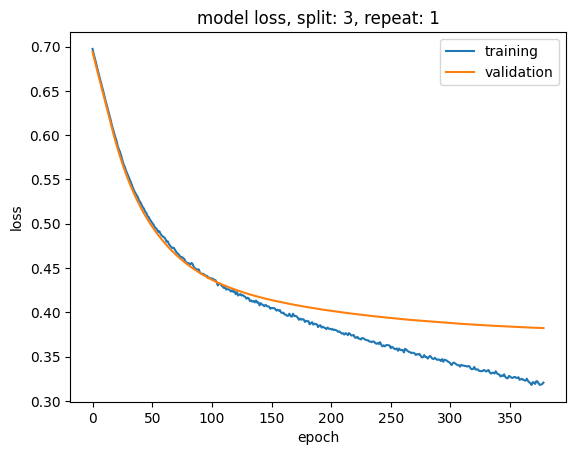

Split: 4, repeat: 1
Epochs before early stopping: 500


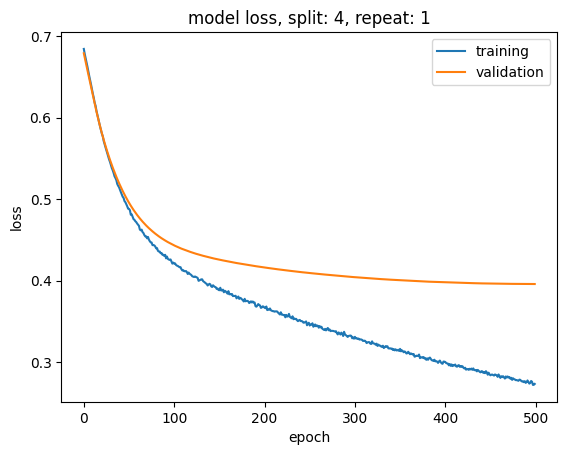

Split: 5, repeat: 2
Epochs before early stopping: 488


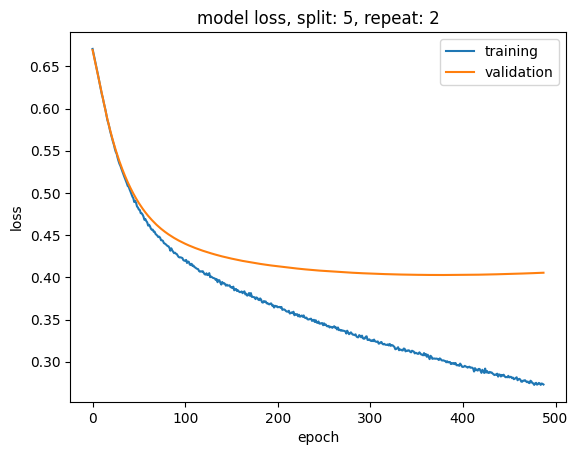

Split: 6, repeat: 2
Epochs before early stopping: 500


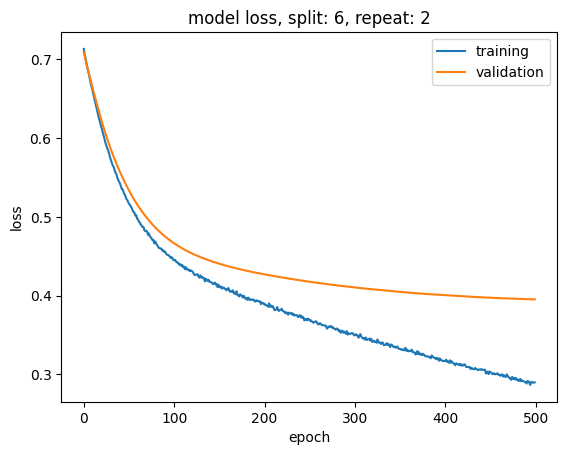

Split: 7, repeat: 2
Epochs before early stopping: 500


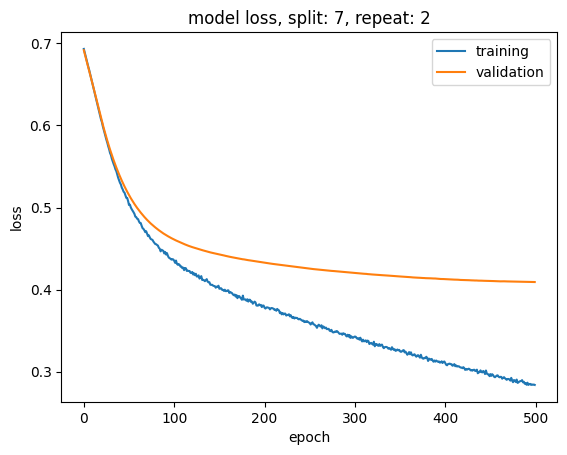

Split: 8, repeat: 2
Epochs before early stopping: 471


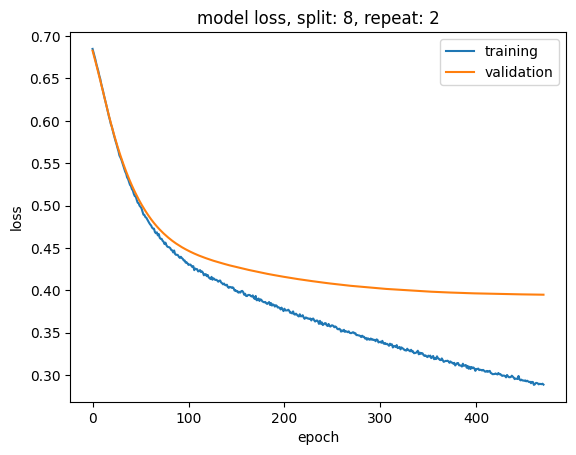

Split: 9, repeat: 2
Epochs before early stopping: 500


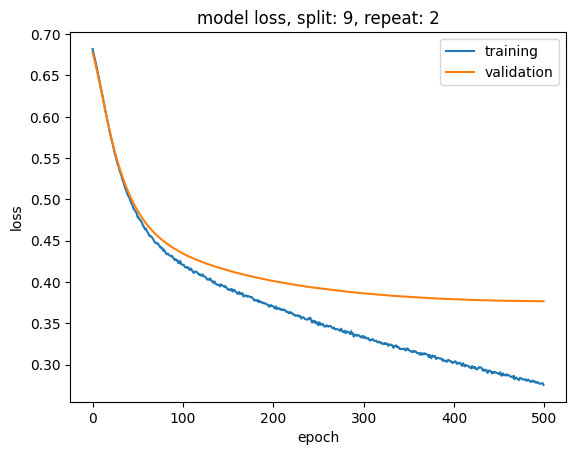

Split: 10, repeat: 3
Epochs before early stopping: 500


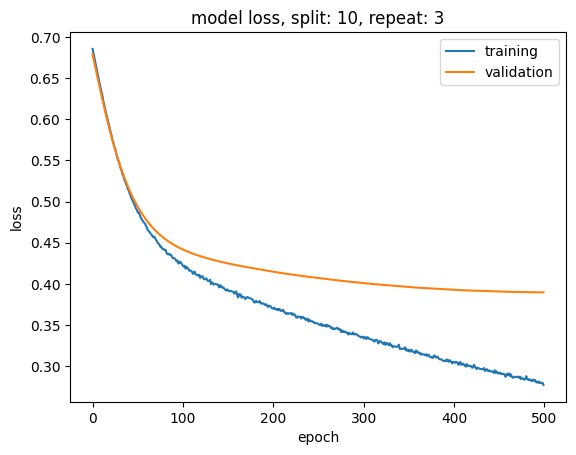

Split: 11, repeat: 3
Epochs before early stopping: 498


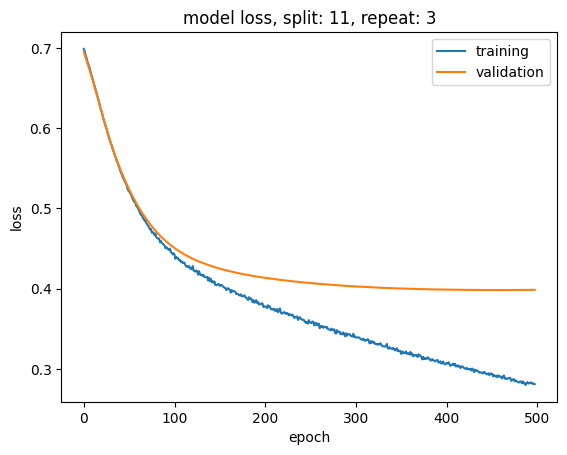

Split: 12, repeat: 3
Epochs before early stopping: 500


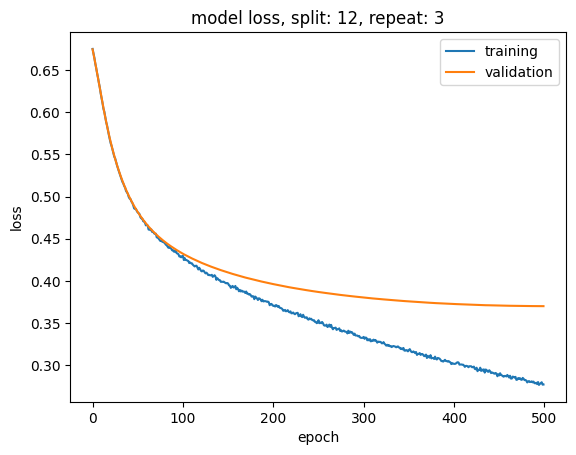

Split: 13, repeat: 3
Epochs before early stopping: 385


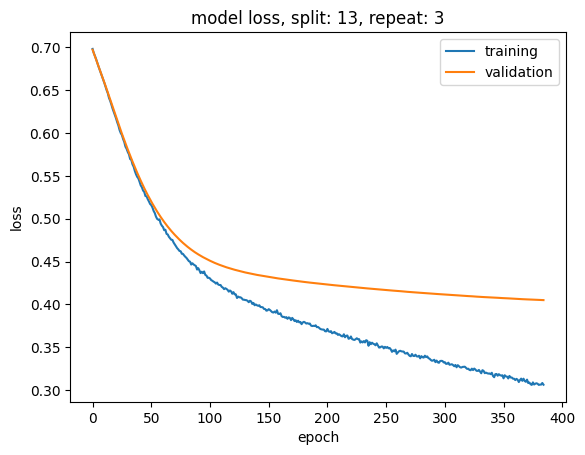

Split: 14, repeat: 3
Epochs before early stopping: 500


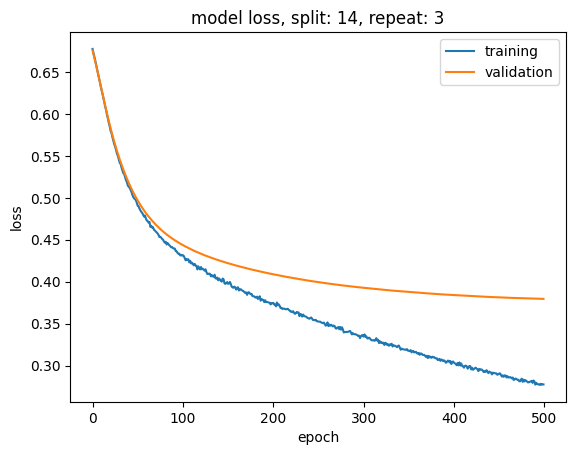

Accuracy: 0.165(0.0154)
F1 score: 0.2648(0.0186)
Precision: 0.4869(0.0521)
Recall: 0.2094(0.018)
AUC: 0.6365(0.0135)


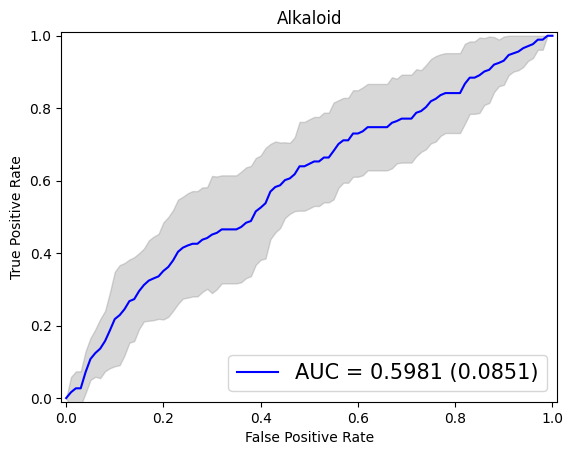

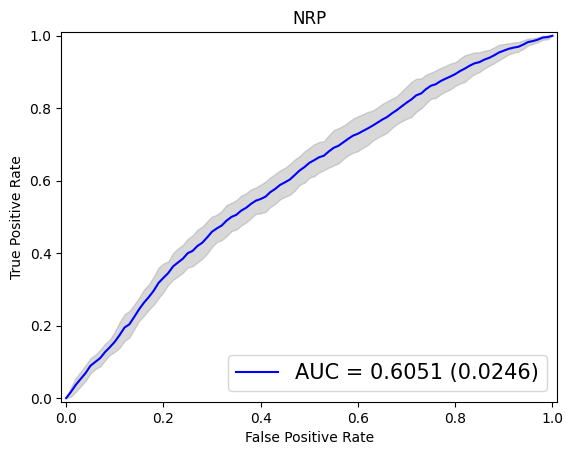

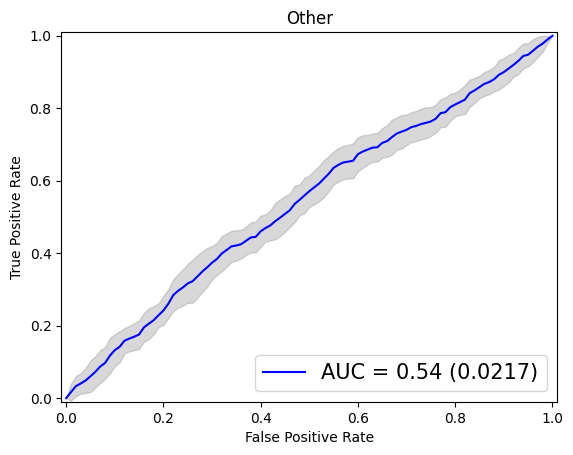

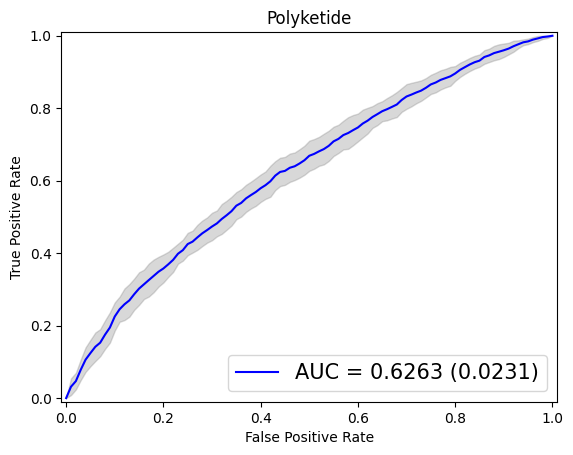

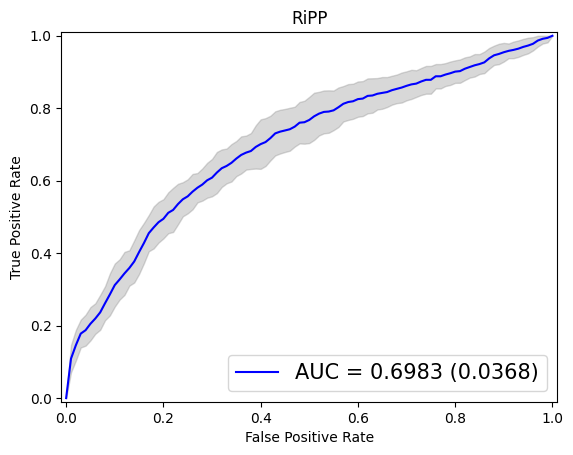

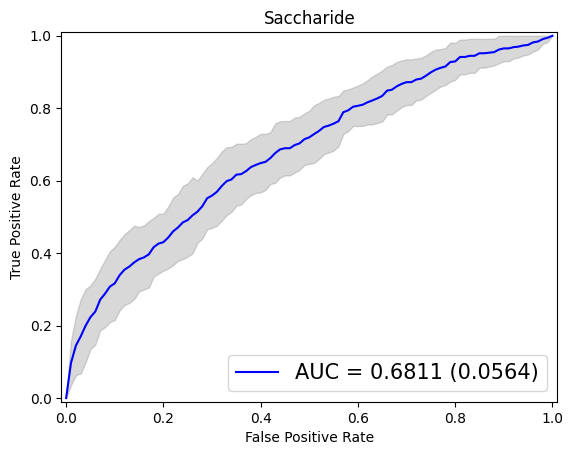

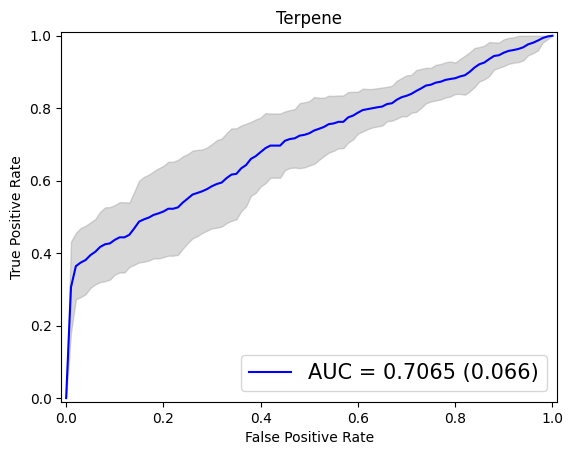

In [370]:
print('Model: NN7 (1 hidden layer, 50 nodes)')
print('Encoding: One-Hot Encoding')
print('Epochs: 500')
print('Learning rate: 0.00001')

scores_nn7_one_hot, std_nn7_one_hot = make_classification(X_one_hot, Y, nn7(n_inputs_one_hot, n_outputs), n_epochs=500, learning_rate=0.00001, nn=True, mlp=True, model_name='nn7', encoding='one_hot')

Doesn't look very good either. Before giving up completely, I want to try one last architecture:

In [366]:
def nn8(n_inputs, n_outputs):
    
    model = Sequential()
    model.add(Dense(10, input_dim=n_inputs, kernel_initializer='he_uniform', activation='relu'))
    model.add(Dropout(0.2))
    
    model.add(Dense(n_outputs, activation='sigmoid'))
    model.compile(loss='binary_crossentropy', optimizer='adam')
    
    return model

Model: NN8 (1 hidden layer, 10 nodes)
Encoding: One-Hot Encoding
Epochs: 500
Split: 0, repeat: 1
Epochs before early stopping: 273


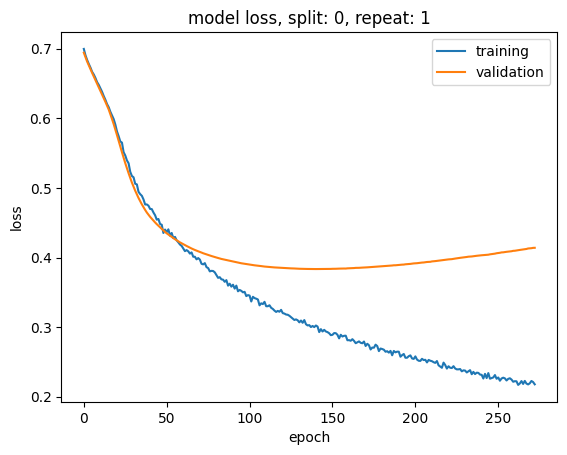

Split: 1, repeat: 1
Epochs before early stopping: 333


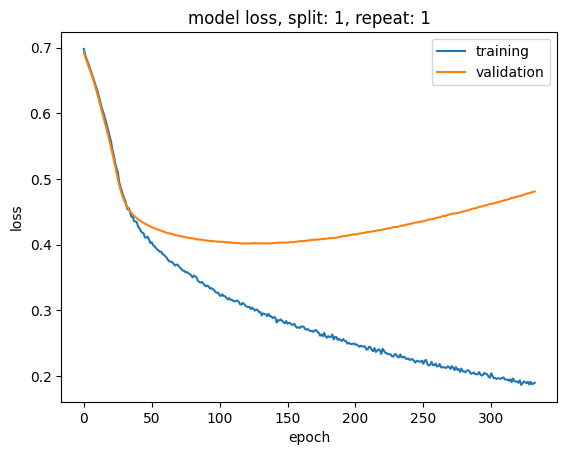

Split: 2, repeat: 1
Epochs before early stopping: 297


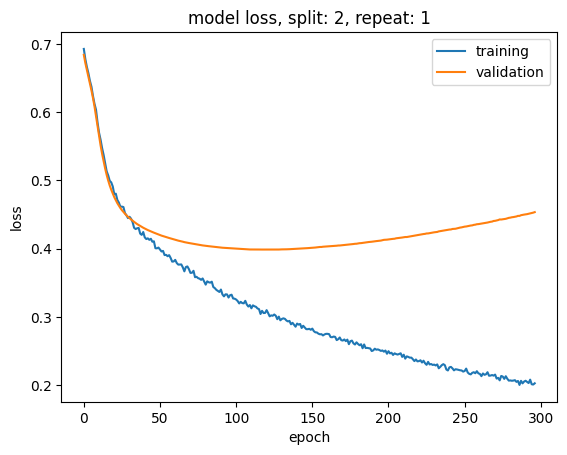

Split: 3, repeat: 1
Epochs before early stopping: 380


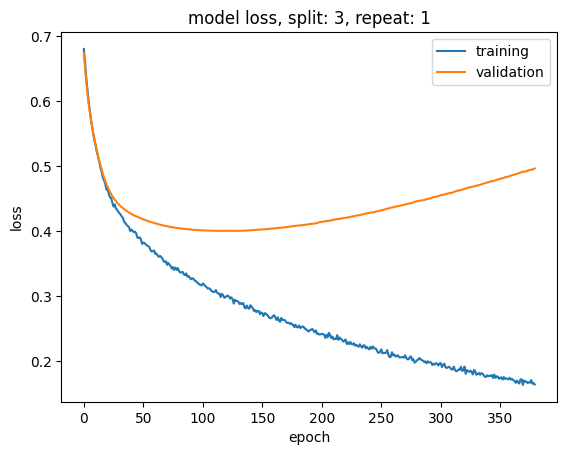

Split: 4, repeat: 1
Epochs before early stopping: 418


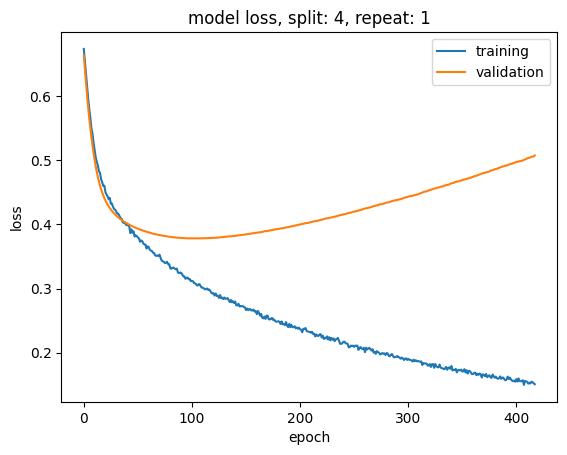

Split: 5, repeat: 2
Epochs before early stopping: 361


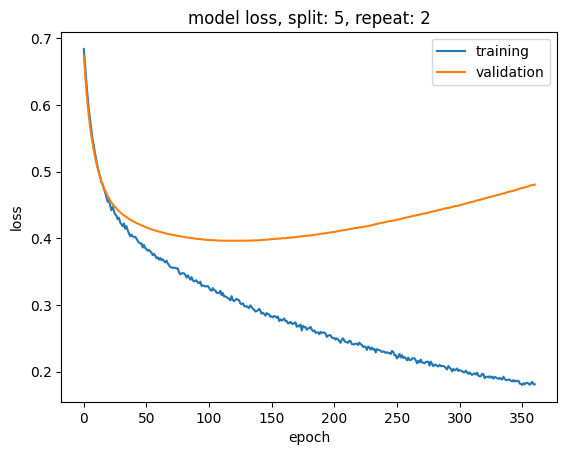

Split: 6, repeat: 2
Epochs before early stopping: 321


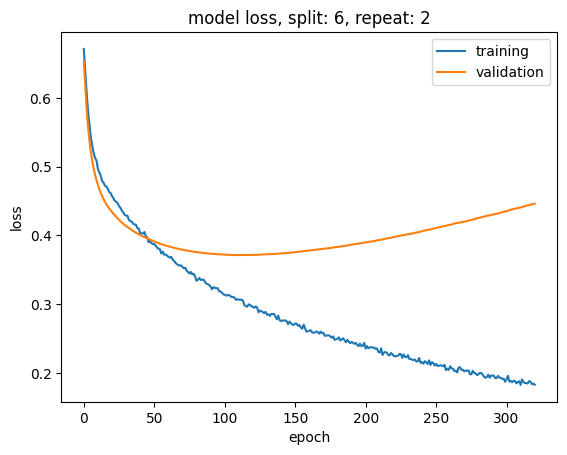

Split: 7, repeat: 2
Epochs before early stopping: 328


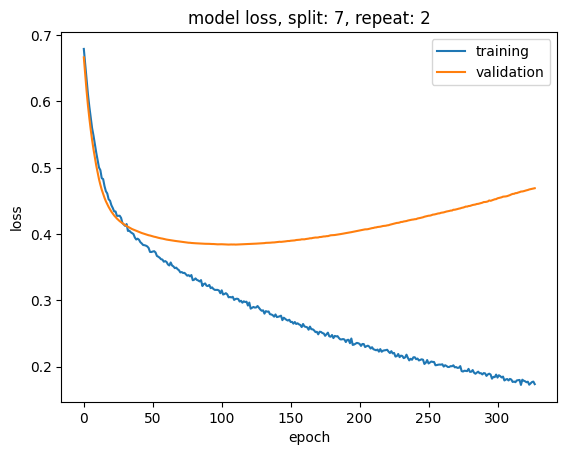

Split: 8, repeat: 2
Epochs before early stopping: 303


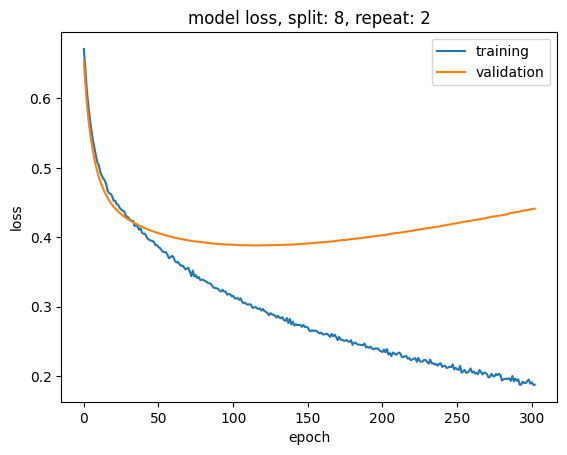

Split: 9, repeat: 2
Epochs before early stopping: 314


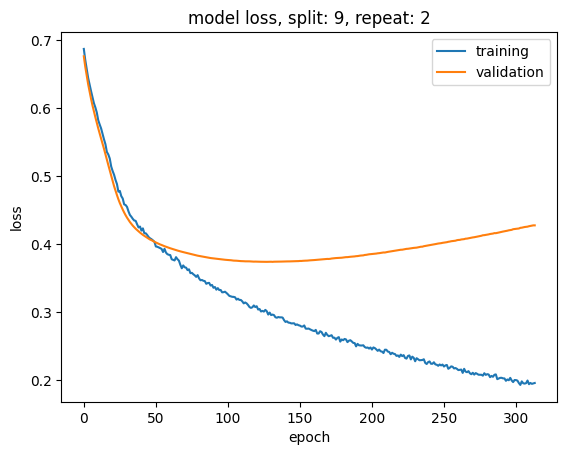

Split: 10, repeat: 3
Epochs before early stopping: 377


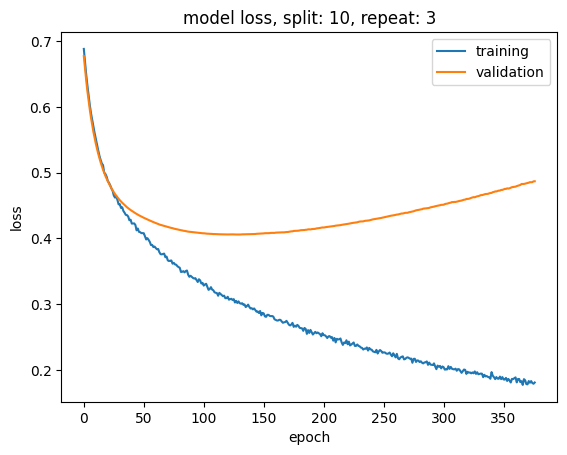

Split: 11, repeat: 3
Epochs before early stopping: 253


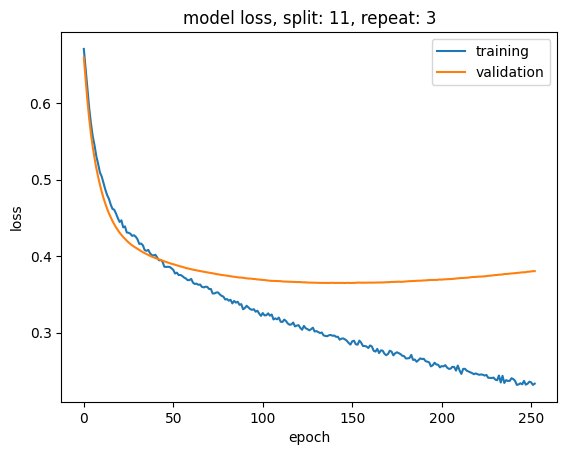

Split: 12, repeat: 3
Epochs before early stopping: 334


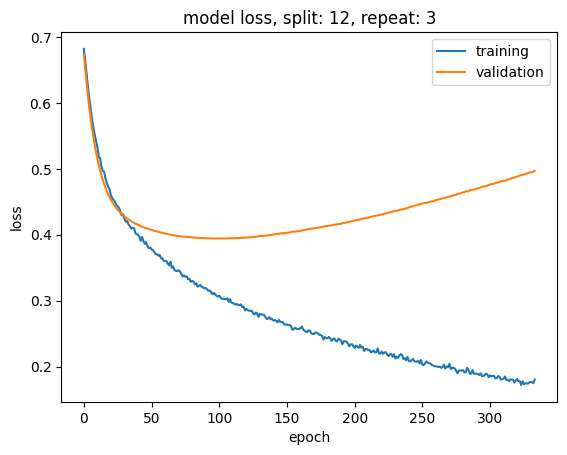

Split: 13, repeat: 3
Epochs before early stopping: 231


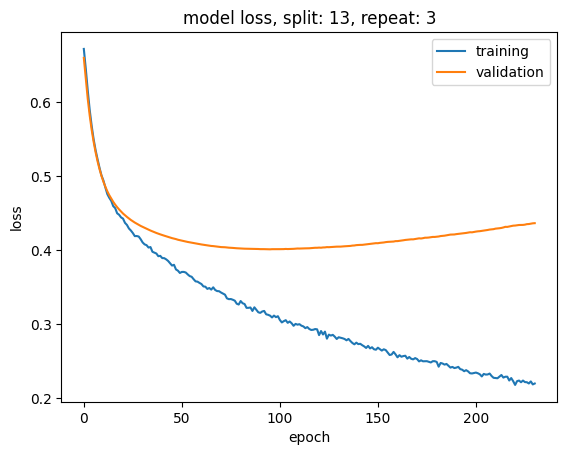

Split: 14, repeat: 3
Epochs before early stopping: 373


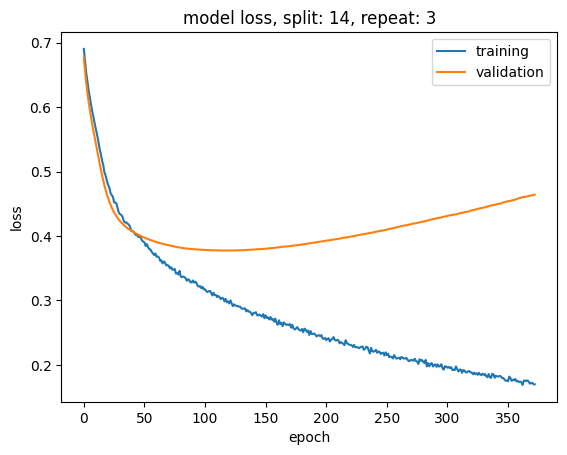

Accuracy: 0.1743(0.0161)
F1 score: 0.2973(0.0227)
Precision: 0.4716(0.0331)
Recall: 0.2481(0.0203)
AUC: 0.6185(0.0146)


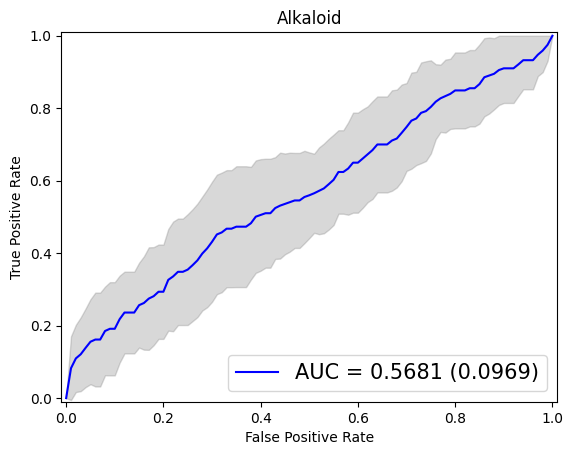

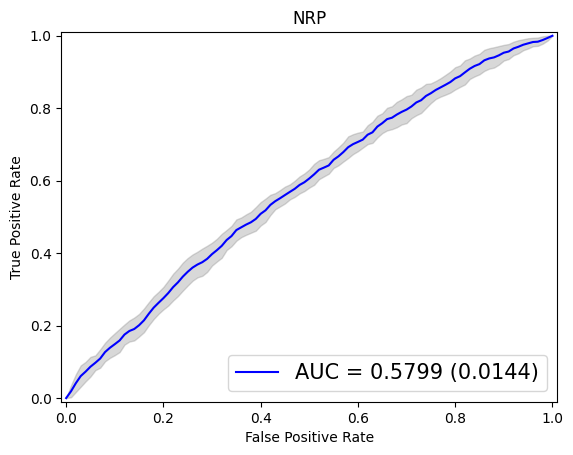

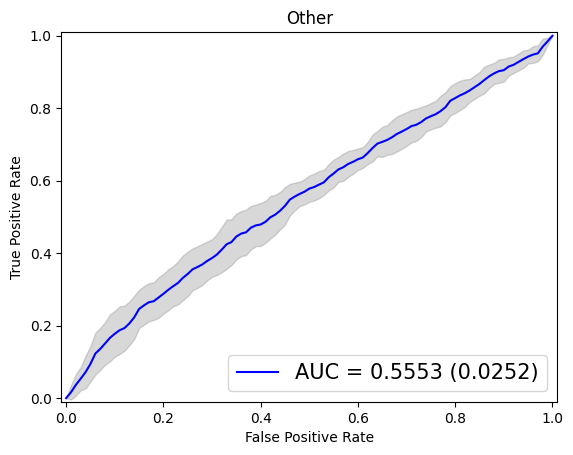

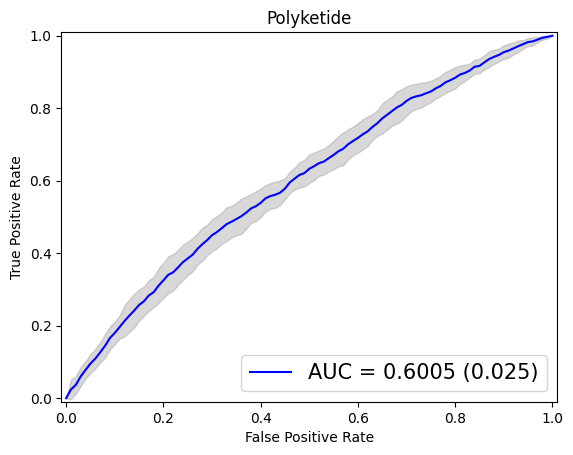

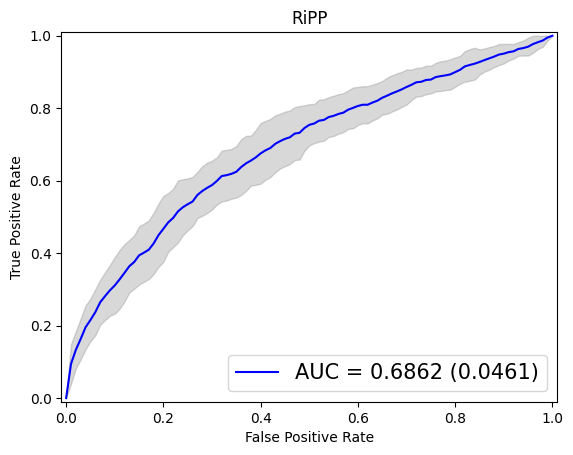

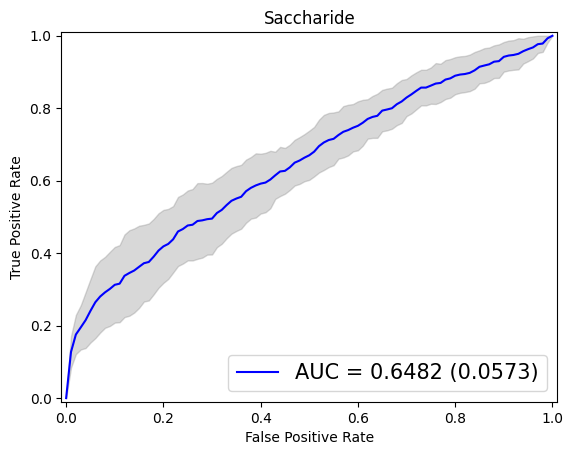

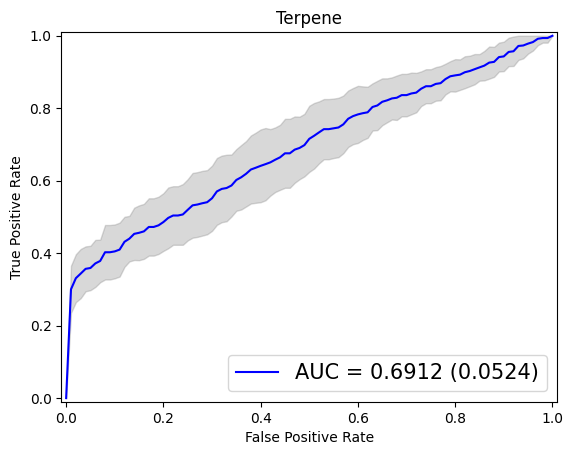

In [371]:
print('Model: NN8 (1 hidden layer, 10 nodes)')
print('Encoding: One-Hot Encoding')
print('Epochs: 500')

scores_nn8_one_hot, std_nn8_one_hot = make_classification(X_one_hot, Y, nn8(n_inputs_one_hot, n_outputs), n_epochs=500, nn=True, mlp=True, model_name='nn8', encoding='one_hot')

It appears that MLP is simply not an option for input with so many binary variables for multi-label classification problem. Since I was not able to prevent overfitting despite my efforts (early stopping, dropout, architecture simplification) I will not include these results in my final comparison.

Let's give the last NN architecture one more shot with Pfam2Vec data:

Model: NN8 (1 hidden layer, 10 nodes)
Encoding: Pfam2Vec
Epochs: 500
Split: 0, repeat: 1
Epochs before early stopping: 125


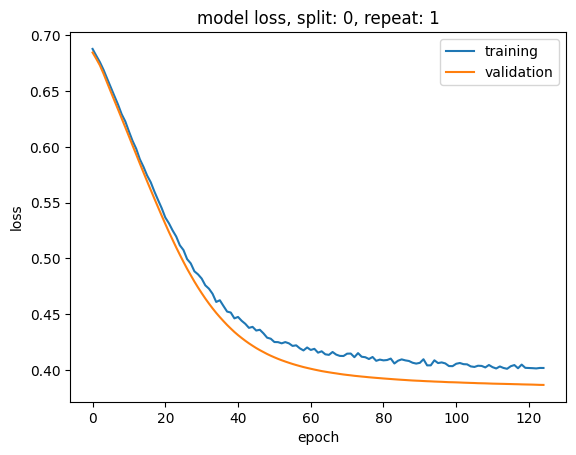

Split: 1, repeat: 1
Epochs before early stopping: 172


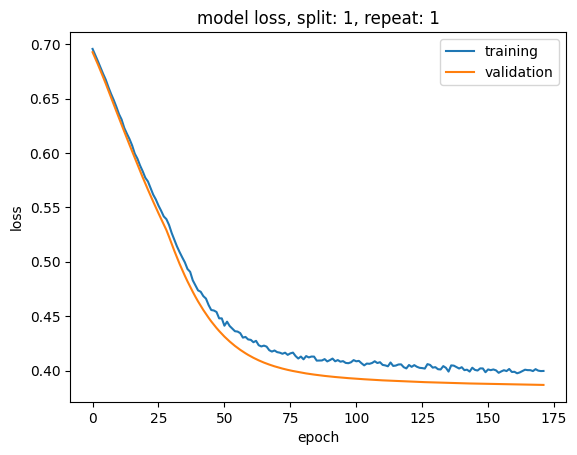

Split: 2, repeat: 1
Epochs before early stopping: 122


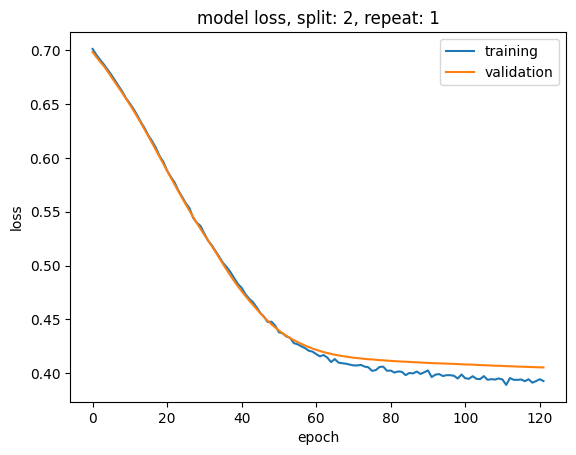

Split: 3, repeat: 1
Epochs before early stopping: 99


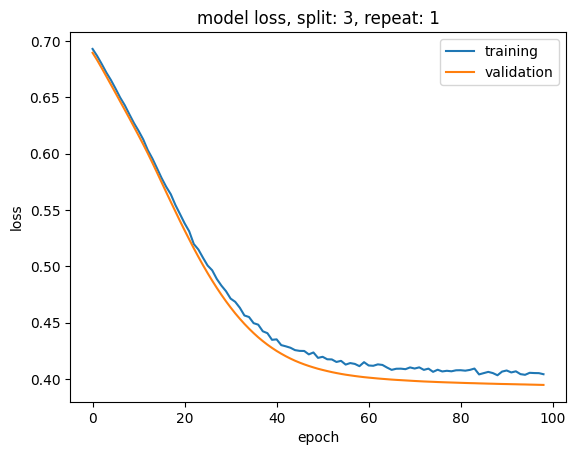

Split: 4, repeat: 1
Epochs before early stopping: 98


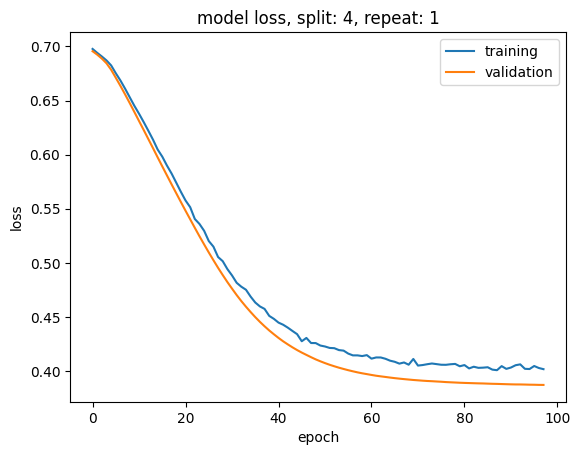

Split: 5, repeat: 2
Epochs before early stopping: 81


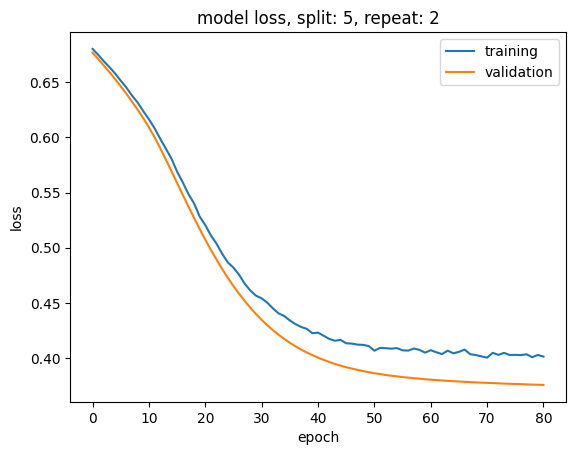

Split: 6, repeat: 2
Epochs before early stopping: 127


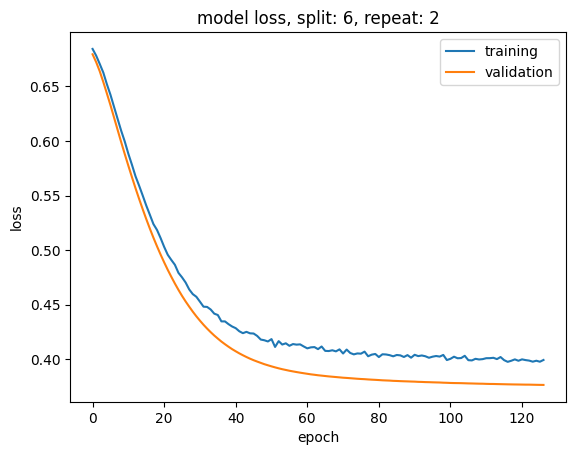

Split: 7, repeat: 2
Epochs before early stopping: 113


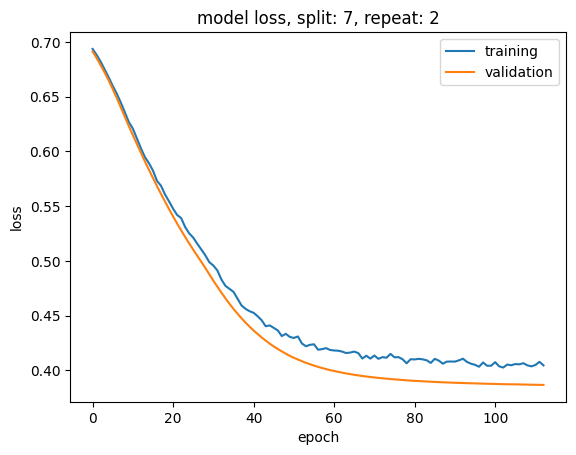

Split: 8, repeat: 2
Epochs before early stopping: 75


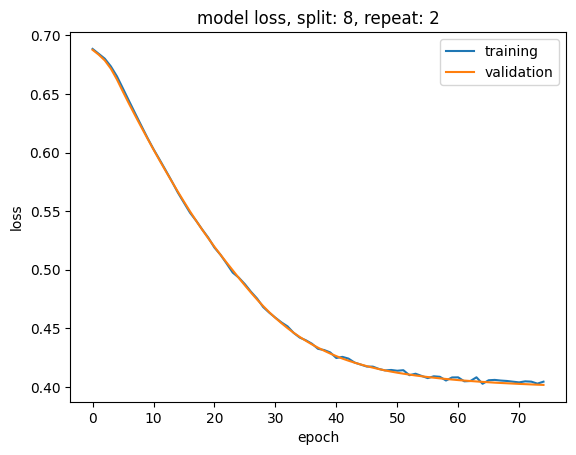

Split: 9, repeat: 2
Epochs before early stopping: 115


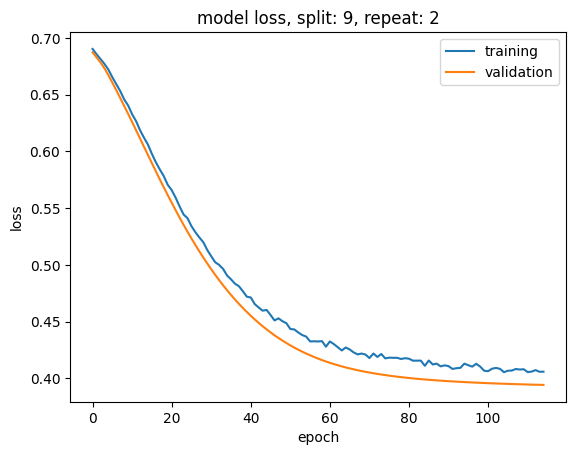

Split: 10, repeat: 3
Epochs before early stopping: 129


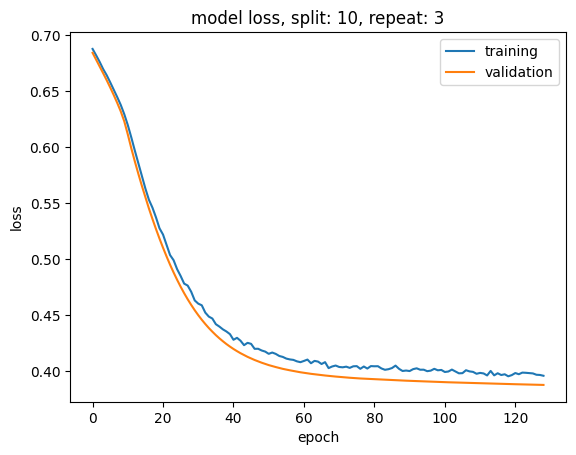

Split: 11, repeat: 3
Epochs before early stopping: 150


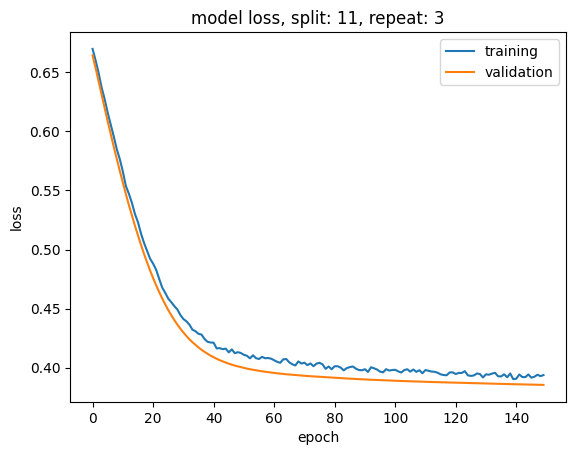

Split: 12, repeat: 3
Epochs before early stopping: 106


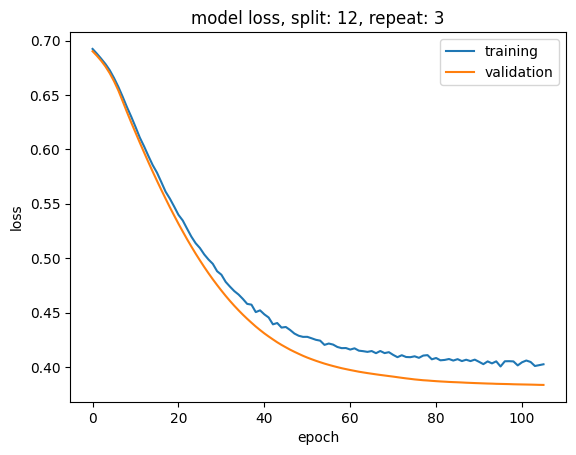

Split: 13, repeat: 3
Epochs before early stopping: 160


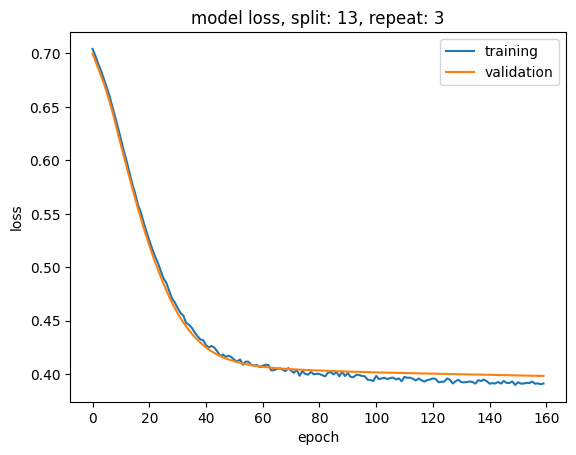

Split: 14, repeat: 3
Epochs before early stopping: 82


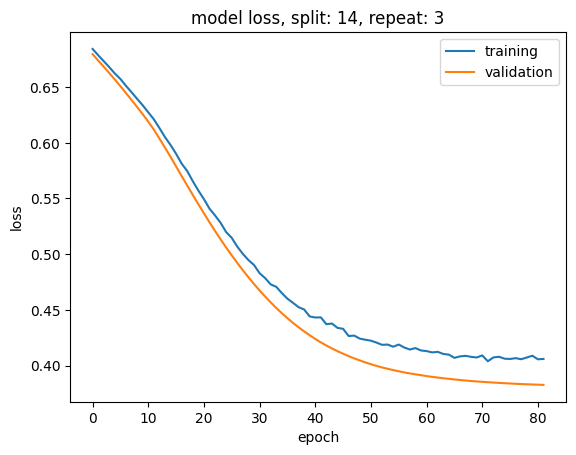

Accuracy: 0.0043(0.008)
F1 score: 0.0103(0.0186)
Precision: 0.0813(0.1012)
Recall: 0.0059(0.0113)
AUC: 0.5864(0.0223)


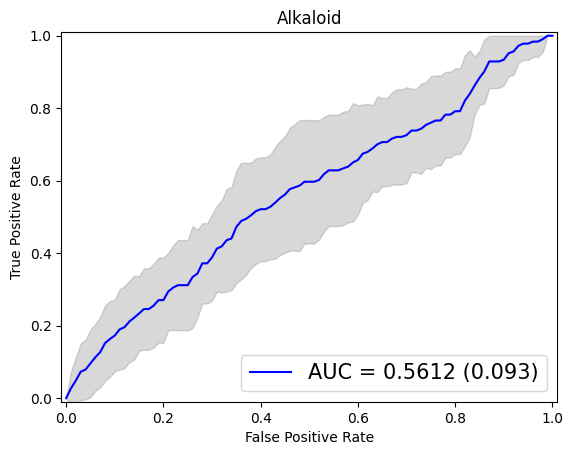

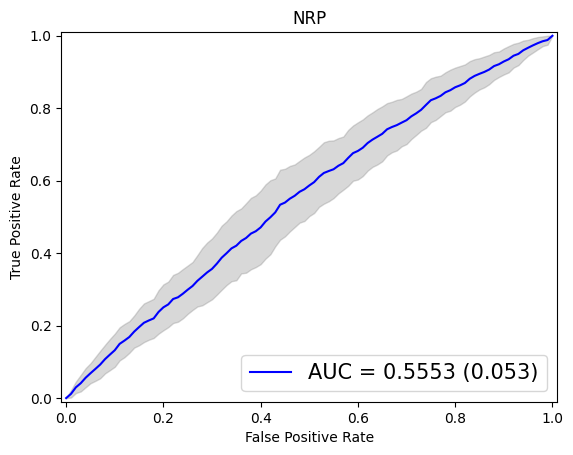

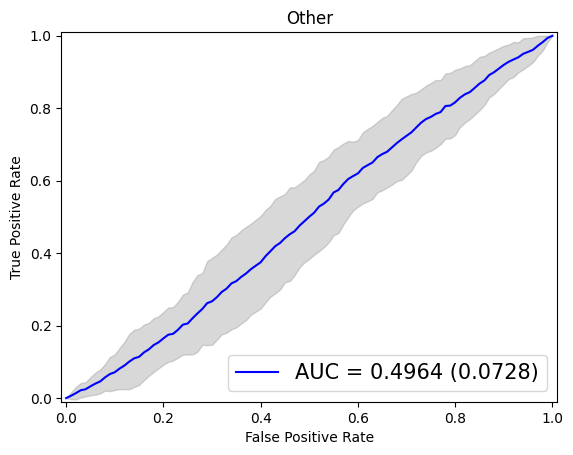

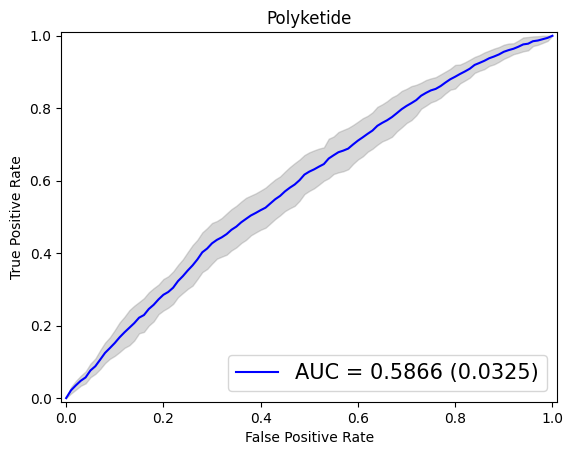

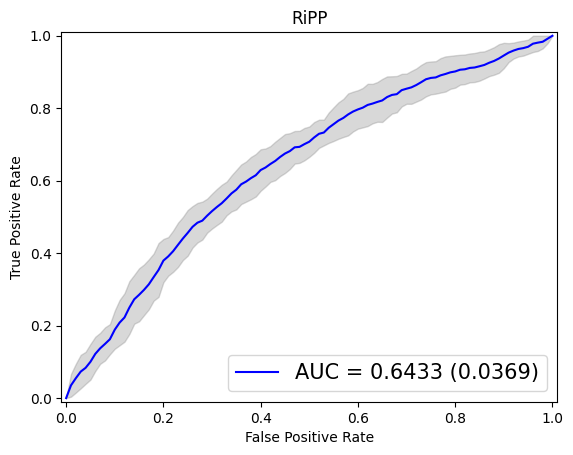

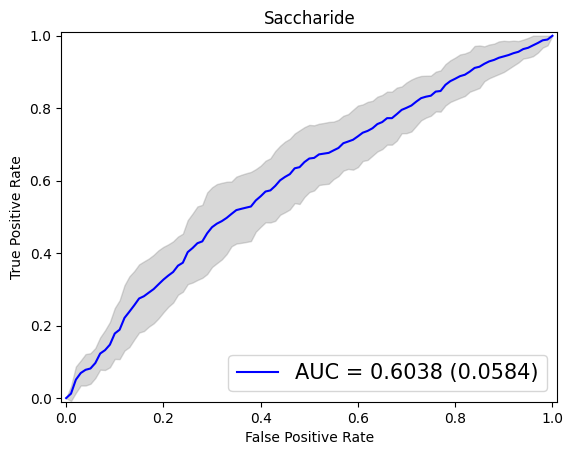

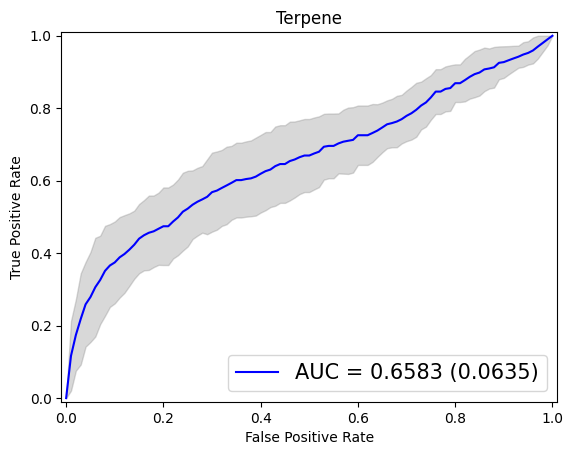

In [372]:
print('Model: NN8 (1 hidden layer, 10 nodes)')
print('Encoding: Pfam2Vec')
print('Epochs: 500')

scores_nn8_pfam, std_nn8_pfam = make_classification(X_pfamfam, Y, nn8(n_inputs_pfam, n_outputs), n_epochs=500, nn=True, mlp=True, model_name='nn8', encoding='pfam')

Finally let's compare and discuss the performance of all the used models.

In [382]:
scores_nn = [scores_nn1_pfam, scores_nn2_pfam, scores_nn3_pfam, scores_nn4_pfam, scores_nn5_pfam, scores_nn6_pfam,
            scores_nn7_pfam, scores_nn8_pfam]

model_list_nn = ["NN1 (1 hidden layer, 100 nodes)",  "NN2 (2 hidden layers, 100 nodes)", 
                 "NN3 (3 hidden layers, 100 nodes)", "NN4 (4 hidden layers, 100 nodes)", 
                 "NN5 (3 hidden layers, 50 nodes)", "NN6 (2 hidden layers, 50 nodes)",
                 "NN7 (1 hidden layer, 50 nodes)", "NN8 (1 hidden layer, 10 nodes)"]
encoding_list_nn = ["Pfam2Vec"] * 8

model_list = model_list + model_list_nn
encoding_list = encoding_list + encoding_list_nn

for el in scores_nn:
    accuracy.append(el['accuracy'])
    f1.append(el['f1_score'])
    precision.append(el['precision'])
    recall.append(el['recall'])
    auc.append(el['auc'])

results_all_models = pd.DataFrame({'Model' : model_list, 'Encoding': encoding_list, 'AUC': auc, 'Accuracy': accuracy, 
                       'F1 Score': f1, 'Precision': precision, 'Recall': recall})

results_all_models = results_all_models.sort_values(by=['AUC'], ascending=False)

results_all_models

,Model,Encoding,AUC,Accuracy,F1 Score,Precision,Recall
7,Multi Layer Perceptron,Pfam2Vec,0.9266,0.6958,0.7963,0.8585,0.7578
6,Multi Layer Perceptron,One-Hot Encoding,0.9204,0.7258,0.8287,0.8633,0.8037
10,Extra Trees (Ensemble),One-Hot Encoding,0.9146,0.7323,0.8268,0.9005,0.7860
1,Random Forest,Pfam2Vec,0.8838,0.5904,0.7321,0.8904,0.6511
4,K-Nearest Neighbors,One-Hot Encoding,0.8816,0.7123,0.7926,0.8609,0.7781
11,Extra Trees (Ensemble),Pfam2Vec,0.8806,0.5924,0.7351,0.8936,0.6555
5,K-Nearest Neighbors,Pfam2Vec,0.8711,0.6611,0.7650,0.8213,0.7519
2,Decision Tree,One-Hot Encoding,0.8340,0.7410,0.8213,0.8262,0.8190
8,Extra Tree,One-Hot Encoding,0.7977,0.6681,0.7645,0.7724,0.7613
3,Decision Tree,Pfam2Vec,0.7429,0.5583,0.6845,0.6813,0.6911


In [383]:
results_all_models.to_excel('data/classifiers_score_all_models.xlsx', index=False)

In [384]:
def get_list_of_metrics(dict_list, metric):
    new_list = []
    for d in dict_list:
        new_list.append(d[metric])
    return new_list

In [408]:
auc_nn = auc[-8:]

std_nn = [std_nn1_pfam, std_nn2_pfam, std_nn3_pfam, std_nn4_pfam, 
          std_nn5_pfam, std_nn6_pfam, std_nn7_pfam, std_nn8_pfam] 

std_auc_nn = get_list_of_metrics(std_nn, 'auc')

    
auc_df_nn = pd.DataFrame({'Model' : model_list_nn, 'Encoding': encoding_list_nn, 'AUC': auc_nn, 'Standard Deviation': std_auc_nn})
auc_df_nn = auc_df_nn.sort_values(by=['AUC'], ascending= False)

auc_df_nn

,Model,Encoding,AUC,Standard Deviation
1,"NN2 (2 hidden layers, 100 nodes)",Pfam2Vec,0.6390,0.0190
0,"NN1 (1 hidden layer, 100 nodes)",Pfam2Vec,0.6377,0.0199
2,"NN3 (3 hidden layers, 100 nodes)",Pfam2Vec,0.6373,0.0252
3,"NN4 (4 hidden layers, 100 nodes)",Pfam2Vec,0.6332,0.0199
5,"NN6 (2 hidden layers, 50 nodes)",Pfam2Vec,0.6318,0.0176
6,"NN7 (1 hidden layer, 50 nodes)",Pfam2Vec,0.6315,0.0163
4,"NN5 (3 hidden layers, 50 nodes)",Pfam2Vec,0.6139,0.0177
7,"NN8 (1 hidden layer, 10 nodes)",Pfam2Vec,0.5864,0.0223


In [378]:
auc_df_nn.to_excel('data/auc_score_nn.xlsx', index=False)

In [409]:
xticks_labels = [0] * len(auc_nn)

for i, val in enumerate(list(auc_df_nn['Model'])):
    xticks_labels[i] = list(auc_df_nn['Model'])[i][0:3]

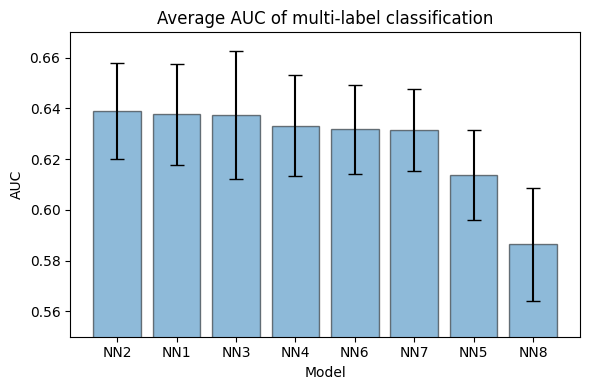

In [443]:
import matplotlib.pyplot as plt
x = [1, 2, 3, 4, 5, 6, 7, 8]

fig, ax = plt.subplots(figsize=(6, 4), tight_layout=True)

ax.bar(x, list(auc_df_nn['AUC']),
       yerr=list(auc_df_nn['Standard Deviation']),
       alpha=0.5,
       edgecolor='black',
       capsize=5)

ax.set_xlabel('Model')
ax.set_ylabel('AUC')
ax.set_title('Average AUC of multi-label classification')
ax.set_xticklabels([""] + xticks_labels)
ax.set_ylim(0.55, 0.67)
plt.savefig('data/auc_figure.png')

plt.show()